# FomulaBEAT

変更点
- 深さが2のポーランド記法を逆ポーランド記法に変換するタスク


In [1]:
version = '03-2-1'
model_dir = './model/' + version
data_path = 'data/eq03-2.txt'

In [2]:
from pathlib import Path
import math
import time
from collections import Counter
from tqdm import tqdm
import torch
from torch.utils.data import random_split
import torch.nn as nn
from torch import Tensor
from torch.nn import (
    TransformerEncoder, TransformerDecoder,
    TransformerEncoderLayer, TransformerDecoderLayer
)
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader
from torchtext.data.utils import get_tokenizer
from torchtext.vocab import vocab
from torchtext.utils import download_from_url, extract_archive
import torch.nn.functional as F


/home/arifuku/ymmtlab/TransformerAnsys/.venv/lib/python3.10/site-packages/torchtext/data/__init__.py:4: UserWarning: 
/!\ IMPORTANT WARNING ABOUT TORCHTEXT STATUS /!\ 
Torchtext is deprecated and the last released version will be 0.18 (this one). You can silence this warning by calling the following at the beginnign of your scripts: `import torchtext; torchtext.disable_torchtext_deprecation_warning()`
  warnings.warn(torchtext._TORCHTEXT_DEPRECATION_MSG)
/home/arifuku/ymmtlab/TransformerAnsys/.venv/lib/python3.10/site-packages/torchtext/vocab/__init__.py:4: UserWarning: 
/!\ IMPORTANT WARNING ABOUT TORCHTEXT STATUS /!\ 
Torchtext is deprecated and the last released version will be 0.18 (this one). You can silence this warning by calling the following at the beginnign of your scripts: `import torchtext; torchtext.disable_torchtext_deprecation_warning()`
  warnings.warn(torchtext._TORCHTEXT_DEPRECATION_MSG)
/home/arifuku/ymmtlab/TransformerAnsys/.venv/lib/python3.10/site-packages/torchte

パラメータの事前設定

In [3]:
%load_ext autoreload
%autoreload 2
torch.set_printoptions(linewidth=100)

In [4]:

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

model_dir_path = Path(model_dir)
if not model_dir_path.exists():
    model_dir_path.mkdir(parents=True)

データの取得

In [5]:
def read_equation_file(file_path):
    with open(file_path, 'r') as file:
        lines = file.readlines()
    src_data, tgt_data = [], []
    for line in lines:
        src, tgt = line.strip().split(' => ')
        src_data.append(src)
        tgt_data.append(tgt)
    return src_data, tgt_data


In [6]:
# ファイルを読み込み、数式データを取得
src_data, tgt_data = read_equation_file(data_path)
print(src_data[:3], tgt_data[:3])


['+ + 3 4 + 1 2', '+ + 8 5 + 4 6', '+ + 4 8 + 9 9'] ['3 4 + 1 2 + +', '8 5 + 4 6 + +', '4 8 + 9 9 + +']


辞書データの作成

In [52]:

SPECIALS = ['<unk>', '<pad>', '<start>', '<end>']

def build_vocab(texts):
    vocab = {}
    idx = 0
    # 数字の語彙定義
    for i in range(10):
        vocab[str(i)] = idx
        idx += 1
    # 特別語の語彙定義
    for sp in SPECIALS:
        vocab[sp] = idx
        idx += 1
    # その他の文字の語彙定義
    for text in texts:
        for char in text:
            if char not in vocab:
                vocab[char] = idx
                idx += 1
    return vocab


def convert_text_to_indexes(text, vocab):
    # <start> と <end> トークンを追加して数値化
    return [vocab['<start>']] + [vocab[char] if char in vocab else vocab['<unk>'] for char in text] + [vocab['<end>']]

# データを処理して Train と Valid に分ける関数
# データを処理して Train と Valid に分ける関数
def data_process_split(src_texts, tgt_texts, vocab_src, vocab_tgt, valid_size=0.2):
    # データを数値化
    data = []
    for (src, tgt) in zip(src_texts, tgt_texts):
        src_tensor = torch.tensor(convert_text_to_indexes(src, vocab_src), dtype=torch.long)
        tgt_tensor = torch.tensor(convert_text_to_indexes(tgt, vocab_tgt), dtype=torch.long)
        data.append((src_tensor, tgt_tensor))
    
    # データのサイズを計算して、訓練データと検証データに分割
    data_size = len(data)
    valid_size = int(valid_size * data_size)
    train_size = data_size - valid_size

    # PyTorchのrandom_splitを使って分割
    train_data, valid_data = random_split(data, [train_size, valid_size])
    
    return train_data, valid_data



In [48]:
# 辞書と逆辞書を構築
vocab_src = build_vocab(src_data)
vocab_tgt = build_vocab(tgt_data)

print(vocab_tgt)

{'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, '<unk>': 10, '<pad>': 11, '<start>': 12, '<end>': 13, ' ': 14, '+': 15}


In [51]:
convert_text_to_indexes("+ + 1 5 + 8 5", vocab_src)


+ 14
  15
+ 14
  15
1 1
  15
5 5
  15
+ 14
  15
8 8
  15
5 5


[12, 14, 15, 14, 15, 1, 15, 5, 15, 14, 15, 8, 15, 5, 13]

In [49]:

# データを数値化
train_data, valid_data = data_process_split(src_data, tgt_data, vocab_src, vocab_tgt)

# 結果の確認
print('インデックス化された文章')
print(f"Input: {train_data[0][0]}\nOutput: {train_data[0][1]}")

# インデックスから元の文字列に戻す
def convert_indexes_to_text(indexes:list, vocab):
    reverse_vocab = {idx: token for token, idx in vocab.items()}
    return ''.join([reverse_vocab[idx] for idx in indexes if idx in reverse_vocab and reverse_vocab[idx] not in ['<start>', '<end>', '<pad>']])

print('元に戻した文章')
print(f"Input: {convert_indexes_to_text(train_data[0][0].tolist(), vocab_src)}")
print(f"Output: {convert_indexes_to_text(train_data[0][1].tolist(), vocab_tgt)}")


+ 14
  15
+ 14
  15
3 3
  15
4 4
  15
+ 14
  15
1 1
  15
2 2
3 3
  14
4 4
  14
+ 15
  14
1 1
  14
2 2
  14
+ 15
  14
+ 15
+ 14
  15
+ 14
  15
8 8
  15
5 5
  15
+ 14
  15
4 4
  15
6 6
8 8
  14
5 5
  14
+ 15
  14
4 4
  14
6 6
  14
+ 15
  14
+ 15
+ 14
  15
+ 14
  15
4 4
  15
8 8
  15
+ 14
  15
9 9
  15
9 9
4 4
  14
8 8
  14
+ 15
  14
9 9
  14
9 9
  14
+ 15
  14
+ 15
+ 14
  15
+ 14
  15
3 3
  15
3 3
  15
+ 14
  15
8 8
  15
2 2
3 3
  14
3 3
  14
+ 15
  14
8 8
  14
2 2
  14
+ 15
  14
+ 15
+ 14
  15
+ 14
  15
7 7
  15
7 7
  15
+ 14
  15
0 0
  15
2 2
7 7
  14
7 7
  14
+ 15
  14
0 0
  14
2 2
  14
+ 15
  14
+ 15
+ 14
  15
+ 14
  15
8 8
  15
8 8
  15
+ 14
  15
5 5
  15
1 1
8 8
  14
8 8
  14
+ 15
  14
5 5
  14
1 1
  14
+ 15
  14
+ 15
+ 14
  15
+ 14
  15
4 4
  15
8 8
  15
+ 14
  15
1 1
  15
5 5
4 4
  14
8 8
  14
+ 15
  14
1 1
  14
5 5
  14
+ 15
  14
+ 15
+ 14
  15
+ 14
  15
4 4
  15
3 3
  15
+ 14
  15
5 5
  15
2 2
4 4
  14
3 3
  14
+ 15
  14
5 5
  14
2 2
  14
+ 15
  14
+ 15
+ 14
  15
+ 14
  15
3 3


KeyboardInterrupt: 

In [10]:
batch_size = 1024
PAD_IDX = vocab_src['<pad>']
START_IDX = vocab_src['<start>']
END_IDX = vocab_src['<end>']

def generate_batch(data_batch):
    
    batch_src, batch_tgt = [], []
    for src, tgt in data_batch:
        batch_src.append(src)
        batch_tgt.append(tgt)
        
    batch_src = pad_sequence(batch_src, padding_value=PAD_IDX)
    batch_tgt = pad_sequence(batch_tgt, padding_value=PAD_IDX)
    
    return batch_src, batch_tgt

train_iter = DataLoader(train_data, batch_size=batch_size, shuffle=True, collate_fn=generate_batch)
valid_iter = DataLoader(valid_data, batch_size=batch_size, shuffle=True, collate_fn=generate_batch)

In [11]:
len(train_data)

80000

Transoformerの設定

In [12]:
class TokenEmbedding(nn.Module):
    
    def __init__(self, vocab_size, embedding_size):
        
        super(TokenEmbedding, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_size, padding_idx=PAD_IDX)
        self.embedding_size = embedding_size
        
    def forward(self, tokens: Tensor):
        return self.embedding(tokens.long()) * math.sqrt(self.embedding_size)
    
    
class PositionalEncoding(nn.Module):
    
    def __init__(self, embedding_size: int, dropout: float, maxlen: int = 5000):
        super(PositionalEncoding, self).__init__()
        
        den = torch.exp(-torch.arange(0, embedding_size, 2) * math.log(10000) / embedding_size)
        pos = torch.arange(0, maxlen).reshape(maxlen, 1)
        embedding_pos = torch.zeros((maxlen, embedding_size))
        embedding_pos[:, 0::2] = torch.sin(pos * den)
        embedding_pos[:, 1::2] = torch.cos(pos * den)
        embedding_pos = embedding_pos.unsqueeze(-2)

        self.dropout = nn.Dropout(dropout)
        self.register_buffer('embedding_pos', embedding_pos)

    def forward(self, token_embedding: Tensor):
        return self.dropout(token_embedding + self.embedding_pos[: token_embedding.size(0), :])


In [13]:

class TransformerDecoderLayerScratch(nn.Module):
    def __init__(self, d_model, nhead, dim_feedforward, dropout=0.1):
        super(TransformerDecoderLayerScratch, self).__init__()
        # Self-attention for the decoder
        self.self_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout)
        # Multihead attention for attending to encoder outputs (memory)
        self.multihead_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout)
        # Feedforward layers
        self.linear1 = nn.Linear(d_model, dim_feedforward)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(dim_feedforward, d_model)
        # Layer normalization layers
        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)
        self.norm3 = nn.LayerNorm(d_model)
        # Dropout
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)
        self.dropout3 = nn.Dropout(dropout)

    def forward(self, tgt, memory, tgt_mask=None, memory_mask=None, tgt_key_padding_mask=None, memory_key_padding_mask=None):
        # Self-attention
        tgt2, _ = self.self_attn(tgt, tgt, tgt, attn_mask=tgt_mask, key_padding_mask=tgt_key_padding_mask)
        tgt = tgt + self.dropout1(tgt2)
        tgt = self.norm1(tgt)
        
        # Attention with the encoder outputs (memory)
        tgt2, _ = self.multihead_attn(tgt, memory, memory, attn_mask=memory_mask, key_padding_mask=memory_key_padding_mask)
        tgt = tgt + self.dropout2(tgt2)
        tgt = self.norm2(tgt)
        
        # Feedforward network
        tgt2 = self.linear2(self.dropout(F.relu(self.linear1(tgt))))
        tgt = tgt + self.dropout3(tgt2)
        tgt = self.norm3(tgt)

        return tgt


In [14]:

class Seq2SeqTransformer(nn.Module):
    
    def __init__(
        self, num_encoder_layers: int, num_decoder_layers: int,
        embedding_size: int, vocab_size_src: int, vocab_size_tgt: int,
        dim_feedforward:int = 512, dropout:float = 0.1, nhead:int = 8
    ):
        
        super(Seq2SeqTransformer, self).__init__()

        self.token_embedding_src = TokenEmbedding(vocab_size_src, embedding_size)
        self.positional_encoding = PositionalEncoding(embedding_size, dropout=dropout)
        
        self.token_embedding_tgt = TokenEmbedding(vocab_size_tgt, embedding_size)
        self.decoder_layer = TransformerDecoderLayerScratch(
            d_model=embedding_size, nhead=nhead, dim_feedforward=dim_feedforward, dropout=dropout
        )
        
        self.output = nn.Linear(embedding_size, vocab_size_tgt)

    def forward(
        self, src: Tensor, tgt: Tensor,
        mask_src: Tensor, mask_tgt: Tensor,
        padding_mask_src: Tensor, padding_mask_tgt: Tensor,
        memory_key_padding_mask: Tensor
    ):
        embedding_src = self.positional_encoding(self.token_embedding_src(src))
        # memory = self.transformer_encoder(embedding_src, mask_src, padding_mask_src)
        embedding_tgt = self.positional_encoding(self.token_embedding_tgt(tgt))
        outs = self.decoder_layer(
            embedding_tgt, embedding_src, mask_tgt, None,
            padding_mask_tgt, memory_key_padding_mask
        )
        return self.output(outs)

    def decode(self, tgt: Tensor, memory: Tensor, mask_tgt: Tensor):
        return self.decoder_layer(self.positional_encoding(self.token_embedding_tgt(tgt)), memory, mask_tgt)

In [15]:
def create_mask(src, tgt, PAD_IDX):
    
    seq_len_src = src.shape[0]
    seq_len_tgt = tgt.shape[0]

    mask_src = torch.zeros((seq_len_src, seq_len_src), device=device).type(torch.bool)
    mask_tgt = generate_square_subsequent_mask(seq_len_tgt)

    padding_mask_src = (src == PAD_IDX).transpose(0, 1)
    padding_mask_tgt = (tgt == PAD_IDX).transpose(0, 1)
    
    return mask_src, mask_tgt, padding_mask_src, padding_mask_tgt


def generate_square_subsequent_mask(seq_len):
    mask = (torch.triu(torch.ones((seq_len, seq_len), device=device)) == 1).transpose(0, 1)
    mask = mask.float().masked_fill(mask == 0, float('-inf')).masked_fill(mask == 1, float(0.0))
    return mask

学習の定義

In [16]:
def train(model, data, optimizer, criterion, PAD_IDX):
    
    model.train()
    losses = 0
    for src, tgt in tqdm(data):
        
        src = src.to(device)
        tgt = tgt.to(device)

        input_tgt = tgt[:-1, :]

        mask_src, mask_tgt, padding_mask_src, padding_mask_tgt = create_mask(src, input_tgt, PAD_IDX)

        logits = model(
            src=src, tgt=input_tgt,
            mask_src=mask_src, mask_tgt=mask_tgt,
            padding_mask_src=padding_mask_src, padding_mask_tgt=padding_mask_tgt,
            memory_key_padding_mask=padding_mask_src
        )

        optimizer.zero_grad()
        output_tgt = tgt[1:, :]
        loss = criterion(logits.reshape(-1, logits.shape[-1]), output_tgt.reshape(-1))
        loss.backward()

        optimizer.step()
        losses += loss.item()
        
    return losses / len(data)

In [17]:

def evaluate(model, data, criterion, PAD_IDX):
    
    model.eval()
    losses = 0
    for src, tgt in data:
        
        src = src.to(device)
        tgt = tgt.to(device)

        input_tgt = tgt[:-1, :]

        mask_src, mask_tgt, padding_mask_src, padding_mask_tgt = create_mask(src, input_tgt, PAD_IDX)

        logits = model(
            src=src, tgt=input_tgt,
            mask_src=mask_src, mask_tgt=mask_tgt,
            padding_mask_src=padding_mask_src, padding_mask_tgt=padding_mask_tgt,
            memory_key_padding_mask=padding_mask_src
        )
        
        output_tgt = tgt[1:, :]
        loss = criterion(logits.reshape(-1, logits.shape[-1]), output_tgt.reshape(-1))
        losses += loss.item()
        
    return losses / len(data)

設定

In [18]:
vocab_size_src = len(vocab_src)
vocab_size_tgt = len(vocab_tgt)
embedding_size = 4
nhead = 1
dim_feedforward = 4
num_encoder_layers = 1
num_decoder_layers = 1
dropout = 0
# vocab_size_src = len(vocab_src)
# vocab_size_tgt = len(vocab_tgt)
# embedding_size = 240
# nhead = 8
# dim_feedforward = 100
# num_encoder_layers = 2
# num_decoder_layers = 2
# dropout = 0.1

model = Seq2SeqTransformer(
    num_encoder_layers=num_encoder_layers,
    num_decoder_layers=num_decoder_layers,
    embedding_size=embedding_size,
    vocab_size_src=vocab_size_src, vocab_size_tgt=vocab_size_tgt,
    dim_feedforward=dim_feedforward,
    dropout=dropout, nhead=nhead
)

for p in model.parameters():
    if p.dim() > 1:
        nn.init.xavier_uniform_(p)

model = model.to(device)

criterion = torch.nn.CrossEntropyLoss(ignore_index=PAD_IDX)

optimizer = torch.optim.Adam(model.parameters())

モデルの調査

In [19]:
print(model)

Seq2SeqTransformer(
  (token_embedding_src): TokenEmbedding(
    (embedding): Embedding(16, 4, padding_idx=11)
  )
  (positional_encoding): PositionalEncoding(
    (dropout): Dropout(p=0, inplace=False)
  )
  (token_embedding_tgt): TokenEmbedding(
    (embedding): Embedding(16, 4, padding_idx=11)
  )
  (decoder_layer): TransformerDecoderLayerScratch(
    (self_attn): MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=4, out_features=4, bias=True)
    )
    (multihead_attn): MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=4, out_features=4, bias=True)
    )
    (linear1): Linear(in_features=4, out_features=4, bias=True)
    (dropout): Dropout(p=0, inplace=False)
    (linear2): Linear(in_features=4, out_features=4, bias=True)
    (norm1): LayerNorm((4,), eps=1e-05, elementwise_affine=True)
    (norm2): LayerNorm((4,), eps=1e-05, elementwise_affine=True)
    (norm3): LayerNorm((4,), eps=1e-05, elementwise_affine=True)
    (d

In [20]:
# モデル内の層の名前とパラメータ情報を表示
LP = list(model.named_parameters())
lp = len(LP)
print(f"{lp} 層")
for p in range(0, lp):
    print(f"\n層名: {LP[p][0]}")
    print(f"形状: {LP[p][1].shape}")
    print(f"値: {LP[p][1]}")


22 層

層名: token_embedding_src.embedding.weight
形状: torch.Size([16, 4])
値: Parameter containing:
tensor([[-0.0355,  0.2496, -0.2316,  0.2511],
        [ 0.1192, -0.4490, -0.4875, -0.3421],
        [-0.1710, -0.0746, -0.5268,  0.3090],
        [ 0.0348,  0.4780,  0.1125,  0.3344],
        [-0.3198, -0.3018,  0.2841, -0.4450],
        [ 0.3583,  0.1939, -0.2444,  0.2857],
        [-0.1558, -0.4559,  0.4556,  0.3325],
        [ 0.4148,  0.2251, -0.1335, -0.5013],
        [-0.2278,  0.1188,  0.1178,  0.4296],
        [ 0.0425, -0.2217,  0.0448, -0.3746],
        [-0.4537, -0.2129, -0.3127, -0.0288],
        [-0.0707,  0.2403,  0.1902,  0.2311],
        [ 0.1397,  0.4772, -0.5190,  0.5255],
        [ 0.2989, -0.0518, -0.1143, -0.0373],
        [-0.2474, -0.2850,  0.4102,  0.0168],
        [-0.1912, -0.3926, -0.5105,  0.0138]], device='cuda:0', requires_grad=True)

層名: token_embedding_tgt.embedding.weight
形状: torch.Size([16, 4])
値: Parameter containing:
tensor([[ 0.0051,  0.2955, -0.0782,  0.

## 学習実行

In [21]:
epoch = 100
best_loss = float('Inf')
best_model = None
patience = 10
counter = 0

for loop in range(1, epoch + 1):
    
    start_time = time.time()
    
    loss_train = train(
        model=model, data=train_iter, optimizer=optimizer,
        criterion=criterion, PAD_IDX=PAD_IDX
    )
    
    elapsed_time = time.time() - start_time
    
    loss_valid = evaluate(
        model=model, data=valid_iter, criterion=criterion, PAD_IDX=PAD_IDX
    )
    
    print('[{}/{}] train loss: {:.2f}, valid loss: {:.2f}  [{}{:.0f}s] counter: {} {}'.format(
        loop, epoch,
        loss_train, loss_valid,
        str(int(math.floor(elapsed_time / 60))) + 'm' if math.floor(elapsed_time / 60) > 0 else '',
        elapsed_time % 60,
        counter,
        '**' if best_loss > loss_valid else ''
    ))
    
    if best_loss > loss_valid:
        best_loss = loss_valid
        best_model = model
        counter = 0
        
    if counter > patience:
        break
    
    counter += 1

  0%|          | 0/79 [00:00<?, ?it/s]/home/arifuku/ymmtlab/TransformerAnsys/.venv/lib/python3.10/site-packages/torch/nn/functional.py:5137: UserWarning: Support for mismatched key_padding_mask and attn_mask is deprecated. Use same type for both instead.
  warnings.warn(
100%|██████████| 79/79 [00:01<00:00, 54.05it/s]


[1/100] train loss: 2.59, valid loss: 2.37  [1s] counter: 0 **


100%|██████████| 79/79 [00:01<00:00, 61.88it/s]


[2/100] train loss: 2.06, valid loss: 1.74  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.59it/s]


[3/100] train loss: 1.51, valid loss: 1.31  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.50it/s]


[4/100] train loss: 1.17, valid loss: 1.05  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.34it/s]


[5/100] train loss: 0.98, valid loss: 0.92  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.24it/s]


[6/100] train loss: 0.88, valid loss: 0.84  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.60it/s]


[7/100] train loss: 0.82, valid loss: 0.79  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.44it/s]


[8/100] train loss: 0.78, valid loss: 0.76  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.34it/s]


[9/100] train loss: 0.75, valid loss: 0.74  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.45it/s]


[10/100] train loss: 0.73, valid loss: 0.72  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.85it/s]


[11/100] train loss: 0.71, valid loss: 0.70  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.35it/s]


[12/100] train loss: 0.69, valid loss: 0.68  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.36it/s]


[13/100] train loss: 0.68, valid loss: 0.67  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.26it/s]


[14/100] train loss: 0.67, valid loss: 0.66  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.32it/s]


[15/100] train loss: 0.66, valid loss: 0.65  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.26it/s]


[16/100] train loss: 0.65, valid loss: 0.65  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.43it/s]


[17/100] train loss: 0.64, valid loss: 0.64  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.63it/s]


[18/100] train loss: 0.64, valid loss: 0.63  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.44it/s]


[19/100] train loss: 0.63, valid loss: 0.64  [1s] counter: 1 


100%|██████████| 79/79 [00:01<00:00, 62.67it/s]


[20/100] train loss: 0.62, valid loss: 0.61  [1s] counter: 2 **


100%|██████████| 79/79 [00:01<00:00, 62.08it/s]


[21/100] train loss: 0.61, valid loss: 0.60  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.48it/s]


[22/100] train loss: 0.60, valid loss: 0.60  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.37it/s]


[23/100] train loss: 0.59, valid loss: 0.59  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.74it/s]


[24/100] train loss: 0.58, valid loss: 0.57  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.82it/s]


[25/100] train loss: 0.57, valid loss: 0.56  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.63it/s]


[26/100] train loss: 0.55, valid loss: 0.55  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.37it/s]


[27/100] train loss: 0.54, valid loss: 0.54  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.17it/s]


[28/100] train loss: 0.53, valid loss: 0.53  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.70it/s]


[29/100] train loss: 0.52, valid loss: 0.51  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.36it/s]


[30/100] train loss: 0.51, valid loss: 0.50  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.66it/s]


[31/100] train loss: 0.50, valid loss: 0.50  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.73it/s]


[32/100] train loss: 0.49, valid loss: 0.49  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.74it/s]


[33/100] train loss: 0.49, valid loss: 0.48  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.80it/s]


[34/100] train loss: 0.48, valid loss: 0.48  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.31it/s]


[35/100] train loss: 0.47, valid loss: 0.47  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.99it/s]


[36/100] train loss: 0.46, valid loss: 0.46  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.51it/s]


[37/100] train loss: 0.45, valid loss: 0.45  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.92it/s]


[38/100] train loss: 0.44, valid loss: 0.44  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.75it/s]


[39/100] train loss: 0.43, valid loss: 0.43  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.83it/s]


[40/100] train loss: 0.42, valid loss: 0.42  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.97it/s]


[41/100] train loss: 0.41, valid loss: 0.41  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 64.00it/s]


[42/100] train loss: 0.41, valid loss: 0.41  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.94it/s]


[43/100] train loss: 0.40, valid loss: 0.40  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.20it/s]


[44/100] train loss: 0.39, valid loss: 0.39  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.83it/s]


[45/100] train loss: 0.38, valid loss: 0.38  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 64.04it/s]


[46/100] train loss: 0.38, valid loss: 0.37  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 64.11it/s]


[47/100] train loss: 0.37, valid loss: 0.36  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.84it/s]


[48/100] train loss: 0.36, valid loss: 0.35  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.77it/s]


[49/100] train loss: 0.34, valid loss: 0.34  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.88it/s]


[50/100] train loss: 0.33, valid loss: 0.33  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.41it/s]


[51/100] train loss: 0.32, valid loss: 0.31  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.99it/s]


[52/100] train loss: 0.31, valid loss: 0.31  [1s] counter: 1 


100%|██████████| 79/79 [00:01<00:00, 63.29it/s]


[53/100] train loss: 0.30, valid loss: 0.31  [1s] counter: 2 **


100%|██████████| 79/79 [00:01<00:00, 63.63it/s]


[54/100] train loss: 0.30, valid loss: 0.30  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.39it/s]


[55/100] train loss: 0.29, valid loss: 0.28  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 61.72it/s]


[56/100] train loss: 0.28, valid loss: 0.28  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.57it/s]


[57/100] train loss: 0.27, valid loss: 0.27  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.82it/s]


[58/100] train loss: 0.27, valid loss: 0.29  [1s] counter: 1 


100%|██████████| 79/79 [00:01<00:00, 63.74it/s]


[59/100] train loss: 0.26, valid loss: 0.26  [1s] counter: 2 **


100%|██████████| 79/79 [00:01<00:00, 63.81it/s]


[60/100] train loss: 0.26, valid loss: 0.26  [1s] counter: 1 


100%|██████████| 79/79 [00:01<00:00, 63.69it/s]


[61/100] train loss: 0.26, valid loss: 0.27  [1s] counter: 2 


100%|██████████| 79/79 [00:01<00:00, 63.76it/s]


[62/100] train loss: 0.25, valid loss: 0.25  [1s] counter: 3 **


100%|██████████| 79/79 [00:01<00:00, 63.20it/s]


[63/100] train loss: 0.25, valid loss: 0.24  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 64.14it/s]


[64/100] train loss: 0.24, valid loss: 0.24  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.49it/s]


[65/100] train loss: 0.24, valid loss: 0.25  [1s] counter: 1 


100%|██████████| 79/79 [00:01<00:00, 63.39it/s]


[66/100] train loss: 0.24, valid loss: 0.24  [1s] counter: 2 **


100%|██████████| 79/79 [00:01<00:00, 63.21it/s]


[67/100] train loss: 0.24, valid loss: 0.24  [1s] counter: 1 


100%|██████████| 79/79 [00:01<00:00, 63.58it/s]


[68/100] train loss: 0.23, valid loss: 0.24  [1s] counter: 2 


100%|██████████| 79/79 [00:01<00:00, 63.95it/s]


[69/100] train loss: 0.23, valid loss: 0.23  [1s] counter: 3 **


100%|██████████| 79/79 [00:01<00:00, 63.46it/s]


[70/100] train loss: 0.23, valid loss: 0.23  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.98it/s]


[71/100] train loss: 0.22, valid loss: 0.22  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.05it/s]


[72/100] train loss: 0.22, valid loss: 0.22  [1s] counter: 1 


100%|██████████| 79/79 [00:01<00:00, 62.65it/s]


[73/100] train loss: 0.22, valid loss: 0.23  [1s] counter: 2 


100%|██████████| 79/79 [00:01<00:00, 64.01it/s]


[74/100] train loss: 0.22, valid loss: 0.21  [1s] counter: 3 **


100%|██████████| 79/79 [00:01<00:00, 63.38it/s]


[75/100] train loss: 0.21, valid loss: 0.21  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.32it/s]


[76/100] train loss: 0.21, valid loss: 0.22  [1s] counter: 1 


100%|██████████| 79/79 [00:01<00:00, 63.62it/s]


[77/100] train loss: 0.21, valid loss: 0.20  [1s] counter: 2 **


100%|██████████| 79/79 [00:01<00:00, 63.82it/s]


[78/100] train loss: 0.21, valid loss: 0.20  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.79it/s]


[79/100] train loss: 0.20, valid loss: 0.20  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.81it/s]


[80/100] train loss: 0.20, valid loss: 0.19  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.90it/s]


[81/100] train loss: 0.20, valid loss: 0.21  [1s] counter: 1 


100%|██████████| 79/79 [00:01<00:00, 64.24it/s]


[82/100] train loss: 0.19, valid loss: 0.19  [1s] counter: 2 **


100%|██████████| 79/79 [00:01<00:00, 63.83it/s]


[83/100] train loss: 0.19, valid loss: 0.20  [1s] counter: 1 


100%|██████████| 79/79 [00:01<00:00, 62.45it/s]


[84/100] train loss: 0.17, valid loss: 0.16  [1s] counter: 2 **


100%|██████████| 79/79 [00:01<00:00, 62.72it/s]


[85/100] train loss: 0.17, valid loss: 0.17  [1s] counter: 1 


100%|██████████| 79/79 [00:01<00:00, 63.86it/s]


[86/100] train loss: 0.16, valid loss: 0.15  [1s] counter: 2 **


100%|██████████| 79/79 [00:01<00:00, 63.80it/s]


[87/100] train loss: 0.16, valid loss: 0.16  [1s] counter: 1 


100%|██████████| 79/79 [00:01<00:00, 63.31it/s]


[88/100] train loss: 0.17, valid loss: 0.20  [1s] counter: 2 


100%|██████████| 79/79 [00:01<00:00, 63.28it/s]


[89/100] train loss: 0.15, valid loss: 0.15  [1s] counter: 3 **


100%|██████████| 79/79 [00:01<00:00, 62.22it/s]


[90/100] train loss: 0.15, valid loss: 0.14  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 64.00it/s]


[91/100] train loss: 0.14, valid loss: 0.16  [1s] counter: 1 


100%|██████████| 79/79 [00:01<00:00, 63.33it/s]


[92/100] train loss: 0.17, valid loss: 0.14  [1s] counter: 2 **


100%|██████████| 79/79 [00:01<00:00, 63.07it/s]


[93/100] train loss: 0.14, valid loss: 0.14  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.16it/s]


[94/100] train loss: 0.13, valid loss: 0.13  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.42it/s]


[95/100] train loss: 0.13, valid loss: 0.16  [1s] counter: 1 


100%|██████████| 79/79 [00:01<00:00, 63.29it/s]


[96/100] train loss: 0.13, valid loss: 0.13  [1s] counter: 2 **


100%|██████████| 79/79 [00:01<00:00, 63.66it/s]


[97/100] train loss: 0.15, valid loss: 0.12  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.24it/s]


[98/100] train loss: 0.12, valid loss: 0.12  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 62.90it/s]


[99/100] train loss: 0.12, valid loss: 0.11  [1s] counter: 1 **


100%|██████████| 79/79 [00:01<00:00, 63.27it/s]


[100/100] train loss: 0.11, valid loss: 0.11  [1s] counter: 1 **


学習したモデルの保存

In [22]:
torch.save(best_model.state_dict(), model_dir_path.joinpath(version + 'translation_transfomer.pth'))

学習したモデルを使って翻訳をする

In [23]:
def translate(
    model, text, vocab_src, vocab_tgt, seq_len_tgt,
    START_IDX, END_IDX
):
    model.eval()
    tokens_src = convert_text_to_indexes(text, vocab=vocab_src)
    num_tokens_src = len(tokens_src)

    # Tensorに変換
    src = torch.LongTensor(tokens_src).reshape(num_tokens_src, 1).to(device)
    mask_src = torch.zeros((num_tokens_src, num_tokens_src), device=device).type(torch.bool)

    # デコード
    predicts = greedy_decode(
        model=model, src=src,
        mask_src=mask_src, seq_len_tgt=seq_len_tgt,
        START_IDX=START_IDX, END_IDX=END_IDX
    ).flatten()

    return convert_indexes_to_text(predicts.tolist(), vocab=vocab_tgt)

def greedy_decode(model, src, mask_src, seq_len_tgt, START_IDX, END_IDX):
    src = src.to(device)
    mask_src = mask_src.to(device)

    # ソースの埋め込みをメモリとして利用
    memory = model.positional_encoding(model.token_embedding_src(src))
    
    ys = torch.ones(1, 1).fill_(START_IDX).type(torch.long).to(device)
    
    for i in range(seq_len_tgt - 1):
        memory = memory.to(device)
        mask_tgt = generate_square_subsequent_mask(ys.size(0)).to(device).type(torch.bool)
        
        output = model.decode(ys, memory, mask_tgt)
        output = output.transpose(0, 1)
        output = model.output(output[:, -1])
        
        # 最も高いスコアのトークンを取得
        _, next_word = torch.max(output, dim=1)
        next_word = next_word.item()

        # 生成されたトークンを追加
        ys = torch.cat([ys, torch.ones(1, 1).fill_(next_word).type_as(src.data)], dim=0)
        if next_word == END_IDX:
            break
    
    return ys


In [24]:
seq_len_tgt = max([len(x[1]) for x in train_data])
text = '20'

# 翻訳を実行
translation = translate(
    model=best_model, text=text, vocab_src=vocab_src, vocab_tgt=vocab_tgt,
    seq_len_tgt=seq_len_tgt,
    START_IDX=START_IDX, END_IDX=END_IDX
)

print(f"Input: {text}")
print(f"Output: {translation}")

Input: 20
Output: 4 3 9 4 3 9 5 


In [31]:
# 様々な入力を試してみる

text_list = {
'+ + 1 5 + 8 5':'1 5 + 8 5 + +',
'+ + 1 6 + 8 6':'1 6 + 8 6 + +',
'+ + 9 5 + 7 1':'9 5 + 7 1 + +',
'+ + 6 5 + 7 9':'6 5 + 7 9 + +',
'+ + 9 2 + 6 0':'9 2 + 6 0 + +'}
# text_list += { '+ 2 7':'2 7 -', '+ 9 7' : '9 7 -', '+ + 2 7 4' : '2 7 - 4 +', '+ + 6 9 - 7 3' : '6 9 - 7 3 - -', '+ + + + + + + 4 6 3 7 + 6 7 1 9 + + 3 6 2' : '4 6 + 3 + 7 + 6 7 + + 1 + 9 - 3 6 + 2 + + '}

for text, tgt in text_list.items():
    translation = translate(
        model=best_model, text=text, vocab_src=vocab_src, vocab_tgt=vocab_tgt,
        seq_len_tgt=seq_len_tgt,
        START_IDX=START_IDX, END_IDX=END_IDX
    )
    print(f"Input: {text}")
    print(f"Output: {translation}")
    print(f"Target: {tgt}")
    print('---')


Input: + + 1 5 + 8 5
Output: 1 5 + 8 5 + +
Target: 1 5 + 8 5 + +
---
Input: + + 1 6 + 8 6
Output: 1 6 + 0 6 + +
Target: 1 6 + 8 6 + +
---
Input: + + 9 5 + 7 1
Output: 6 5 + 7 1 + +
Target: 9 5 + 7 1 + +
---
Input: + + 6 5 + 7 9
Output: 6 5 + 7 6 + +
Target: 6 5 + 7 9 + +
---
Input: + + 9 2 + 6 0
Output: 4 2 + 9 0 + +
Target: 9 2 + 6 0 + +
---


## モデルの動作を分析

In [32]:
import torch

# モデルのロード
model_path = model_dir_path.joinpath(version + 'translation_transfomer.pth')
loaded_model = Seq2SeqTransformer(
    num_encoder_layers=num_encoder_layers,
    num_decoder_layers=num_decoder_layers,
    embedding_size=embedding_size,
    vocab_size_src=vocab_size_src, vocab_size_tgt=vocab_size_tgt,
    dim_feedforward=dim_feedforward,
    dropout=dropout, nhead=nhead
).to(device)
loaded_model.load_state_dict(torch.load(model_path))
loaded_model.eval()


Seq2SeqTransformer(
  (token_embedding_src): TokenEmbedding(
    (embedding): Embedding(16, 4, padding_idx=11)
  )
  (positional_encoding): PositionalEncoding(
    (dropout): Dropout(p=0, inplace=False)
  )
  (token_embedding_tgt): TokenEmbedding(
    (embedding): Embedding(16, 4, padding_idx=11)
  )
  (decoder_layer): TransformerDecoderLayerScratch(
    (self_attn): MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=4, out_features=4, bias=True)
    )
    (multihead_attn): MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=4, out_features=4, bias=True)
    )
    (linear1): Linear(in_features=4, out_features=4, bias=True)
    (dropout): Dropout(p=0, inplace=False)
    (linear2): Linear(in_features=4, out_features=4, bias=True)
    (norm1): LayerNorm((4,), eps=1e-05, elementwise_affine=True)
    (norm2): LayerNorm((4,), eps=1e-05, elementwise_affine=True)
    (norm3): LayerNorm((4,), eps=1e-05, elementwise_affine=True)
    (d

In [33]:

# モデルのパラメータを確認
params = dict(loaded_model.named_parameters())

for k, v in params.items():
    print(k, v.shape)



token_embedding_src.embedding.weight torch.Size([16, 4])
token_embedding_tgt.embedding.weight torch.Size([16, 4])
decoder_layer.self_attn.in_proj_weight torch.Size([12, 4])
decoder_layer.self_attn.in_proj_bias torch.Size([12])
decoder_layer.self_attn.out_proj.weight torch.Size([4, 4])
decoder_layer.self_attn.out_proj.bias torch.Size([4])
decoder_layer.multihead_attn.in_proj_weight torch.Size([12, 4])
decoder_layer.multihead_attn.in_proj_bias torch.Size([12])
decoder_layer.multihead_attn.out_proj.weight torch.Size([4, 4])
decoder_layer.multihead_attn.out_proj.bias torch.Size([4])
decoder_layer.linear1.weight torch.Size([4, 4])
decoder_layer.linear1.bias torch.Size([4])
decoder_layer.linear2.weight torch.Size([4, 4])
decoder_layer.linear2.bias torch.Size([4])
decoder_layer.norm1.weight torch.Size([4])
decoder_layer.norm1.bias torch.Size([4])
decoder_layer.norm2.weight torch.Size([4])
decoder_layer.norm2.bias torch.Size([4])
decoder_layer.norm3.weight torch.Size([4])
decoder_layer.norm3.b

In [34]:

# パラメータを取り出す

# 埋め込み行列を取得
embedding_src_weight = params['token_embedding_src.embedding.weight'].data
embedding_tgt_weight = params['token_embedding_tgt.embedding.weight'].data

# 線形層の重みとバイアス
output_weight = params['output.weight'].data
output_bias = params['output.bias'].data

# デコーダの自己注意の重みとバイアス
self_attn_in_proj_weight = params['decoder_layer.self_attn.in_proj_weight'].data
self_attn_in_proj_bias = params['decoder_layer.self_attn.in_proj_bias'].data
self_attn_out_proj_weight = params['decoder_layer.self_attn.out_proj.weight'].data
self_attn_out_proj_bias = params['decoder_layer.self_attn.out_proj.bias'].data

# メモリー注意の重みとバイアス
multihead_attn_in_proj_weight = params['decoder_layer.multihead_attn.in_proj_weight'].data
multihead_attn_in_proj_bias = params['decoder_layer.multihead_attn.in_proj_bias'].data
multihead_attn_out_proj_weight = params['decoder_layer.multihead_attn.out_proj.weight'].data
multihead_attn_out_proj_bias = params['decoder_layer.multihead_attn.out_proj.bias'].data

# フィードフォワードネットワークの重みとバイアス
linear1_weight = params['decoder_layer.linear1.weight'].data
linear1_bias = params['decoder_layer.linear1.bias'].data
linear2_weight = params['decoder_layer.linear2.weight'].data
linear2_bias = params['decoder_layer.linear2.bias'].data

# LayerNormのパラメータ
norm1_weight = params['decoder_layer.norm1.weight'].data
norm1_bias = params['decoder_layer.norm1.bias'].data
norm2_weight = params['decoder_layer.norm2.weight'].data
norm2_bias = params['decoder_layer.norm2.bias'].data
norm3_weight = params['decoder_layer.norm3.weight'].data
norm3_bias = params['decoder_layer.norm3.bias'].data


In [35]:

# Positional Encoding
def positional_encoding(tensor: Tensor, maxlen=5000):
    embedding_size = tensor.size(-1)
    den = torch.exp(-torch.arange(0, embedding_size, 2) * math.log(10000) / embedding_size)
    pos = torch.arange(0, maxlen).reshape(maxlen, 1)
    embedding_pos = torch.zeros((maxlen, embedding_size))
    embedding_pos[:, 0::2] = torch.sin(pos * den)
    embedding_pos[:, 1::2] = torch.cos(pos * den)
    embedding_pos = embedding_pos.unsqueeze(-2)
    return tensor + embedding_pos[: tensor.size(0), :].to(tensor.device)

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns
# ヒートマップを描画する関数
def visualize_attention(attn_weights, src_tokens, tgt_tokens, title="Attention Weights"):
    """
    attn_weights: Attention weights (2D numpy array)
    src_tokens: Source tokens (list of token strings)
    tgt_tokens: Target tokens (list of token strings)
    title: Title of the plot
    """
    plt.figure(figsize=(5, 5))
    sns.heatmap(attn_weights, cmap="viridis", xticklabels=src_tokens, yticklabels=tgt_tokens)
    plt.xlabel("Source")
    plt.ylabel("Target")
    plt.title(title)
    plt.show()


# インデックスからlistに戻す
def convert_indexes_to_list(indexes:list, vocab):
    reverse_vocab = {idx: token for token, idx in vocab.items()}
    return [reverse_vocab[idx] for idx in indexes if idx in reverse_vocab and reverse_vocab[idx]]


def visualize_scatter(points, title="Scatter Plot"):
    plt.figure(figsize=(10, 10))
    plt.scatter(points[:, 0], points[:, 1])
    plt.xlabel("Dimension 1")
    plt.ylabel("Dimension 2")
    plt.title(title)
    plt.show()

## Embeddingを見る

tensor([[ 0.2789,  0.8074],
        [ 0.3162,  0.7410],
        [ 0.2553,  0.5859],
        [ 0.3774,  0.7049],
        [ 0.0874, -0.0352],
        [ 0.2968,  0.7815],
        [ 0.2097,  0.4331],
        [ 0.3419,  0.6919],
        [ 0.2846,  0.5897],
        [ 0.1269, -0.0840],
        [-0.4537, -0.2129],
        [-0.0707,  0.2403],
        [-0.0962, -0.1298],
        [-0.0252,  0.0443],
        [-0.1624, -0.5780],
        [-0.0701, -0.4328]])


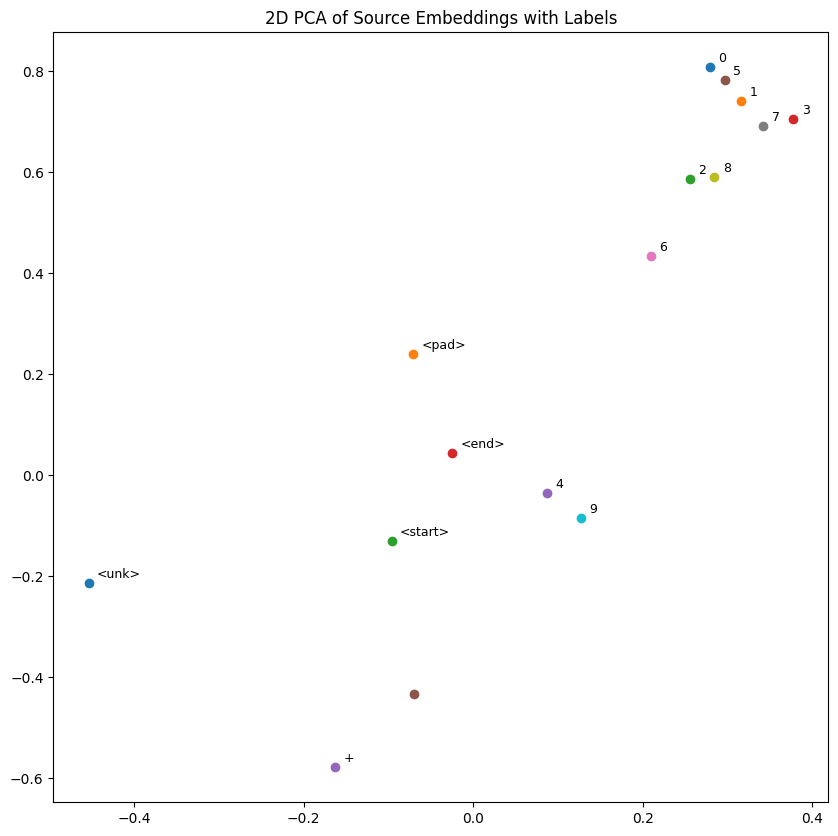

In [37]:
embedding_src_cpu = embedding_src_weight.cpu().detach()
print(embedding_src_cpu[: , :2])

# 逆辞書を作成してインデックスを文字に変換
reverse_vocab_src = {idx: token for token, idx in vocab_src.items()}

# 可視化
plt.figure(figsize=(10, 10))

# 各ポイントを散布図でプロットし、対応するラベルを表示
for i, (x, y) in enumerate(embedding_src_cpu[:, :2]):  # [:, :2]をスライスし、次にenumerate
    label = reverse_vocab_src[i]  # インデックスを元のトークンに戻す
    plt.scatter(x, y)
    plt.text(x + 0.01, y + 0.01, label, fontsize=9)  # 各点の近くにラベルを表示

plt.title("2D PCA of Source Embeddings with Labels")
plt.show()

tensor([[-0.4621,  0.0669],
        [-0.5175, -0.0253],
        [-0.3490, -0.0202],
        [-0.6215, -0.2087],
        [ 0.1221, -0.1603],
        [-0.4910,  0.0294],
        [-0.1683, -0.1191],
        [-0.5534, -0.0931],
        [-0.3807, -0.2498],
        [ 0.1163, -0.3563],
        [-0.0046,  0.4107],
        [-0.5334, -0.3138],
        [-0.1239,  0.1117],
        [-0.4777, -0.1350],
        [-0.1031,  0.0746],
        [-0.1002, -0.1240]])


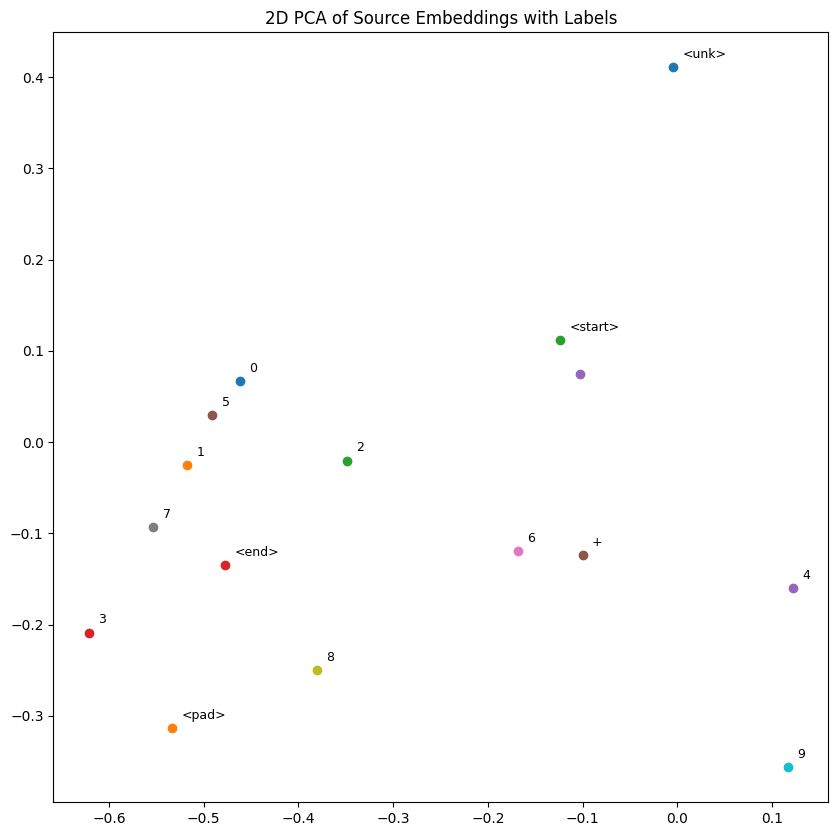

In [38]:
embedding_tgt_cpu = embedding_tgt_weight.cpu().detach()
print(embedding_tgt_cpu[: , :2])

# 逆辞書を作成してインデックスを文字に変換
reverse_vocab_src = {idx: token for token, idx in vocab_tgt.items()}

# 可視化
plt.figure(figsize=(10, 10))

# 各ポイントを散布図でプロットし、対応するラベルを表示
for i, (x, y) in enumerate(embedding_tgt_cpu[:, :2]):  # [:, :2]をスライスし、次にenumerate
    label = reverse_vocab_src[i]  # インデックスを元のトークンに戻す
    plt.scatter(x, y)
    plt.text(x + 0.01, y + 0.01, label, fontsize=9)  # 各点の近くにラベルを表示

plt.title("2D PCA of Source Embeddings with Labels")
plt.show()

## Attentionを確認

In [55]:

# 翻訳処理を実行
seq_len_tgt = max([len(x[1]) for x in train_data])
text = '+ + 1 5 + 8 5'

tokens_src = convert_text_to_indexes(text, vocab=vocab_src)
src = torch.LongTensor(tokens_src).reshape(len(tokens_src), 1).to(device)
memory = positional_encoding(embedding_src_weight[src] * math.sqrt(embedding_size))
ys = torch.ones(1, 1).fill_(START_IDX).type(torch.long).to(device)

# 分析0
print(f"text: {text}")
print(f"memory: {memory}")
print(f"memory_size: {memory.size()}")
print("\n------------------\n")


for i in range(10):
    tgt_embed = positional_encoding(embedding_tgt_weight[ys] * math.sqrt(embedding_size))
    tgt_mask = generate_square_subsequent_mask(ys.size(0)).to(device).type(torch.bool)

    # 分析１
    print(f"iter: {i}")
    print(f"ys: {ys}")
    print(f"tgt_embed: {tgt_embed}")
    now_tgt = convert_indexes_to_text(ys.squeeze(1).tolist(), vocab_tgt)
    print(f"now tgt: {now_tgt}")
    print(f"tgt_embed: {tgt_embed}")
    
    # Self-attention
    self_attn_wq, self_attn_wk, self_attn_wv = self_attn_in_proj_weight.chunk(3, dim=0)
    self_attn_bq, self_attn_bk, self_attn_bv = self_attn_in_proj_bias.chunk(3, dim=0)
    QW = torch.matmul(tgt_embed.permute(1, 0, 2), self_attn_wq.T) + self_attn_bq
    KW = torch.matmul(tgt_embed.permute(1, 0, 2), self_attn_wk.T) + self_attn_bk
    VW = torch.matmul(tgt_embed.permute(1, 0, 2), self_attn_wv.T) + self_attn_bv
    self_attn_weights = F.softmax(torch.bmm(QW, KW.transpose(-2, -1)) / math.sqrt(embedding_size), dim=-1)
    AV = torch.matmul(self_attn_weights, VW)
    self_attn_output = torch.matmul(AV, self_attn_out_proj_weight.T) + self_attn_out_proj_bias
    self_attn_output = self_attn_output.permute(1, 0, 2)
    tgt = tgt_embed + self_attn_output
    tgt = loaded_model.decoder_layer.norm1(tgt)

    # 分析2
    print("SelfAttention Layer")
    print(f"QV.shape: {QW.shape}")
    print(f"KV.shape: {KW.shape}")
    print(f"WV.shape: {VW.shape}")
    print(f"attn_weight.shape: {self_attn_weights.shape}")
    print(f"AV.shape: {AV.shape}")
    self_attn_weights_np = self_attn_weights.squeeze(0).detach().cpu().numpy()
    print(f"self_attention: \n{self_attn_weights_np}")
    tgt_tokens_ = convert_indexes_to_list(ys.squeeze(1).tolist(), vocab_tgt)
    src_tokens_ = tgt_tokens_
    print(f"tgt_tokens: {tgt_tokens_}")
    # Self-Attentionの可視化
    # visualize_attention(self_attn_weights_np, src_tokens_, tgt_tokens_, title="Self-Attention Weights")

    # Attention with the encoder outputs (memory)
    multi_attn_wq, multi_attn_wk, multi_attn_wv = multihead_attn_in_proj_weight.chunk(3, dim=0)
    multi_attn_bq, multi_attn_bk, multi_attn_bv = multihead_attn_in_proj_bias.chunk(3, dim=0)
    QW = torch.matmul(tgt.permute(1, 0, 2), multi_attn_wq.T) + multi_attn_bq
    KW = torch.matmul(memory.permute(1, 0, 2), multi_attn_wk.T) + multi_attn_bk
    VW = torch.matmul(memory.permute(1, 0, 2), multi_attn_wv.T) + multi_attn_bv
    multi_attn_weights = F.softmax(torch.bmm(QW, KW.transpose(-2, -1)) / math.sqrt(embedding_size), dim=-1)
    AV = torch.matmul(multi_attn_weights, VW)
    multi_attn_output = torch.matmul(AV, multihead_attn_out_proj_weight.T) + multihead_attn_out_proj_bias
    multi_attn_output = multi_attn_output.permute(1, 0, 2)
    tgt = tgt + multi_attn_output
    tgt = loaded_model.decoder_layer.norm2(tgt)

    # 分析3
    print(f"QV.shape: {QW.shape}")
    print(f"KV.shape: {KW.shape}")
    print(f"WV.shape: {VW.shape}")
    print(f"attn_weight.shape: {multi_attn_weights.shape}")
    print(f"AV.shape: {AV.shape}")
    multi_attn_weights_np = multi_attn_weights.squeeze(0).detach().cpu().numpy()
    print(f"multi_attention: \n{multi_attn_weights_np}")
    tgt_tokens_ = convert_indexes_to_list(ys.squeeze(1).tolist(), vocab_tgt)
    src_tokens_ = convert_indexes_to_list(src.squeeze(1).tolist(), vocab_src)
    # Memory-Attentionの可視化
    # visualize_attention(multi_attn_weights_np, src_tokens_, tgt_tokens_, title="Self-Attention Weights")

    
    # Feedforward network

    # decoder linear1, 2
    tgt2 = tgt.matmul(linear1_weight.T) + linear1_bias
    tgt2 = F.relu(tgt2)
    tgt2 = tgt2.matmul(linear2_weight.T) + linear2_bias
    tgt = tgt + tgt2

    # LayerNorm
    tgt = loaded_model.decoder_layer.norm3(tgt)

    output = tgt.transpose(0, 1)
    output = loaded_model.output(output[:, -1])

    _, next_word = torch.max(output, dim=1)
    next_word = next_word.item()


    # 分析4
    print(f"AfterLinear.shape: {tgt2.shape}")
    print(f"AfterAddTGT.shape: {tgt.shape}")
    print(f"AfterAddTGT: {tgt}")
    print(f"output.shape: {output.shape}")
    print(f"output: {output}")

    ys = torch.cat([ys, torch.ones(1, 1).fill_(next_word).type_as(src.data)], dim=0)
    print(f"predicted: {next_word}")

    print("\n------------------\n")
    
    if next_word == END_IDX:
        break


flat_indexes = [idx for sublist in ys.tolist() for idx in sublist] if isinstance(ys.tolist()[0], list) else ys.tolist()

print(f"Input: {text}")
print(f"Decoded sequence: {convert_indexes_to_text(flat_indexes, vocab_tgt)}")

text: + + 1 5 + 8 5
memory: tensor([[[-0.1925,  0.7405, -4.7773,  2.5804]],

        [[ 0.5166, -0.6157,  0.8775,  1.6319]],

        [[ 0.7691, -1.2817, -0.9260,  1.2579]],

        [[-0.1838, -2.1460,  0.8975,  1.6315]],

        [[-0.8970, -1.5192, -0.9060,  1.2573]],

        [[-0.3265,  1.7657,  0.7869, -0.5932]],

        [[-0.4196,  0.0946, -0.8860,  1.2563]],

        [[ 1.2507,  2.3168,  0.7846, -0.5499]],

        [[ 0.8492, -1.0110, -0.8661,  1.2549]],

        [[ 0.0872, -2.0671,  0.9573,  1.6279]],

        [[-0.6842, -1.7046, -0.8461,  1.2531]],

        [[-0.4308,  1.1838,  0.5898, -0.3371]],

        [[-0.6767, -0.0217, -0.8263,  1.2509]],

        [[ 1.0139,  2.4704,  0.8443, -0.5559]],

        [[ 0.9403,  0.2254,  0.3953,  0.8942]]], device='cuda:0')
memory_size: torch.Size([15, 1, 4])

------------------

iter: 0
ys: tensor([[12]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]]], device='cuda:0')
now tgt: 
tgt_embed: tensor([[[-0.2479,  1

text: + + 1 5 + 8 5
memory: tensor([[[-0.1925,  0.7405, -4.7773,  2.5804]],

        [[ 0.5166, -0.6157,  0.8775,  1.6319]],

        [[ 0.7691, -1.2817, -0.9260,  1.2579]],

        [[-0.1838, -2.1460,  0.8975,  1.6315]],

        [[-0.8970, -1.5192, -0.9060,  1.2573]],

        [[-0.3265,  1.7657,  0.7869, -0.5932]],

        [[-0.4196,  0.0946, -0.8860,  1.2563]],

        [[ 1.2507,  2.3168,  0.7846, -0.5499]],

        [[ 0.8492, -1.0110, -0.8661,  1.2549]],

        [[ 0.0872, -2.0671,  0.9573,  1.6279]],

        [[-0.6842, -1.7046, -0.8461,  1.2531]],

        [[-0.4308,  1.1838,  0.5898, -0.3371]],

        [[-0.6767, -0.0217, -0.8263,  1.2509]],

        [[ 1.0139,  2.4704,  0.8443, -0.5559]],

        [[ 0.9403,  0.2254,  0.3953,  0.8942]]], device='cuda:0')
memory_size: torch.Size([15, 1, 4])

------------------

iter: 0
ys: tensor([[12]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]]], device='cuda:0')
now tgt: 
tgt_embed: tensor([[[-0.2479,  1

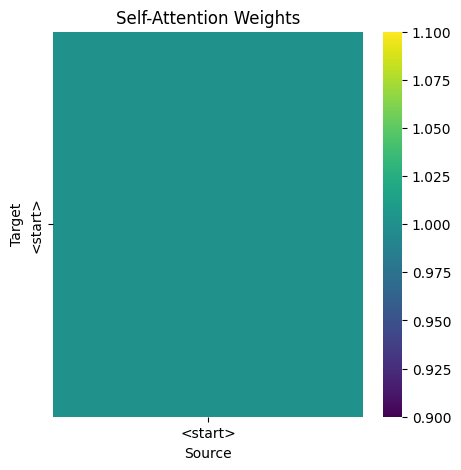

QV.shape: torch.Size([1, 1, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 1, 15])
AV.shape: torch.Size([1, 1, 4])
multi_attention: 
[[3.9321240e-08 1.3764460e-04 5.7096375e-05 1.6431550e-02 7.1088150e-02
  4.1718426e-01 1.4012748e-03 2.8773316e-04 3.1729047e-05 5.3184014e-03
  4.0587511e-02 4.4169757e-01 5.0314921e-03 6.8176363e-04 6.3741129e-05]]
[12, 14, 15, 14, 15, 1, 15, 5, 15, 14, 15, 8, 15, 5, 13]
tensor([12, 14, 15, 14, 15,  1, 15,  5, 15, 14, 15,  8, 15,  5, 13], device='cuda:0')
[12, 14, 15, 14, 15, 1, 15, 5, 15, 14, 15, 8, 15, 5, 13]


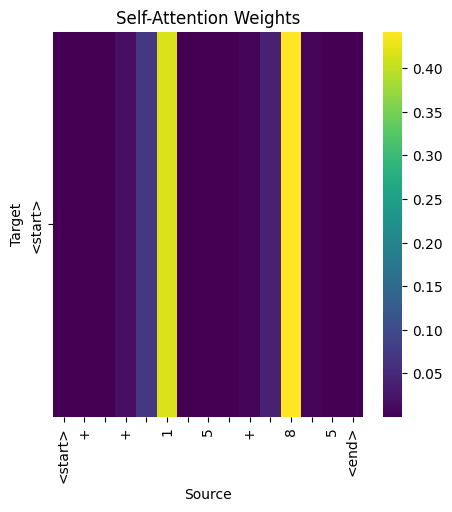

AfterLinear.shape: torch.Size([1, 1, 4])
AfterAddTGT.shape: torch.Size([1, 1, 4])
AfterAddTGT: tensor([[[-4.4172,  4.0960,  2.8647, -3.9480]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[ 14.8026,  26.4542,  -8.8720,  10.0538, -30.3597,  23.2375, -20.8327,  22.8551,   4.6044,
         -29.1157,  -4.0657,  -1.1237,  -4.6492, -28.7647,   0.0966,  -6.3893]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 1

------------------

iter: 1
ys: tensor([[12],
        [ 1]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [[-0.1934,  0.4897,  0.1387,  1.6061]]], device='cuda:0')
now tgt: 1
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [[-0.1934,  0.4897,  0.1387,  1.6061]]], device='cuda:0')
SelfAttention Layer
QV.shape: torch.Size([1, 2, 4])
KV.shape: torch.Size([1, 2, 4])
WV.shape: torch.Size([1, 2, 4])
attn_weight.shape: torch.Size([1, 2, 2])
AV.shape: to

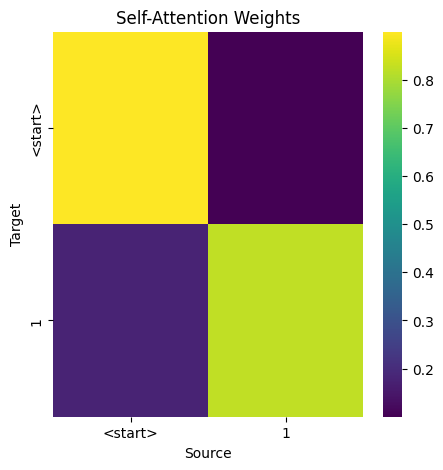

QV.shape: torch.Size([1, 2, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 2, 15])
AV.shape: torch.Size([1, 2, 4])
multi_attention: 
[[5.50478376e-07 9.87161882e-04 5.07529185e-04 5.34832738e-02
  1.13065496e-01 3.35413545e-01 3.89931072e-03 1.22810306e-03
  3.06996750e-04 2.27063857e-02 7.87876695e-02 3.76275033e-01
  1.05833290e-02 2.27278052e-03 4.82842646e-04]
 [9.73730326e-01 3.25185573e-03 9.25975759e-03 9.08936025e-04
  1.26681436e-04 5.13516518e-08 2.35837302e-04 3.03684646e-06
  9.71028022e-03 1.68571284e-03 2.22390736e-04 1.44095509e-07
  1.17338524e-04 1.43638022e-06 7.46276637e-04]]
[12, 14, 15, 14, 15, 1, 15, 5, 15, 14, 15, 8, 15, 5, 13]
tensor([12, 14, 15, 14, 15,  1, 15,  5, 15, 14, 15,  8, 15,  5, 13], device='cuda:0')
[12, 14, 15, 14, 15, 1, 15, 5, 15, 14, 15, 8, 15, 5, 13]


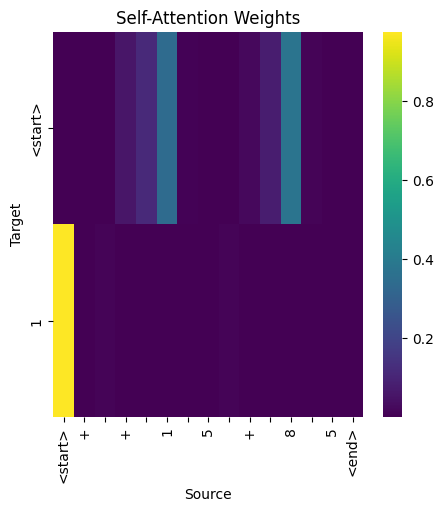

AfterLinear.shape: torch.Size([2, 1, 4])
AfterAddTGT.shape: torch.Size([2, 1, 4])
AfterAddTGT: tensor([[[-3.6033,  4.3668,  2.4201, -4.5128]],

        [[-4.7010,  0.7108, -5.6175,  7.0443]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[-4.4242e+01, -2.5253e+01, -2.6222e+01,  2.3729e+01,  8.8910e+00, -3.9589e+01, -9.7749e+00,
         -3.1262e+00, -3.5927e+01,  8.6432e+00, -7.4477e-01, -1.0101e+00,  9.4433e-03,  1.9652e+01,
          3.2226e+01,  7.9169e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
predicted: 14

------------------

iter: 2
ys: tensor([[12],
        [ 1],
        [14]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [[-0.1934,  0.4897,  0.1387,  1.6061]],

        [[ 0.7031, -0.2669,  0.4363, -0.1348]]], device='cuda:0')
now tgt: 1 
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [[-0.1934,  0.4897,  0.1387,  1.6061]],

        [[ 0.7031, -0.

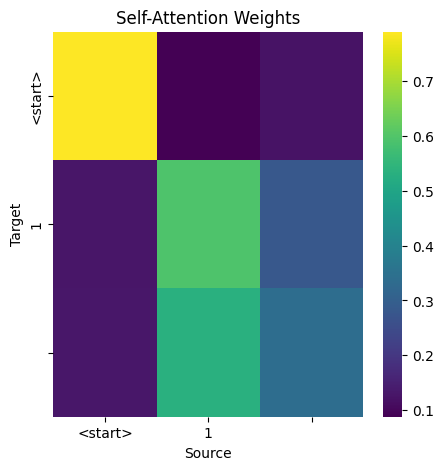

QV.shape: torch.Size([1, 3, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 3, 15])
AV.shape: torch.Size([1, 3, 4])
multi_attention: 
[[1.86920024e-05 1.03026666e-02 6.97286800e-03 1.44614771e-01
  1.20533422e-01 2.11734816e-01 1.15501918e-02 9.61116236e-03
  4.93738614e-03 9.22850892e-02 1.09901346e-01 2.38124833e-01
  2.04765815e-02 1.26069281e-02 6.32926356e-03]
 [9.67614233e-01 4.03873343e-03 1.15172314e-02 7.84936652e-04
  8.87653223e-05 6.04426091e-08 2.22412797e-04 6.32650199e-06
  1.27067426e-02 1.60540303e-03 1.64788333e-04 1.54929907e-07
  1.00691403e-04 2.80529116e-06 1.14681234e-03]
 [2.17924104e-03 1.36607466e-02 1.64171774e-02 2.81416025e-04
  1.74335692e-05 7.06026913e-04 3.67917964e-04 5.95017314e-01
  2.74651442e-02 8.84610752e-04 3.60252161e-05 3.50458256e-04
  1.21119869e-04 2.56804913e-01 8.56904164e-02]]
[12, 14, 15, 14, 15, 1, 15, 5, 15, 14, 15, 8, 15, 5, 13]
tensor([12, 14, 15, 14, 15,  1, 15,  5, 15, 14, 15

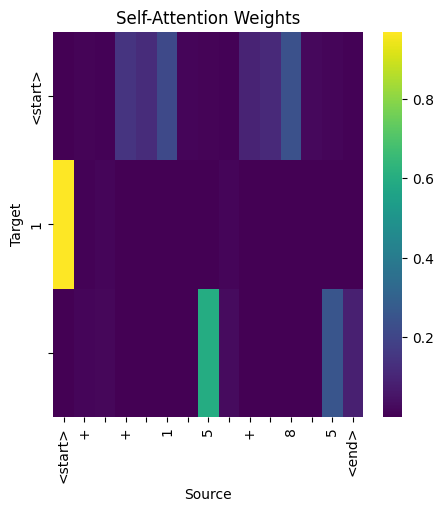

AfterLinear.shape: torch.Size([3, 1, 4])
AfterAddTGT.shape: torch.Size([3, 1, 4])
AfterAddTGT: tensor([[[ 7.7796, -5.7111, -0.3928, -2.5625]],

        [[-4.6082,  0.6301, -5.6712,  7.0864]],

        [[-0.5071,  3.2079,  2.3684, -6.0929]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[ 25.4343,  25.9295,   4.5618,  -4.6046, -17.8974,  28.9499,  -7.7611,  15.7462,  16.9922,
         -16.8805,  -1.6035,  -0.1144,  -1.4127, -22.5420, -10.0050, -11.3601]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 5

------------------

iter: 3
ys: tensor([[12],
        [ 1],
        [14],
        [ 5]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [[-0.1934,  0.4897,  0.1387,  1.6061]],

        [[ 0.7031, -0.2669,  0.4363, -0.1348]],

        [[-0.8408, -0.9311, -0.0663,  1.8630]]], device='cuda:0')
now tgt: 1 5
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [

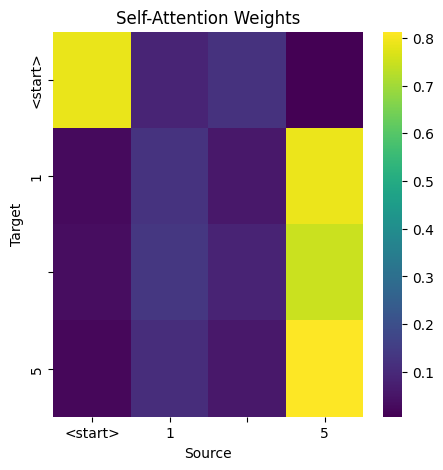

QV.shape: torch.Size([1, 4, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 4, 15])
AV.shape: torch.Size([1, 4, 4])
multi_attention: 
[[2.25493277e-05 1.13475192e-02 7.80251296e-03 1.52441815e-01
  1.22842096e-01 1.99185520e-01 1.21441530e-02 9.90828406e-03
  5.54878730e-03 9.86796245e-02 1.13155216e-01 2.25987181e-01
  2.11940240e-02 1.28188822e-02 6.92177843e-03]
 [7.41513908e-01 3.26735340e-02 7.49377906e-02 2.28543207e-02
  3.62599851e-03 4.18744594e-06 3.13844695e-03 6.62131351e-05
  7.05648437e-02 3.49642076e-02 5.87854441e-03 1.08384274e-05
  1.98407122e-03 3.65083542e-05 7.74657726e-03]
 [1.81195643e-02 1.37411624e-01 1.85082659e-01 4.22308780e-02
  4.56185127e-03 2.65629077e-03 8.80470127e-03 8.35580751e-02
  2.07669318e-01 7.67081231e-02 7.78297056e-03 2.80698575e-03
  5.09347487e-03 4.71333899e-02 1.70380041e-01]
 [9.38585520e-01 5.86181646e-03 1.46345925e-02 8.71898048e-03
  2.68326816e-03 3.78538033e-07 1.27432018e-03

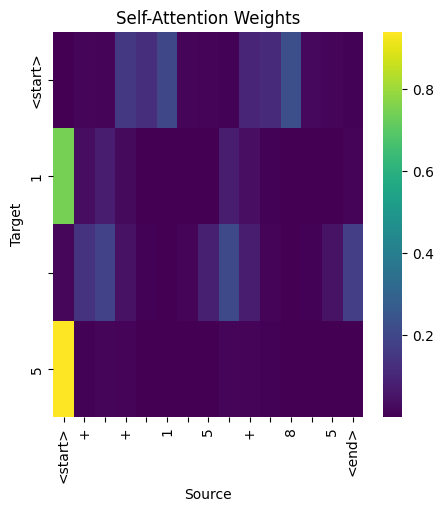

AfterLinear.shape: torch.Size([4, 1, 4])
AfterAddTGT.shape: torch.Size([4, 1, 4])
AfterAddTGT: tensor([[[ 7.7954, -5.8259, -0.4573, -2.4118]],

        [[-4.7117,  0.7522, -5.6247,  7.0216]],

        [[ 5.3233, -8.2729, -2.6366,  3.9754]],

        [[-5.0454,  1.0275, -5.4094,  6.8641]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[-43.4450, -23.4995, -27.0695,  24.9013,   6.6377, -38.1447, -11.3938,  -1.4995, -35.9334,
           6.4441,  -0.9678,  -1.0323,  -0.2743,  17.6735,  32.3600,   7.5388]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 14

------------------

iter: 4
ys: tensor([[12],
        [ 1],
        [14],
        [ 5],
        [14]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [[-0.1934,  0.4897,  0.1387,  1.6061]],

        [[ 0.7031, -0.2669,  0.4363, -0.1348]],

        [[-0.8408, -0.9311, -0.0663,  1.8630]],

        [[-0.9630, -0.5044,  0.4563

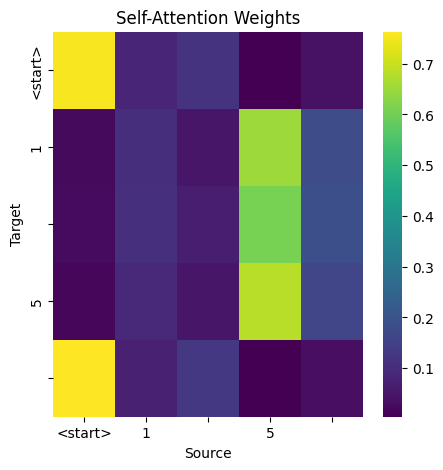

QV.shape: torch.Size([1, 5, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 5, 15])
AV.shape: torch.Size([1, 5, 4])
multi_attention: 
[[2.6074615e-05 1.1526134e-02 8.0497349e-03 1.6600890e-01 1.3655488e-01
  1.7501278e-01 1.2670527e-02 8.0571640e-03 5.6582871e-03 1.0592701e-01
  1.2516980e-01 2.0593190e-01 2.2391029e-02 1.0469830e-02 6.5459120e-03]
 [7.5218409e-01 2.9130444e-02 6.6521995e-02 2.7845507e-02 5.2271280e-03
  4.0182354e-06 3.5009109e-03 3.9151244e-05 5.9980292e-02 3.9232805e-02
  8.0936607e-03 1.1186274e-05 2.3987850e-03 2.2792487e-05 5.8072084e-03]
 [7.4004950e-03 1.2785289e-01 1.5424123e-01 6.1188847e-02 8.2435934e-03
  7.3920735e-03 1.1280431e-02 1.0713625e-01 1.6460879e-01 9.8528877e-02
  1.3081074e-02 7.5524468e-03 7.4655223e-03 6.7036130e-02 1.5699132e-01]
 [9.3432301e-01 5.2631330e-03 1.2762700e-02 1.1321449e-02 4.4989698e-03
  4.7137601e-07 1.6005546e-03 1.0788617e-06 1.0225039e-02 1.2262934e-02
  5.8305818e-03

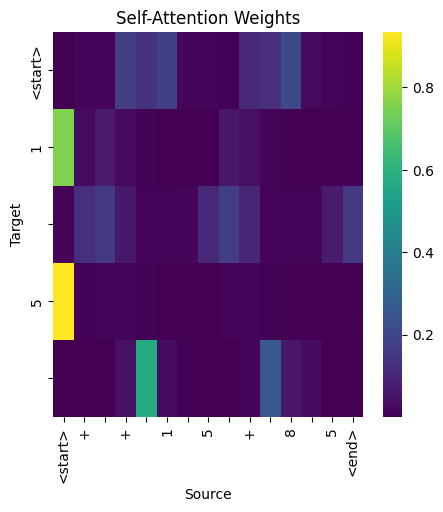

AfterLinear.shape: torch.Size([5, 1, 4])
AfterAddTGT.shape: torch.Size([5, 1, 4])
AfterAddTGT: tensor([[[ 7.8162, -6.0813, -0.6054, -2.0597]],

        [[-4.7909,  0.8227, -5.5778,  6.9832]],

        [[ 6.6184, -8.2186, -1.3122,  1.6077]],

        [[-5.1242,  1.0944, -5.3557,  6.8227]],

        [[-1.0318, -8.7101,  2.8421,  5.0274]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[-16.3793, -21.7807,   2.1547, -12.0871,   5.5271, -21.5394,   6.6605, -16.7508,  -5.4194,
           6.2909,  -6.4608,  -5.2535,  -8.8798,   8.8486,   0.4834,  27.4471]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 15

------------------

iter: 5
ys: tensor([[12],
        [ 1],
        [14],
        [ 5],
        [14],
        [15]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [[-0.1934,  0.4897,  0.1387,  1.6061]],

        [[ 0.7031, -0.2669,  0.4363, -0.1348]],

        [[-0.8408, -0

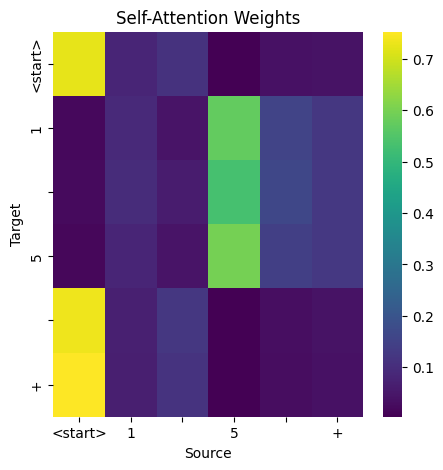

QV.shape: torch.Size([1, 6, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 6, 15])
AV.shape: torch.Size([1, 6, 4])
multi_attention: 
[[1.9240490e-05 8.9540230e-03 6.1244988e-03 1.6408320e-01 1.5413874e-01
  1.7016290e-01 1.1785949e-02 5.2866181e-03 4.1715517e-03 9.8093748e-02
  1.3602662e-01 2.0707436e-01 2.2253048e-02 7.2034653e-03 4.6220822e-03]
 [7.4548578e-01 2.6566694e-02 5.9810672e-02 3.6963712e-02 8.5234344e-03
  4.3659379e-06 4.2048744e-03 2.3490031e-05 5.1241126e-02 4.7116283e-02
  1.2467171e-02 1.3115256e-05 3.1812941e-03 1.4644778e-05 4.3832995e-03]
 [1.9781291e-03 1.0208023e-01 1.0542829e-01 9.4877519e-02 1.8098300e-02
  2.7854592e-02 1.4798833e-02 1.2584925e-01 1.0427854e-01 1.2725526e-01
  2.5698489e-02 2.7439779e-02 1.1979357e-02 9.1998696e-02 1.2038473e-01]
 [9.1463709e-01 5.1409686e-03 1.1870717e-02 1.7298479e-02 9.3788877e-03
  7.8008122e-07 2.3577353e-03 8.0686493e-07 8.9848144e-03 1.6408747e-02
  1.1163231e-02

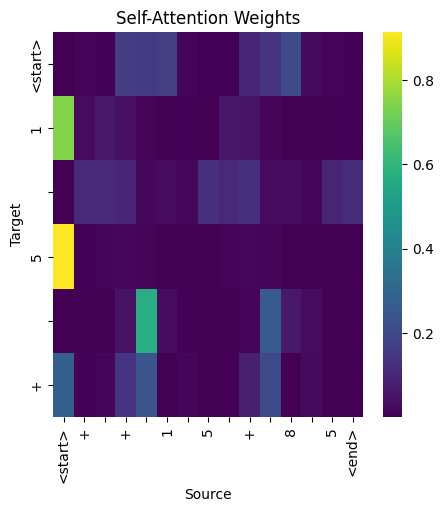

AfterLinear.shape: torch.Size([6, 1, 4])
AfterAddTGT.shape: torch.Size([6, 1, 4])
AfterAddTGT: tensor([[[ 7.7990, -6.0884, -0.5577, -2.0808]],

        [[-4.8612,  0.8854, -5.5351,  6.9480]],

        [[ 7.6598, -6.8594, -0.7826, -1.0405]],

        [[-5.2099,  1.1671, -5.2957,  6.7763]],

        [[-3.9933, -6.9968,  3.1741,  5.7233]],

        [[-4.5063,  0.5213, -5.7193,  7.1416]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[-44.6429, -26.2164, -25.7141,  23.0306,  10.1273, -40.3616,  -8.8587,  -4.0444, -35.8797,
           9.8513,  -0.6313,  -1.0049,   0.1513,  20.7267,  32.1065,   8.1584]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 14

------------------

iter: 6
ys: tensor([[12],
        [ 1],
        [14],
        [ 5],
        [14],
        [15],
        [14]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [[-0.1934,  0.4897,  0.1387,  1.6061]],

       

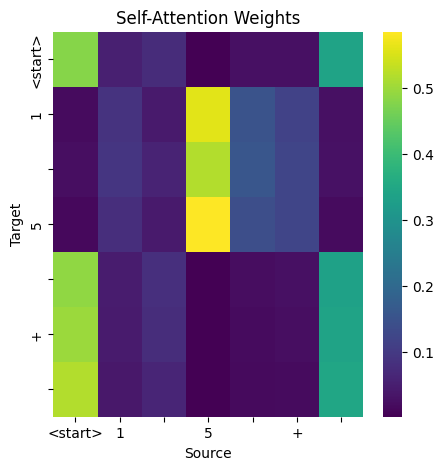

QV.shape: torch.Size([1, 7, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 7, 15])
AV.shape: torch.Size([1, 7, 4])
multi_attention: 
[[1.61838022e-06 1.71720702e-03 9.64328879e-04 8.96527246e-02
  1.70116410e-01 2.45829731e-01 5.85352164e-03 1.11928768e-03
  5.80214371e-04 3.92429419e-02 1.22564651e-01 3.04369628e-01
  1.52914543e-02 1.97604671e-03 7.20218814e-04]
 [7.57768571e-01 2.49675084e-02 5.64545579e-02 3.56724709e-02
  8.41209013e-03 3.95334837e-06 4.06154152e-03 2.03697145e-05
  4.81657833e-02 4.51043136e-02 1.22414557e-02 1.20308723e-05
  3.09362123e-03 1.27593385e-05 4.00903681e-03]
 [1.45035156e-03 9.41760540e-02 9.41216573e-02 9.12119448e-02
  1.80829559e-02 3.54391225e-02 1.44313890e-02 1.43509880e-01
  9.29092169e-02 1.20426625e-01 2.53465548e-02 3.38406451e-02
  1.19104916e-02 1.06952801e-01 1.16190344e-01]
 [9.15920317e-01 4.93040914e-03 1.13461455e-02 1.71116497e-02
  9.61603783e-03 7.77949822e-07 2.36521661e-03

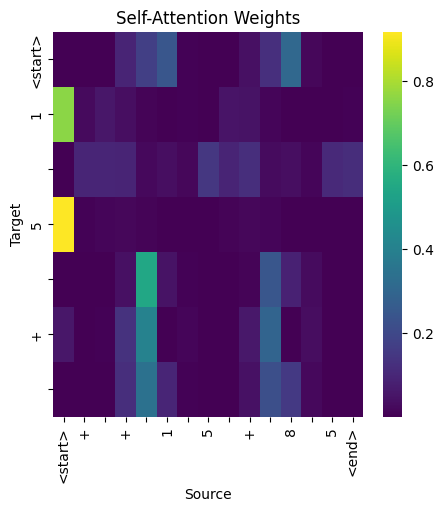

AfterLinear.shape: torch.Size([7, 1, 4])
AfterAddTGT.shape: torch.Size([7, 1, 4])
AfterAddTGT: tensor([[[-0.0596,  2.2692,  3.1211, -6.2847]],

        [[-4.8797,  0.9012, -5.5234,  6.9390]],

        [[ 7.6972, -6.5315, -0.5300, -1.6045]],

        [[-5.2192,  1.1741, -5.2888,  6.7717]],

        [[ 3.8005, -9.4351,  1.3022,  2.8597]],

        [[-3.0087, -0.8686, -6.2942,  7.6412]],

        [[ 1.6629, -6.2270,  6.1703, -2.6165]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[ 21.7481,   6.7791,  18.6512, -26.4566,  -6.7482,  16.2383,   8.2872,  -5.6556,  23.1796,
          -5.4441,  -5.6970,  -3.9798,  -7.8613, -12.4758, -21.4081,  12.8959]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 8

------------------

iter: 7
ys: tensor([[12],
        [ 1],
        [14],
        [ 5],
        [14],
        [15],
        [14],
        [ 8]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.177

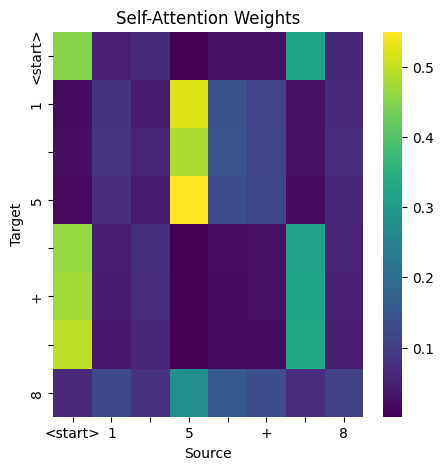

QV.shape: torch.Size([1, 8, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 8, 15])
AV.shape: torch.Size([1, 8, 4])
multi_attention: 
[[4.40311760e-06 3.29188374e-03 2.00519431e-03 1.21131480e-01
  1.77741021e-01 2.06269488e-01 7.93201756e-03 1.84537272e-03
  1.25515321e-03 5.91253750e-02 1.37906641e-01 2.58607775e-01
  1.84836797e-02 2.96302466e-03 1.43756147e-03]
 [7.82323599e-01 2.29724515e-02 5.26354909e-02 3.03805601e-02
  6.95428858e-03 3.18696880e-06 3.57491267e-03 1.85504214e-05
  4.53351177e-02 3.91549207e-02 1.02232881e-02 9.68678523e-06
  2.66581704e-03 1.14487957e-05 3.73671786e-03]
 [1.41976972e-03 9.13284495e-02 9.15476233e-02 7.18841851e-02
  1.31520294e-02 3.28964032e-02 1.25059364e-02 1.78991735e-01
  9.30326283e-02 9.97045264e-02 1.88806821e-02 3.00084706e-02
  9.81816184e-03 1.29382432e-01 1.25446990e-01]
 [9.26089942e-01 4.48870892e-03 1.04140518e-02 1.47050368e-02
  8.17685854e-03 6.53926804e-07 2.11222586e-03

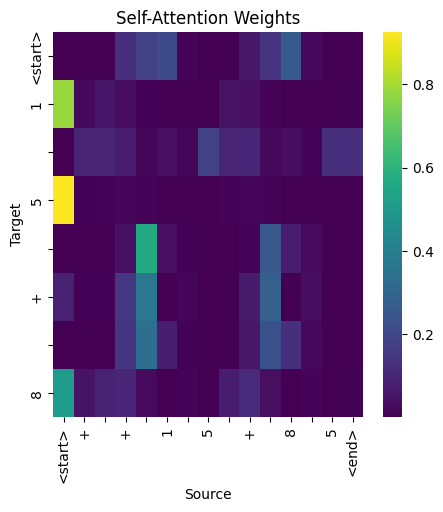

AfterLinear.shape: torch.Size([8, 1, 4])
AfterAddTGT.shape: torch.Size([8, 1, 4])
AfterAddTGT: tensor([[[ 6.6337, -3.7619,  1.2290, -4.8269]],

        [[-4.8888,  0.9080, -5.5172,  6.9351]],

        [[ 7.4512, -6.3410,  0.2327, -2.2498]],

        [[-5.2166,  1.1700, -5.2899,  6.7742]],

        [[ 1.5057, -9.4161,  2.1893,  4.0522]],

        [[-3.2226, -0.6524, -6.2449,  7.5829]],

        [[ 7.0932, -7.6714, -0.1888, -0.3220]],

        [[-4.5200,  0.5863, -5.7350,  7.1072]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[-44.5556, -26.0365, -25.7870,  23.1579,  10.0131, -40.2115,  -8.9747,  -3.8775, -35.8764,
           9.7368,  -0.6081,  -0.9798,   0.1884,  20.6096,  32.1462,   7.9850]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 14

------------------

iter: 8
ys: tensor([[12],
        [ 1],
        [14],
        [ 5],
        [14],
        [15],
        [14],
        [ 8],
        [14]], device=

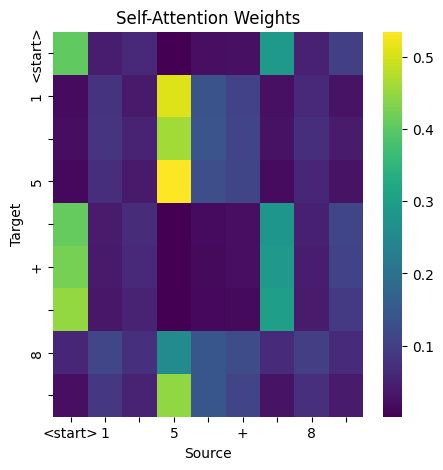

QV.shape: torch.Size([1, 9, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 9, 15])
AV.shape: torch.Size([1, 9, 4])
multi_attention: 
[[3.51573399e-05 1.27488980e-02 9.16364230e-03 1.83788672e-01
  1.47950917e-01 1.46416828e-01 1.35856736e-02 7.05474708e-03
  6.41871896e-03 1.17907725e-01 1.36647925e-01 1.78592801e-01
  2.38071661e-02 9.05806012e-03 6.82312343e-03]
 [7.97174573e-01 2.19302140e-02 5.07289097e-02 2.67852098e-02
  5.91518637e-03 2.75831940e-06 3.24351992e-03 1.82082076e-05
  4.41393666e-02 3.52298245e-02 8.79304577e-03 8.32544083e-06
  2.36716238e-03 1.10700930e-05 3.65265040e-03]
 [1.54855079e-03 8.93039927e-02 9.10126269e-02 5.48755489e-02
  9.05873813e-03 2.69250143e-02 1.05755543e-02 2.12377802e-01
  9.56087857e-02 8.08920786e-02 1.34190805e-02 2.36408152e-02
  7.79387262e-03 1.47284731e-01 1.35682821e-01]
 [9.33663070e-01 4.20909189e-03 9.85385105e-03 1.28845675e-02
  6.96867332e-03 5.59532737e-07 1.90253742e-03

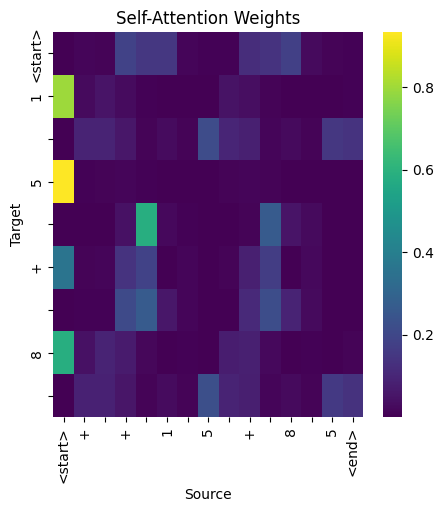

AfterLinear.shape: torch.Size([9, 1, 4])
AfterAddTGT.shape: torch.Size([9, 1, 4])
AfterAddTGT: tensor([[[ 7.8164, -6.3318, -0.7608, -1.6877]],

        [[-4.8866,  0.9052, -5.5182,  6.9367]],

        [[ 4.8235, -5.6904,  3.9031, -3.8463]],

        [[-5.2087,  1.1621, -5.2951,  6.7793]],

        [[-8.6632,  0.4423,  1.4479,  4.4284]],

        [[-4.7151,  0.7233, -5.6094,  7.0377]],

        [[ 7.5505, -7.2044, -1.0594, -0.3764]],

        [[-4.6523,  0.7046, -5.6612,  7.0468]],

        [[-2.2870, -0.4263,  6.2288, -4.6145]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[ 25.9623,  25.5525,   4.8072,  -7.3083, -28.5033,  29.1778, -11.2703,  14.6098,  18.0377,
         -26.9001,  -6.1863,  -2.9091,  -8.0443, -30.6180, -14.0009,   2.4772]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 5

------------------

iter: 9
ys: tensor([[12],
        [ 1],
        [14],
        [ 5],
        [14],
        [15],
  

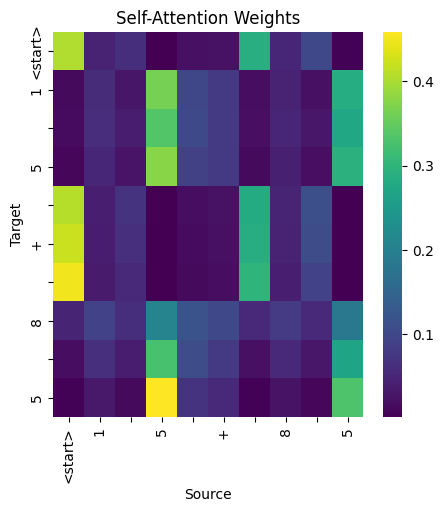

QV.shape: torch.Size([1, 10, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 10, 15])
AV.shape: torch.Size([1, 10, 4])
multi_attention: 
[[3.93195405e-05 1.35003943e-02 9.79846809e-03 1.88016921e-01
  1.47789970e-01 1.40663818e-01 1.39219640e-02 7.24753831e-03
  6.88902242e-03 1.21905498e-01 1.37480959e-01 1.72186613e-01
  2.41182800e-02 9.21694003e-03 7.22431252e-03]
 [7.74728835e-01 2.68283784e-02 6.20348081e-02 2.38881689e-02
  4.36792476e-03 3.26778536e-06 3.09902593e-03 3.55924312e-05
  5.64215556e-02 3.42481099e-02 6.82538422e-03 9.09164100e-06
  2.08255486e-03 2.04423268e-05 5.40680019e-03]
 [6.82397513e-03 1.23065352e-01 1.47679389e-01 5.06446511e-02
  6.47622393e-03 7.41166389e-03 1.00932457e-02 1.31513655e-01
  1.61116213e-01 8.43980610e-02 1.04347691e-02 7.25720404e-03
  6.45604357e-03 8.07412341e-02 1.65888354e-01]
 [9.42821145e-01 4.66582086e-03 1.14082675e-02 9.58580710e-03
  3.81475454e-03 3.86188674e-07 1.41274557e

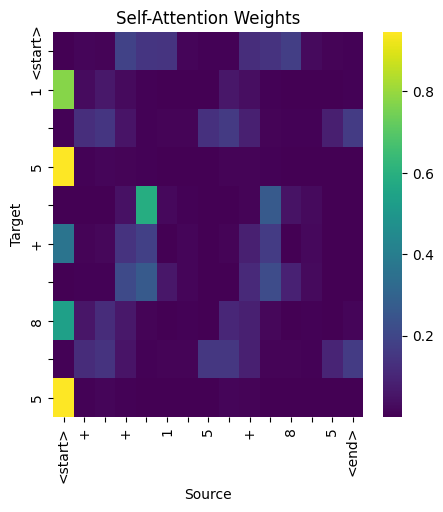

AfterLinear.shape: torch.Size([10, 1, 4])
AfterAddTGT.shape: torch.Size([10, 1, 4])
AfterAddTGT: tensor([[[ 7.8151, -6.3745, -0.7919, -1.6190]],

        [[-4.7986,  0.8284, -5.5727,  6.9801]],

        [[ 6.3037, -8.4199, -1.2520,  2.0159]],

        [[-5.1224,  1.0907, -5.3561,  6.8249]],

        [[-8.7122,  1.0383,  1.1825,  4.1544]],

        [[-4.7220,  0.7306, -5.6058,  7.0338]],

        [[ 7.5512, -7.2050, -1.0672, -0.3694]],

        [[-4.4794,  0.5496, -5.7567,  7.1253]],

        [[ 6.4603, -8.3567, -1.0580,  1.6466]],

        [[-5.0385,  1.0196, -5.4132,  6.8689]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[-43.4646, -23.5394, -27.0521,  24.8762,   6.6849, -38.1784, -11.3596,  -1.5358, -35.9349,
           6.4901,  -0.9641,  -1.0326,  -0.2698,  17.7159,  32.3575,   7.5513]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 14

------------------

iter: 10
ys: tensor([[12],
        [ 1],
     

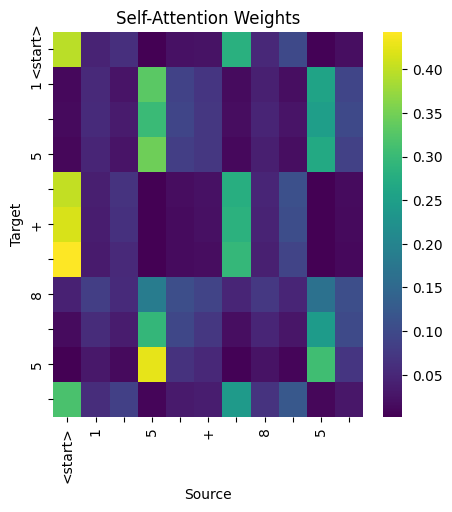

QV.shape: torch.Size([1, 11, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 11, 15])
AV.shape: torch.Size([1, 11, 4])
multi_attention: 
[[4.42718410e-05 1.40973842e-02 1.03489030e-02 1.94201529e-01
  1.50592953e-01 1.31396174e-01 1.42617635e-02 7.00744847e-03
  7.27750268e-03 1.26536787e-01 1.40709370e-01 1.62698999e-01
  2.45571099e-02 8.85410700e-03 7.41568301e-03]
 [7.77083039e-01 2.58348268e-02 5.96111976e-02 2.54986025e-02
  4.93562827e-03 3.24602593e-06 3.21911229e-03 3.00804877e-05
  5.34517504e-02 3.55670899e-02 7.59354513e-03 9.24351480e-06
  2.22214917e-03 1.75969708e-05 4.92299674e-03]
 [4.64943377e-03 1.16575003e-01 1.33681387e-01 5.67521714e-02
  7.93349463e-03 1.10227000e-02 1.08692767e-02 1.44607753e-01
  1.43162474e-01 9.02476981e-02 1.24174431e-02 1.06104268e-02
  7.32653495e-03 9.25241113e-02 1.57620057e-01]
 [9.40278888e-01 4.55545727e-03 1.10061811e-02 1.05586704e-02
  4.58291778e-03 4.29693188e-07 1.54587452e

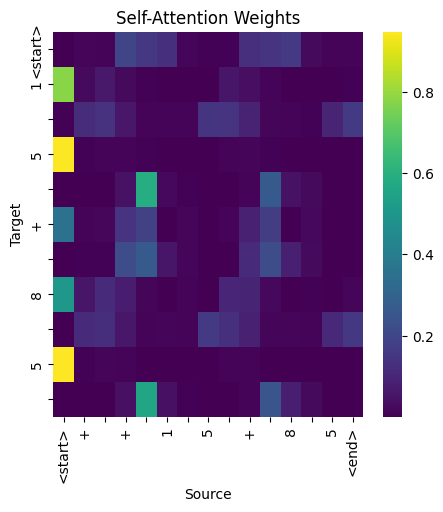

AfterLinear.shape: torch.Size([11, 1, 4])
AfterAddTGT.shape: torch.Size([11, 1, 4])
AfterAddTGT: tensor([[[ 7.8095, -6.4401, -0.8321, -1.5170]],

        [[-4.8229,  0.8499, -5.5580,  6.9681]],

        [[ 6.7871, -8.1219, -0.9999,  1.0908]],

        [[-5.1479,  1.1122, -5.3384,  6.8114]],

        [[-8.6785,  2.0363,  0.6909,  3.6369]],

        [[-4.6655,  0.6820, -5.6392,  7.0595]],

        [[ 7.5466, -7.2169, -1.0820, -0.3410]],

        [[-4.4329,  0.5079, -5.7813,  7.1456]],

        [[ 6.8765, -8.0410, -0.7506,  0.7141]],

        [[-5.0613,  1.0387, -5.3977,  6.8572]],

        [[-0.4973, -8.9129,  2.7096,  4.8679]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[-15.5638, -22.4726,   3.8604, -14.0351,   7.6575, -21.4708,   8.6141, -18.0808,  -4.1295,
           8.3773,  -6.1175,  -5.1367,  -8.4311,  10.2265,  -0.6110,  27.0492]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 15

-----------------

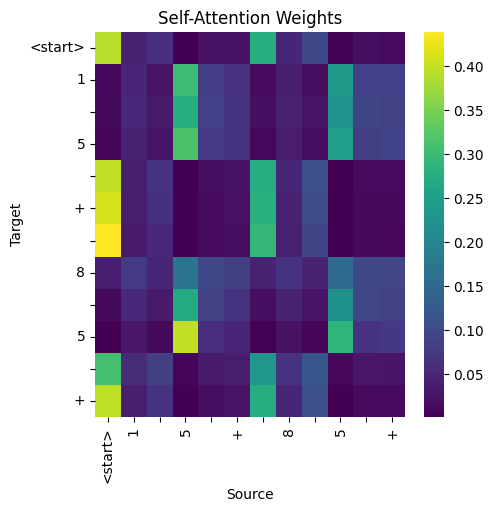

QV.shape: torch.Size([1, 12, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 12, 15])
AV.shape: torch.Size([1, 12, 4])
multi_attention: 
[[4.08979249e-05 1.31326746e-02 9.59211402e-03 1.94317117e-01
  1.56559229e-01 1.29403010e-01 1.39933871e-02 6.15366083e-03
  6.68166578e-03 1.24220781e-01 1.44698322e-01 1.62061632e-01
  2.45638788e-02 7.88143557e-03 6.70020236e-03]
 [7.66666651e-01 2.49909889e-02 5.69213629e-02 3.20137776e-02
  7.12518673e-03 3.65007281e-06 3.75862513e-03 2.23845836e-05
  4.92747948e-02 4.16687503e-02 1.05409333e-02 1.09114344e-05
  2.78030313e-03 1.37373036e-05 4.20793891e-03]
 [1.96967227e-03 1.00457512e-01 1.04095519e-01 7.79160783e-02
  1.38442935e-02 2.62027718e-02 1.31854210e-02 1.53412059e-01
  1.05593994e-01 1.09120995e-01 2.00776644e-02 2.48241201e-02
  1.02153150e-02 1.09157652e-01 1.29926950e-01]
 [9.25356328e-01 4.68892511e-03 1.09318746e-02 1.47370752e-02
  7.83709437e-03 6.46407614e-07 2.08536931e

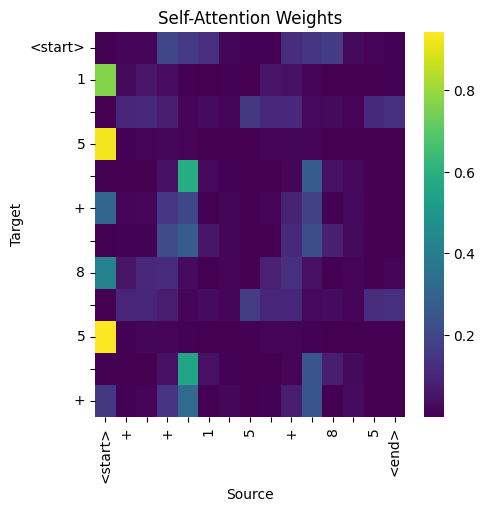

AfterLinear.shape: torch.Size([12, 1, 4])
AfterAddTGT.shape: torch.Size([12, 1, 4])
AfterAddTGT: tensor([[[ 7.8046, -6.4586, -0.8325, -1.4953]],

        [[-4.8667,  0.8893, -5.5313,  6.9458]],

        [[ 7.5682, -6.9175, -0.5162, -1.1451]],

        [[-5.2051,  1.1613, -5.2985,  6.7799]],

        [[-8.6216,  2.4262,  0.4799,  3.4135]],

        [[-4.5055,  0.5391, -5.7278,  7.1321]],

        [[ 7.5344, -7.2385, -1.0838, -0.3087]],

        [[-4.2118,  0.3063, -5.8912,  7.2384]],

        [[ 7.5277, -6.7574, -0.2095, -1.5332]],

        [[-5.1134,  1.0836, -5.3625,  6.8295]],

        [[-2.9508, -7.7157,  3.0753,  5.5699]],

        [[-3.8757, -0.0697, -6.0065,  7.3977]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[-45.6330, -29.0581, -23.9872,  20.7095,  13.9195, -42.5299,  -5.9591,  -6.8706, -35.5210,
          13.5596,  -0.2790,  -0.9865,   0.5896,  23.9495,  31.5581,   8.8529]], device='cuda:0',
       grad_fn=<

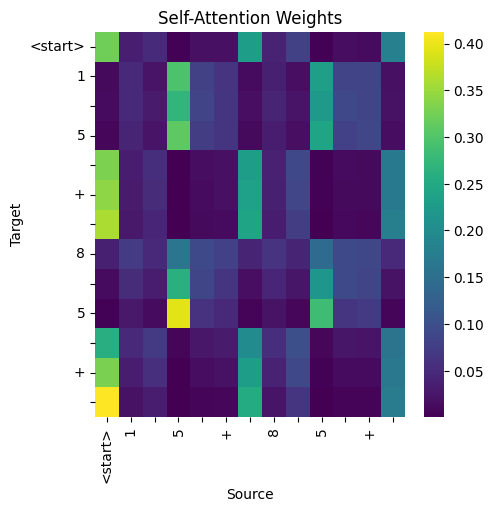

QV.shape: torch.Size([1, 13, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 13, 15])
AV.shape: torch.Size([1, 13, 4])
multi_attention: 
[[8.82094992e-06 4.81959712e-03 3.11482535e-03 1.48810938e-01
  1.89974412e-01 1.66986689e-01 9.60488897e-03 2.15329579e-03
  1.98454526e-03 7.69425407e-02 1.53611630e-01 2.15620145e-01
  2.10276842e-02 3.27347871e-03 2.06646603e-03]
 [7.73442924e-01 2.39874199e-02 5.47494963e-02 3.16097476e-02
  7.18003046e-03 3.44772229e-06 3.70158581e-03 2.01992952e-05
  4.71976735e-02 4.08077314e-02 1.05692511e-02 1.04126002e-05
  2.75826361e-03 1.24598500e-05 3.94925568e-03]
 [1.57908036e-03 9.47959498e-02 9.59504619e-02 7.68976733e-02
  1.41280070e-02 3.11435591e-02 1.30521972e-02 1.65001377e-01
  9.69805494e-02 1.06102519e-01 2.02652942e-02 2.89620645e-02
  1.02906749e-02 1.19295068e-01 1.25555456e-01]
 [9.25382257e-01 4.58169729e-03 1.06454948e-02 1.48224682e-02
  8.11049435e-03 6.56109648e-07 2.11311318e

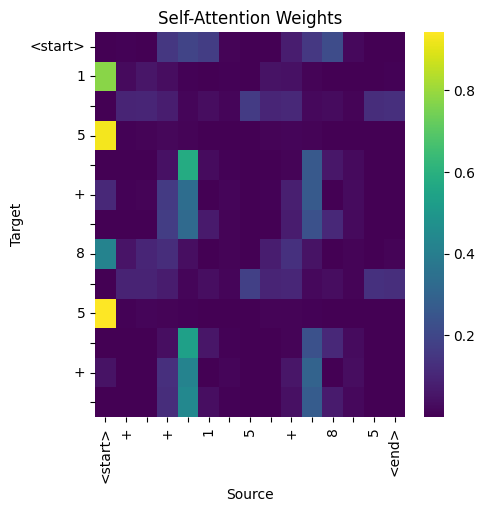

AfterLinear.shape: torch.Size([13, 1, 4])
AfterAddTGT.shape: torch.Size([13, 1, 4])
AfterAddTGT: tensor([[[ 7.6956e+00, -5.8776e+00, -2.1131e-01, -2.4968e+00]],

        [[-4.8793e+00,  9.0009e-01, -5.5233e+00,  6.9397e+00]],

        [[ 7.5777e+00, -6.5979e+00, -2.2313e-01, -1.7131e+00]],

        [[-5.2125e+00,  1.1670e+00, -5.2930e+00,  6.7762e+00]],

        [[-7.7399e+00, -2.5245e+00,  2.4906e+00,  5.4479e+00]],

        [[-3.2107e+00, -6.3626e-01, -6.2633e+00,  7.5738e+00]],

        [[ 7.2898e+00, -7.5697e+00, -8.4592e-01,  8.4583e-05]],

        [[-4.2616e+00,  3.5177e-01, -5.8673e+00,  7.2182e+00]],

        [[ 7.4487e+00, -6.3062e+00,  2.5116e-01, -2.2964e+00]],

        [[-5.1169e+00,  1.0863e+00, -5.3600e+00,  6.8277e+00]],

        [[ 3.8934e+00, -9.4212e+00,  1.2613e+00,  2.8022e+00]],

        [[-2.9458e+00, -9.3212e-01, -6.3072e+00,  7.6570e+00]],

        [[-2.5317e+00, -6.9701e+00, -2.4783e-01,  7.4860e+00]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>

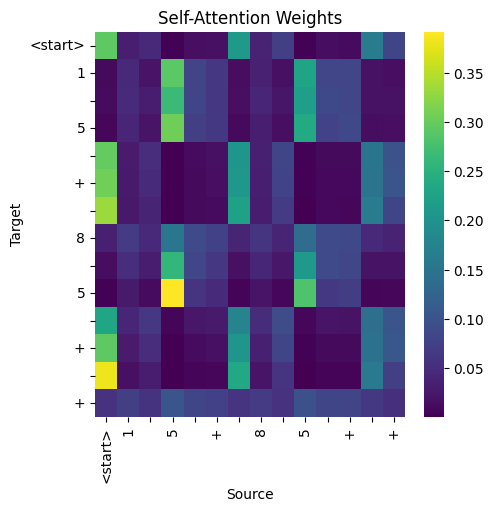

QV.shape: torch.Size([1, 14, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 14, 15])
AV.shape: torch.Size([1, 14, 4])
multi_attention: 
[[1.23403088e-05 6.12561172e-03 4.06340370e-03 1.58368424e-01
  1.80887610e-01 1.61965430e-01 1.05013009e-02 2.85237608e-03
  2.64627882e-03 8.61701965e-02 1.51010066e-01 2.06659526e-01
  2.18125042e-02 4.16452391e-03 2.76040123e-03]
 [7.79584587e-01 2.33509112e-02 5.34524210e-02 3.06051299e-02
  6.95705367e-03 3.26434861e-06 3.60242394e-03 1.92811149e-05
  4.61008884e-02 3.95495296e-02 1.02443341e-02 9.88582633e-06
  2.68009421e-03 1.18803364e-05 3.82827432e-03]
 [1.40269881e-03 9.10460725e-02 9.11442861e-02 7.19872192e-02
  1.32058728e-02 3.32277268e-02 1.25143416e-02 1.79274246e-01
  9.25775543e-02 9.97165367e-02 1.89419687e-02 3.02936137e-02
  9.83912777e-03 1.29740298e-01 1.25088438e-01]
 [9.27219868e-01 4.45643719e-03 1.03555461e-02 1.44257611e-02
  7.97113031e-03 6.38711924e-07 2.07880978e

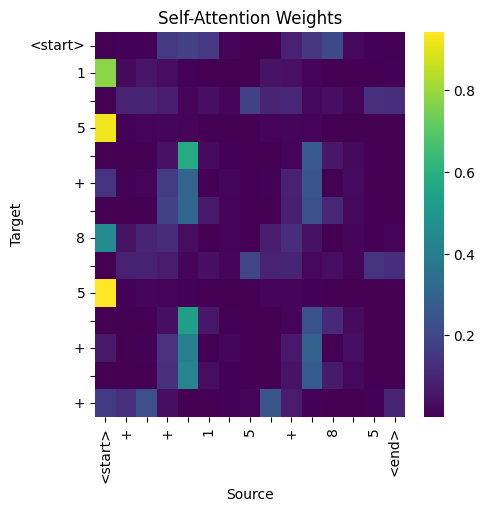

AfterLinear.shape: torch.Size([14, 1, 4])
AfterAddTGT.shape: torch.Size([14, 1, 4])
AfterAddTGT: tensor([[[ 7.7589e+00, -6.0778e+00, -4.3833e-01, -2.1626e+00]],

        [[-4.8843e+00,  9.0416e-01, -5.5201e+00,  6.9373e+00]],

        [[ 7.4479e+00, -6.3118e+00,  2.5102e-01, -2.2904e+00]],

        [[-5.2149e+00,  1.1685e+00, -5.2911e+00,  6.7752e+00]],

        [[-8.5945e+00,  1.9148e-03,  1.6184e+00,  4.6253e+00]],

        [[-3.4645e+00, -4.0223e-01, -6.1827e+00,  7.5057e+00]],

        [[ 7.4070e+00, -7.4180e+00, -9.5405e-01, -1.4667e-01]],

        [[-4.3513e+00,  4.3358e-01, -5.8230e+00,  7.1808e+00]],

        [[ 7.0932e+00, -5.7815e+00,  1.0283e+00, -3.1699e+00]],

        [[-5.1180e+00,  1.0870e+00, -5.3591e+00,  6.8273e+00]],

        [[ 3.8778e+00, -9.4236e+00,  1.2683e+00,  2.8119e+00]],

        [[-3.0238e+00, -8.4881e-01, -6.2935e+00,  7.6354e+00]],

        [[ 2.0847e+00, -8.8958e+00, -7.2454e-01,  5.6716e+00]],

        [[-1.2702e+00, -2.4279e+00, -6.5580e+00,  7.8093e+

In [56]:

# 翻訳処理を実行
seq_len_tgt = max([len(x[1]) for x in train_data])
text = '+ + 1 5 + 8 5'

tokens_src = convert_text_to_indexes(text, vocab=vocab_src)
src = torch.LongTensor(tokens_src).reshape(len(tokens_src), 1).to(device)
memory = positional_encoding(embedding_src_weight[src] * math.sqrt(embedding_size))
ys = torch.ones(1, 1).fill_(START_IDX).type(torch.long).to(device)

# 分析0
print(f"text: {text}")
print(f"memory: {memory}")
print(f"memory_size: {memory.size()}")
print("\n------------------\n")


for i in range(15):
    tgt_embed = positional_encoding(embedding_tgt_weight[ys] * math.sqrt(embedding_size))
    tgt_mask = generate_square_subsequent_mask(ys.size(0)).to(device).type(torch.bool)

    # 分析１
    print(f"iter: {i}")
    print(f"ys: {ys}")
    print(f"tgt_embed: {tgt_embed}")
    now_tgt = convert_indexes_to_text(ys.squeeze(1).tolist(), vocab_tgt)
    print(f"now tgt: {now_tgt}")
    print(f"tgt_embed: {tgt_embed}")
    
    # Self-attention
    self_attn_wq, self_attn_wk, self_attn_wv = self_attn_in_proj_weight.chunk(3, dim=0)
    self_attn_bq, self_attn_bk, self_attn_bv = self_attn_in_proj_bias.chunk(3, dim=0)
    QW = torch.matmul(tgt_embed.permute(1, 0, 2), self_attn_wq.T) + self_attn_bq
    KW = torch.matmul(tgt_embed.permute(1, 0, 2), self_attn_wk.T) + self_attn_bk
    VW = torch.matmul(tgt_embed.permute(1, 0, 2), self_attn_wv.T) + self_attn_bv
    self_attn_weights = F.softmax(torch.bmm(QW, KW.transpose(-2, -1)) / math.sqrt(embedding_size), dim=-1)
    AV = torch.matmul(self_attn_weights, VW)
    self_attn_output = torch.matmul(AV, self_attn_out_proj_weight.T) + self_attn_out_proj_bias
    self_attn_output = self_attn_output.permute(1, 0, 2)
    tgt = tgt_embed + self_attn_output
    tgt = loaded_model.decoder_layer.norm1(tgt)

    # 分析2
    print("SelfAttention Layer")
    print(f"QV.shape: {QW.shape}")
    print(f"KV.shape: {KW.shape}")
    print(f"WV.shape: {VW.shape}")
    print(f"attn_weight.shape: {self_attn_weights.shape}")
    print(f"AV.shape: {AV.shape}")
    self_attn_weights_np = self_attn_weights.squeeze(0).detach().cpu().numpy()
    print(f"self_attention: \n{self_attn_weights_np}")
    tgt_tokens_ = convert_indexes_to_list(ys.squeeze(1).tolist(), vocab_tgt)
    src_tokens_ = tgt_tokens_
    print(f"tgt_tokens: {tgt_tokens_}")
    # Self-Attentionの可視化
    visualize_attention(self_attn_weights_np, src_tokens_, tgt_tokens_, title="Self-Attention Weights")

    # Attention with the encoder outputs (memory)
    multi_attn_wq, multi_attn_wk, multi_attn_wv = multihead_attn_in_proj_weight.chunk(3, dim=0)
    multi_attn_bq, multi_attn_bk, multi_attn_bv = multihead_attn_in_proj_bias.chunk(3, dim=0)
    QW = torch.matmul(tgt.permute(1, 0, 2), multi_attn_wq.T) + multi_attn_bq
    KW = torch.matmul(memory.permute(1, 0, 2), multi_attn_wk.T) + multi_attn_bk
    VW = torch.matmul(memory.permute(1, 0, 2), multi_attn_wv.T) + multi_attn_bv
    multi_attn_weights = F.softmax(torch.bmm(QW, KW.transpose(-2, -1)) / math.sqrt(embedding_size), dim=-1)
    AV = torch.matmul(multi_attn_weights, VW)
    multi_attn_output = torch.matmul(AV, multihead_attn_out_proj_weight.T) + multihead_attn_out_proj_bias
    multi_attn_output = multi_attn_output.permute(1, 0, 2)
    tgt = tgt + multi_attn_output
    tgt = loaded_model.decoder_layer.norm2(tgt)

    # 分析3
    print(f"QV.shape: {QW.shape}")
    print(f"KV.shape: {KW.shape}")
    print(f"WV.shape: {VW.shape}")
    print(f"attn_weight.shape: {multi_attn_weights.shape}")
    print(f"AV.shape: {AV.shape}")
    multi_attn_weights_np = multi_attn_weights.squeeze(0).detach().cpu().numpy()
    print(f"multi_attention: \n{multi_attn_weights_np}")
    tgt_tokens_ = convert_indexes_to_list(ys.squeeze(1).tolist(), vocab_tgt)
    print(tokens_src)
    print(src.squeeze(1))
    print(src.squeeze(1).tolist())
    src_tokens_ = convert_indexes_to_list(src.squeeze(1).tolist(), vocab_src)
    # Memory-Attentionの可視化
    visualize_attention(multi_attn_weights_np, src_tokens_, tgt_tokens_, title="Self-Attention Weights")

    
    # Feedforward network

    # decoder linear1, 2
    tgt2 = tgt.matmul(linear1_weight.T) + linear1_bias
    tgt2 = F.relu(tgt2)
    tgt2 = tgt2.matmul(linear2_weight.T) + linear2_bias
    tgt = tgt + tgt2

    # LayerNorm
    tgt = loaded_model.decoder_layer.norm3(tgt)

    output = tgt.transpose(0, 1)
    output = loaded_model.output(output[:, -1])

    _, next_word = torch.max(output, dim=1)
    next_word = next_word.item()


    # 分析4
    print(f"AfterLinear.shape: {tgt2.shape}")
    print(f"AfterAddTGT.shape: {tgt.shape}")
    print(f"AfterAddTGT: {tgt}")
    print(f"output.shape: {output.shape}")
    print(f"output: {output}")

    ys = torch.cat([ys, torch.ones(1, 1).fill_(next_word).type_as(src.data)], dim=0)
    print(f"predicted: {next_word}")

    print("\n------------------\n")
    
    if next_word == END_IDX:
        break


flat_indexes = [idx for sublist in ys.tolist() for idx in sublist] if isinstance(ys.tolist()[0], list) else ys.tolist()

print(f"Input: {text}")
print(f"Decoded sequence: {convert_indexes_to_text(flat_indexes, vocab_tgt)}")

## TGTのベクトル移動を観察

tensor([[ 0.2789,  0.8074],
        [ 0.3162,  0.7410],
        [ 0.2553,  0.5859],
        [ 0.3774,  0.7049],
        [ 0.0874, -0.0352],
        [ 0.2968,  0.7815],
        [ 0.2097,  0.4331],
        [ 0.3419,  0.6919],
        [ 0.2846,  0.5897],
        [ 0.1269, -0.0840],
        [-0.4537, -0.2129],
        [-0.0707,  0.2403],
        [-0.0962, -0.1298],
        [-0.0252,  0.0443],
        [-0.1624, -0.5780],
        [-0.0701, -0.4328]])
tensor([[-0.4621,  0.0669],
        [-0.5175, -0.0253],
        [-0.3490, -0.0202],
        [-0.6215, -0.2087],
        [ 0.1221, -0.1603],
        [-0.4910,  0.0294],
        [-0.1683, -0.1191],
        [-0.5534, -0.0931],
        [-0.3807, -0.2498],
        [ 0.1163, -0.3563],
        [-0.0046,  0.4107],
        [-0.5334, -0.3138],
        [-0.1239,  0.1117],
        [-0.4777, -0.1350],
        [-0.1031,  0.0746],
        [-0.1002, -0.1240]])


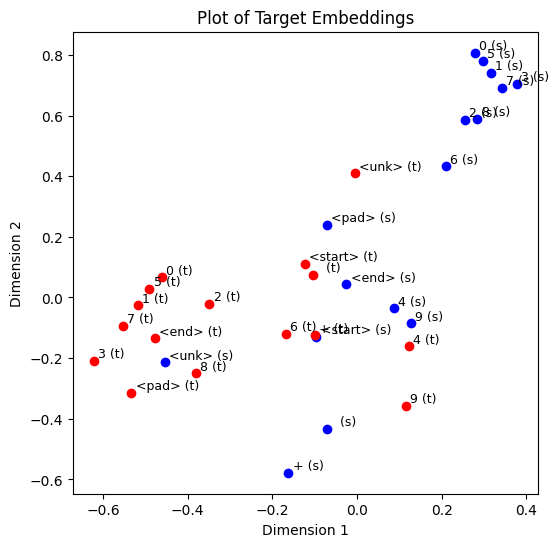

In [43]:
import numpy as np
embedding_src_cpu_01dim = embedding_src_weight.cpu().detach()[: , :2]
embedding_tgt_cpu_01dim = embedding_tgt_weight.cpu().detach()[: , :2]
print(embedding_src_cpu_01dim)
print(embedding_tgt_cpu_01dim)

reverse_vocab_src = {idx: token for token, idx in vocab_src.items()}
reverse_vocab_tgt = {idx: token for token, idx in vocab_tgt.items()}

def plot_embedding_tgt_2d(ys=None, tgt_embed=None, src=None, title="Target Embeddings"):
    plt.figure(figsize=(6, 6))

    # src
    for i, (x, y) in enumerate(embedding_src_cpu_01dim):
        label = reverse_vocab_src[i] + " (s)"
        plt.scatter(x, y, color='blue')
        plt.text(x + 0.01, y + 0.01, label, fontsize=9) 
    # tgt
    for i, (x, y) in enumerate(embedding_tgt_cpu_01dim):
        label = reverse_vocab_tgt[i] + " (t)"
        plt.scatter(x, y, color='red')
        plt.text(x + 0.01, y + 0.01, label, fontsize=9) 

    if tgt_embed is not None:
        tgt_embed = tgt_embed.detach().cpu().numpy()
        print(tgt_embed)
        print(tgt_embed.shape)
        if len(tgt_embed.shape) > 2:
            if tgt_embed.shape[0] == 1:
                tgt_embed = np.squeeze(tgt_embed, axis=0)
            elif tgt_embed.shape[1] == 1:
                tgt_embed = np.squeeze(tgt_embed, axis=1)
        tgt_embed_2d = tgt_embed[:, :2]
        print(tgt_embed_2d)
        for i, (x, y) in enumerate(tgt_embed_2d):
            if src is not None:
                label = convert_indexes_to_list(src.squeeze(1).tolist(), vocab_src)[i] + " (s)"
            else:
                label = convert_indexes_to_list(ys.squeeze(1).tolist(), vocab_tgt)[i] + " (t)"
            plt.scatter(x, y, color='green', s=100, marker='x')
            plt.text(x + 0.01, y + 0.01, label, fontsize=9)

    plt.title(f"Plot of {title}")
    plt.xlabel("Dimension 1")
    plt.ylabel("Dimension 2")
    plt.show()


plot_embedding_tgt_2d()

text: + + 1 5 + 8 5
memory: tensor([[[-0.1925,  0.7405, -4.7773,  2.5804]],

        [[ 0.5166, -0.6157,  0.8775,  1.6319]],

        [[ 0.7691, -1.2817, -0.9260,  1.2579]],

        [[-0.1838, -2.1460,  0.8975,  1.6315]],

        [[-0.8970, -1.5192, -0.9060,  1.2573]],

        [[-0.3265,  1.7657,  0.7869, -0.5932]],

        [[-0.4196,  0.0946, -0.8860,  1.2563]],

        [[ 1.2507,  2.3168,  0.7846, -0.5499]],

        [[ 0.8492, -1.0110, -0.8661,  1.2549]],

        [[ 0.0872, -2.0671,  0.9573,  1.6279]],

        [[-0.6842, -1.7046, -0.8461,  1.2531]],

        [[-0.4308,  1.1838,  0.5898, -0.3371]],

        [[-0.6767, -0.0217, -0.8263,  1.2509]],

        [[ 1.0139,  2.4704,  0.8443, -0.5559]],

        [[ 0.9403,  0.2254,  0.3953,  0.8942]]], device='cuda:0')
memory_size: torch.Size([15, 1, 4])

------------------

iter: 0
ys: tensor([[12]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]]], device='cuda:0')
now tgt: 
tgt_embed: tensor([[[-0.2479,  1

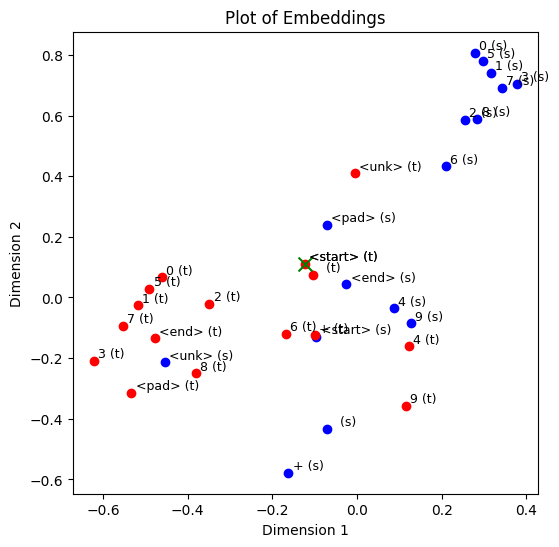

[[[-0.24789122  1.223464    0.55137694 -0.1776787 ]]]
(1, 1, 4)
[[-0.24789122  1.223464  ]]


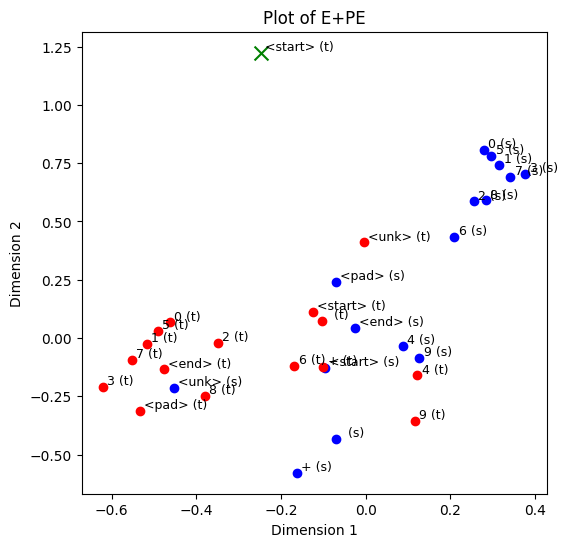

SelfAttention Layer
QV.shape: torch.Size([1, 1, 4])
KV.shape: torch.Size([1, 1, 4])
WV.shape: torch.Size([1, 1, 4])
attn_weight.shape: torch.Size([1, 1, 1])
AV.shape: torch.Size([1, 1, 4])
[[[ 1.6710228   0.86309004  0.24995238 -0.27111757]]]
(1, 1, 4)
[[1.6710228  0.86309004]]


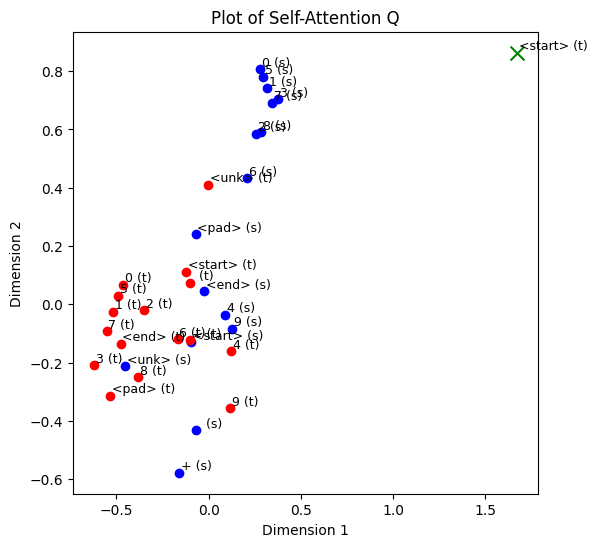

[[[ 1.4933786   1.5820363   0.46946704 -0.9740776 ]]]
(1, 1, 4)
[[1.4933786 1.5820363]]


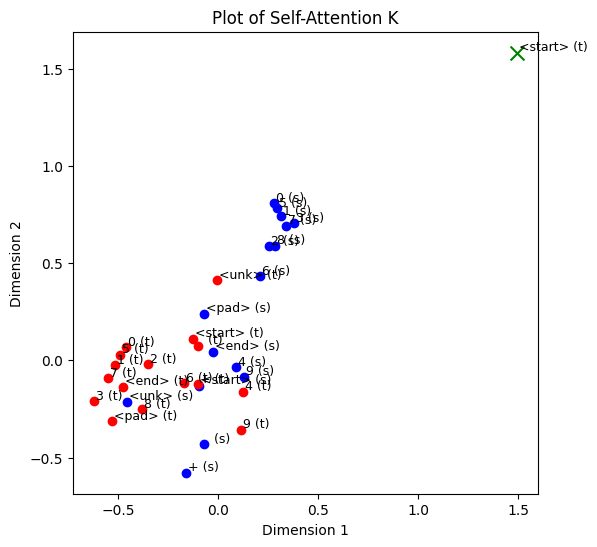

[[[0.22888589 0.17663535 0.4518405  0.49838567]]]
(1, 1, 4)
[[0.22888589 0.17663535]]


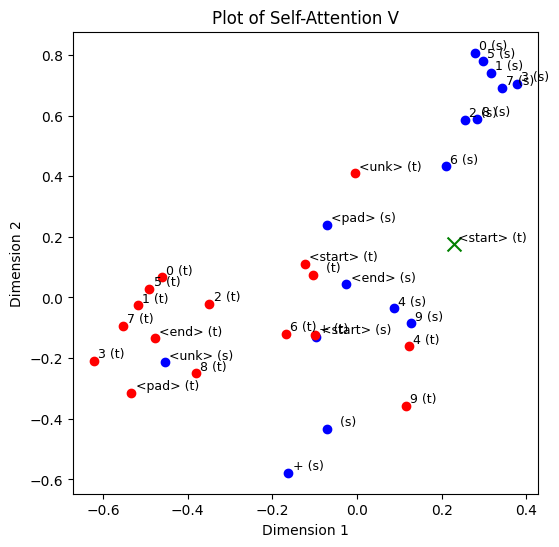

[[[0.22888589 0.17663535 0.4518405  0.49838567]]]
(1, 1, 4)
[[0.22888589 0.17663535]]


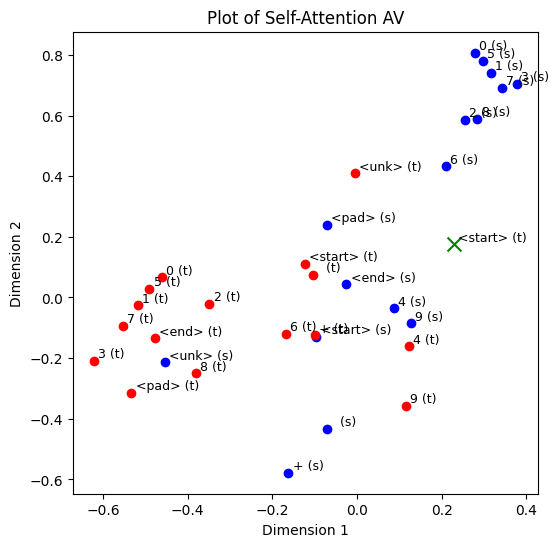

[[[ 0.44667557 -0.59223986  0.41562212  0.18344936]]]
(1, 1, 4)
[[ 0.44667557 -0.59223986]]


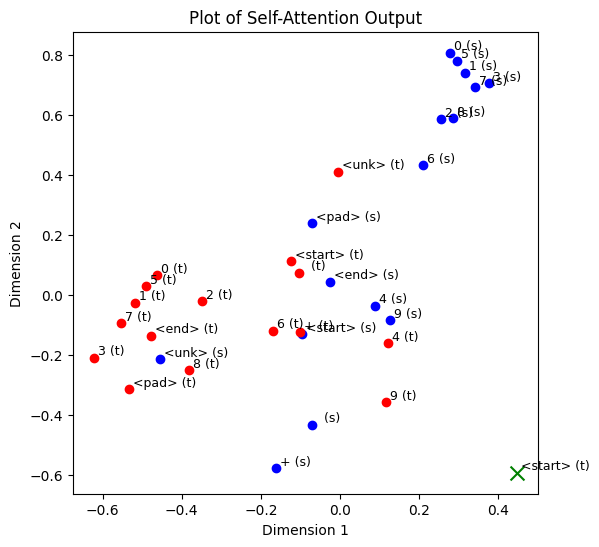

[[[-0.6818321  0.8410137  2.025929  -1.4536825]]]
(1, 1, 4)
[[-0.6818321  0.8410137]]


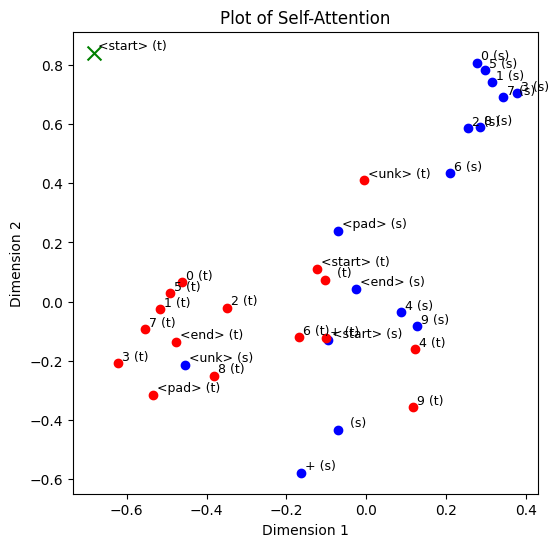

QV.shape: torch.Size([1, 1, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 1, 15])
AV.shape: torch.Size([1, 1, 4])
[[[-2.1084557   2.6131632   2.0207324  -0.89123297]]]
(1, 1, 4)
[[-2.1084557  2.6131632]]


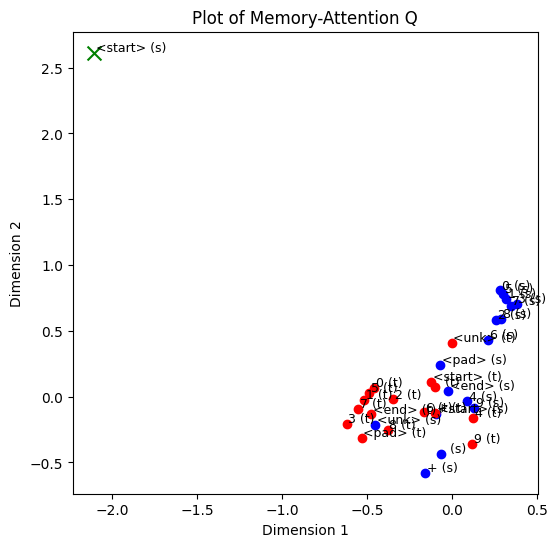

[[-2.5873542  -7.7650056  -5.898153    4.113516  ]
 [ 0.02491225 -1.2135888  -4.709598    1.5243986 ]
 [-0.47594458 -1.9969475  -5.156567    1.3736546 ]
 [-1.842775    0.50118184 -3.8816538   2.1161594 ]
 [-3.0246556  -0.64733064 -1.8812219   2.7934177 ]
 [ 0.9243954  -0.10356134  2.236121    0.4095208 ]
 [-1.419923   -2.239407   -2.2152905   2.3829184 ]
 [ 3.5096743  -1.6742307  -0.818094   -0.90171045]
 [-0.18588106 -2.2118235  -5.1941667   1.290563  ]
 [-1.3821328   0.308455   -4.3772726   1.8689482 ]
 [-2.7963638  -0.5893663  -2.3601792   2.5950441 ]
 [ 0.28278285 -0.02799085  1.6769762   0.7531041 ]
 [-1.8359957  -1.9127802  -1.7172087   2.585585  ]
 [ 3.2743897  -1.5754788  -0.25579175 -0.71645576]
 [ 1.2156768  -1.7601197  -3.9086413   0.6484872 ]]
(15, 4)
[[-2.5873542  -7.7650056 ]
 [ 0.02491225 -1.2135888 ]
 [-0.47594458 -1.9969475 ]
 [-1.842775    0.50118184]
 [-3.0246556  -0.64733064]
 [ 0.9243954  -0.10356134]
 [-1.419923   -2.239407  ]
 [ 3.5096743  -1.6742307 ]
 [-0.18588

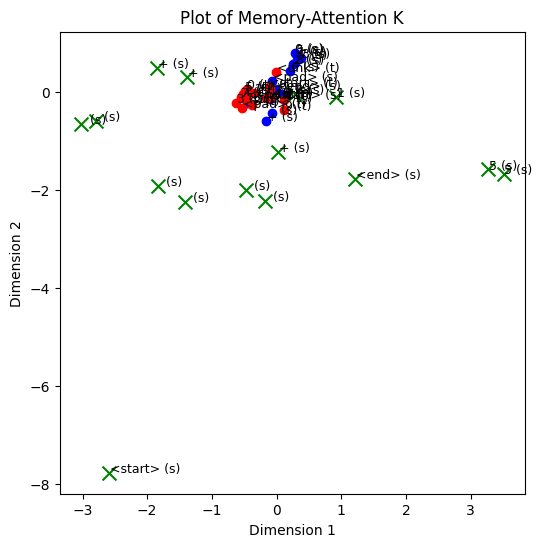

[[-4.157559   -0.22806118  1.2357246   0.5402342 ]
 [ 1.4508448   0.36097324 -1.1337703  -0.02642263]
 [ 0.05422554  0.70298916  0.3357393  -0.383374  ]
 [ 2.7505176  -0.53587735 -0.49158764 -1.1917727 ]
 [ 0.8331038  -1.1127834   0.5858201  -1.1625319 ]
 [-0.5007478   0.06357405 -0.7633241   0.786577  ]
 [-0.40591896 -0.4493605  -0.08779202 -0.03363407]
 [-1.4312079   1.8047924  -1.1555783   1.7204238 ]
 [-0.10231569  0.8126207   0.19123979 -0.19372857]
 [ 2.6538467  -0.23851366 -0.58247584 -1.0411739 ]
 [ 0.93491787 -0.902572    0.6017019  -1.18919   ]
 [-0.18725705 -0.13979931 -0.5472724   0.4329274 ]
 [-0.18144369 -0.73824126 -0.04923896 -0.20051992]
 [-1.3956933   1.5630281  -1.2213548   1.7193637 ]
 [ 0.10003449  1.0408527  -0.8392485   0.53835785]]
(15, 4)
[[-4.157559   -0.22806118]
 [ 1.4508448   0.36097324]
 [ 0.05422554  0.70298916]
 [ 2.7505176  -0.53587735]
 [ 0.8331038  -1.1127834 ]
 [-0.5007478   0.06357405]
 [-0.40591896 -0.4493605 ]
 [-1.4312079   1.8047924 ]
 [-0.10231

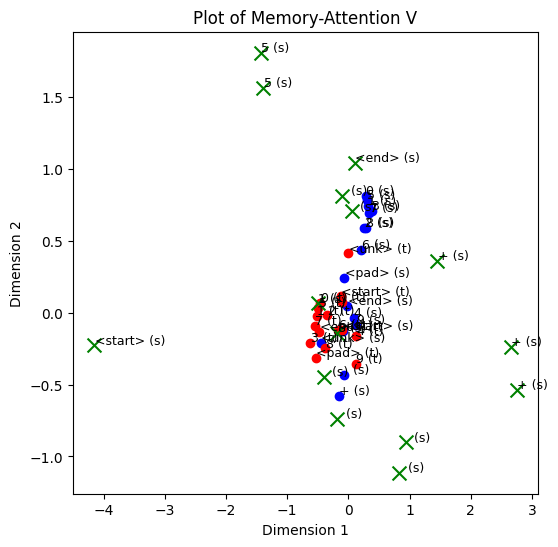

[[-0.13777512 -0.16361687 -0.5070048   0.3639558 ]]
(1, 4)
[[-0.13777512 -0.16361687]]


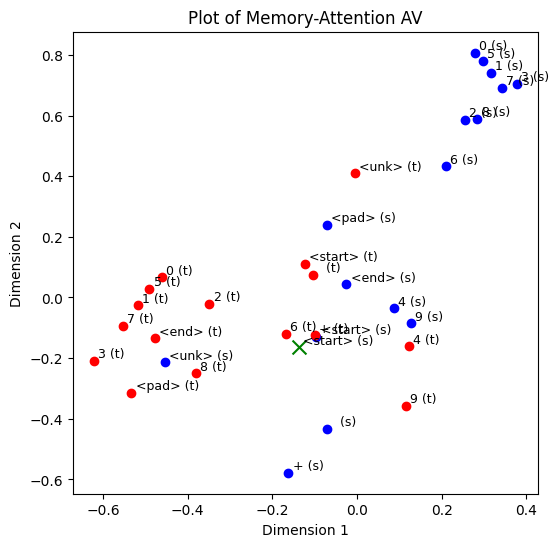

[[[ 0.44667557 -0.59223986  0.41562212  0.18344936]]]
(1, 1, 4)
[[ 0.44667557 -0.59223986]]


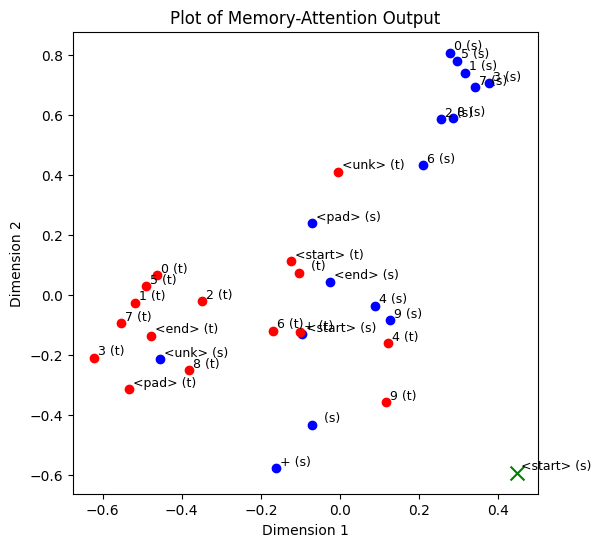

[[[-0.6036807  0.623719   1.8853967 -1.3246564]]]
(1, 1, 4)
[[-0.6036807  0.623719 ]]


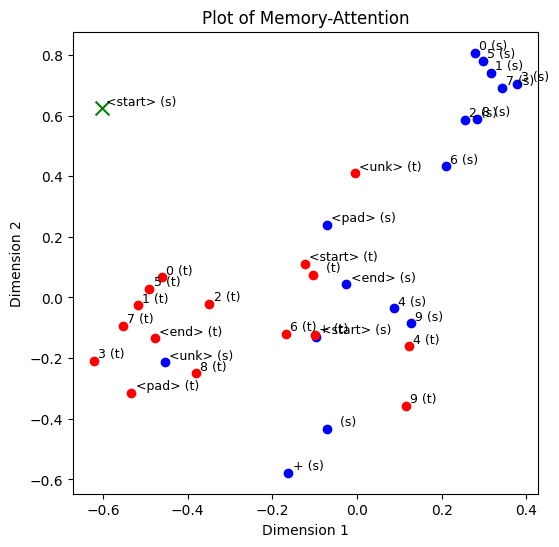

AfterLinear.shape: torch.Size([1, 1, 4])
AfterAddTGT.shape: torch.Size([1, 1, 4])
AfterAddTGT: tensor([[[-4.4172,  4.0960,  2.8647, -3.9480]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[ 14.8026,  26.4542,  -8.8720,  10.0538, -30.3597,  23.2375, -20.8327,  22.8551,   4.6044,
         -29.1157,  -4.0657,  -1.1237,  -4.6492, -28.7647,   0.0966,  -6.3893]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 1

------------------

iter: 1
ys: tensor([[12],
        [ 1]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [[-0.1934,  0.4897,  0.1387,  1.6061]]], device='cuda:0')
now tgt: 1
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [[-0.1934,  0.4897,  0.1387,  1.6061]]], device='cuda:0')
[[[-0.12394561  0.11173202  0.27568847 -0.58883935]]

 [[-0.5174512  -0.02528714  0.0643713   0.30307987]]]
(2, 1, 4)
[[-0.12394561  0.11173202]
 [-0.5174512  -0.0252871

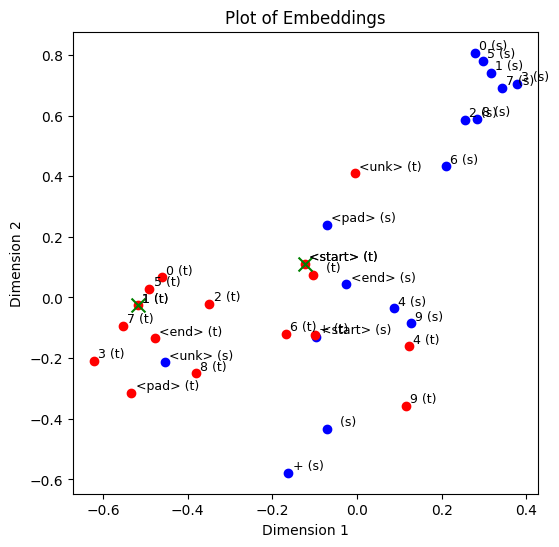

[[[-0.24789122  1.223464    0.55137694 -0.1776787 ]]

 [[-0.1934315   0.48972806  0.13874242  1.6061097 ]]]
(2, 1, 4)
[[-0.24789122  1.223464  ]
 [-0.1934315   0.48972806]]


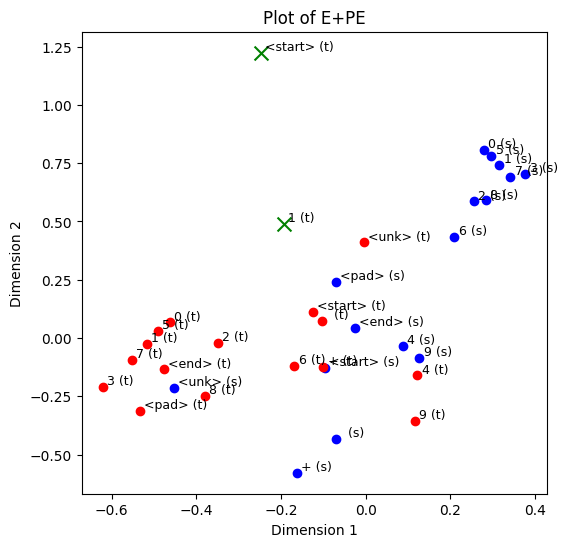

SelfAttention Layer
QV.shape: torch.Size([1, 2, 4])
KV.shape: torch.Size([1, 2, 4])
WV.shape: torch.Size([1, 2, 4])
attn_weight.shape: torch.Size([1, 2, 2])
AV.shape: torch.Size([1, 2, 4])
[[[ 1.6710228   0.86309004  0.24995238 -0.27111757]
  [-0.5829186   0.16324538 -0.7912906   1.0486854 ]]]
(1, 2, 4)
[[ 1.6710228   0.86309004]
 [-0.5829186   0.16324538]]


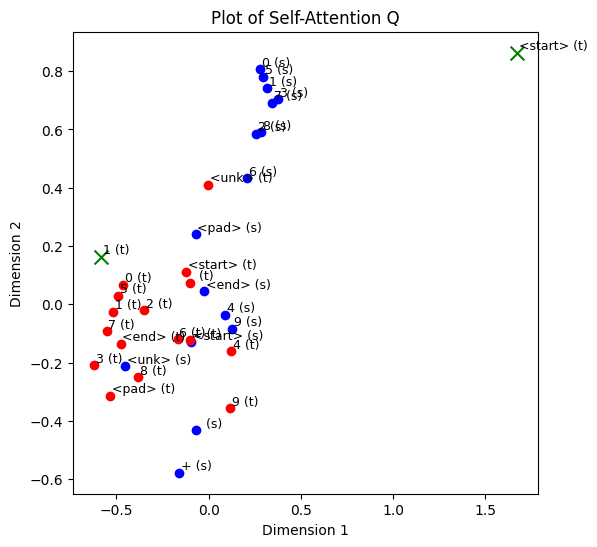

[[[ 1.4933789   1.5820361   0.46946707 -0.9740776 ]
  [ 0.06870762  0.04826249 -0.56696486  0.6129863 ]]]
(1, 2, 4)
[[1.4933789  1.5820361 ]
 [0.06870762 0.04826249]]


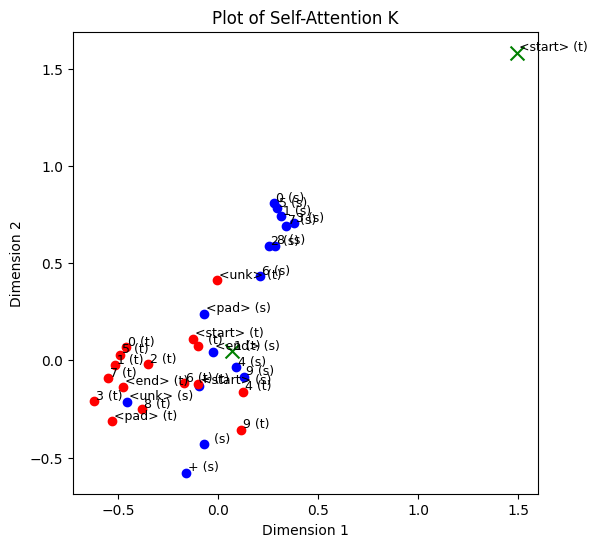

[[[ 0.22888592  0.17663535  0.4518405   0.49838567]
  [ 0.75891817  0.28342536 -0.12693013 -0.9412274 ]]]
(1, 2, 4)
[[0.22888592 0.17663535]
 [0.75891817 0.28342536]]


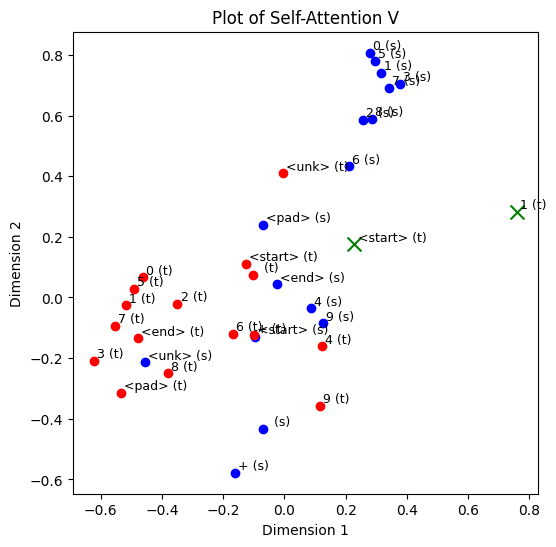

[[[ 0.28190506  0.18731758  0.39394605  0.35438114]
  [ 0.6647515   0.26445282 -0.02410451 -0.68546265]]]
(1, 2, 4)
[[0.28190506 0.18731758]
 [0.6647515  0.26445282]]


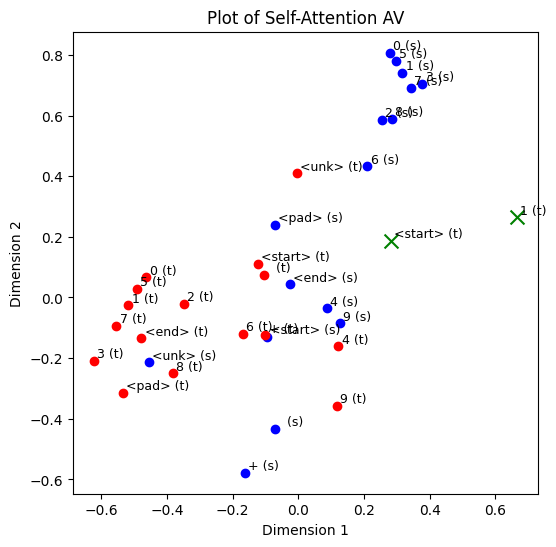

[[[ 0.41936135 -0.3875808   0.31427383  0.18898961]]

 [[ 0.22212772  1.090244   -0.4175529   0.22899532]]]
(2, 1, 4)
[[ 0.41936135 -0.3875808 ]
 [ 0.22212772  1.090244  ]]


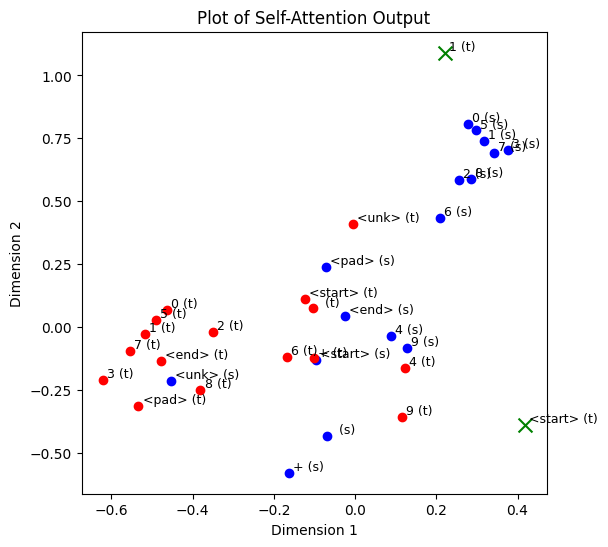

[[[-0.78618115  1.3186512   1.5239275  -1.4638709 ]]

 [[-0.8273742   1.2173632  -1.5898601   1.2508063 ]]]
(2, 1, 4)
[[-0.78618115  1.3186512 ]
 [-0.8273742   1.2173632 ]]


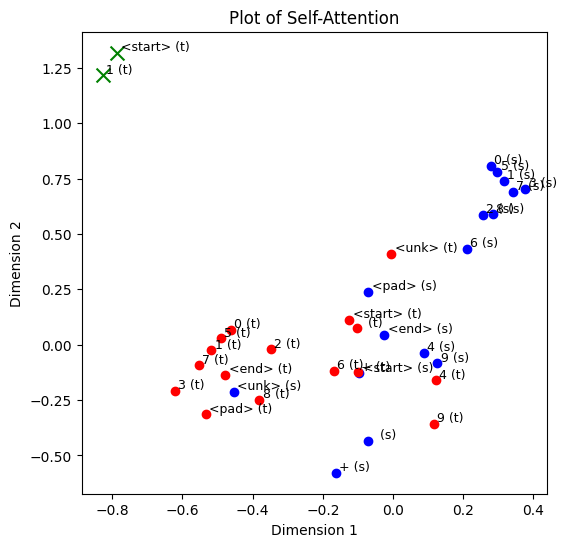

QV.shape: torch.Size([1, 2, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 2, 15])
AV.shape: torch.Size([1, 2, 4])
[[[-1.8807782   2.3404732   1.365473   -1.1356553 ]
  [-0.49036914 -0.8047142  -2.9047544   0.5400931 ]]]
(1, 2, 4)
[[-1.8807782   2.3404732 ]
 [-0.49036914 -0.8047142 ]]


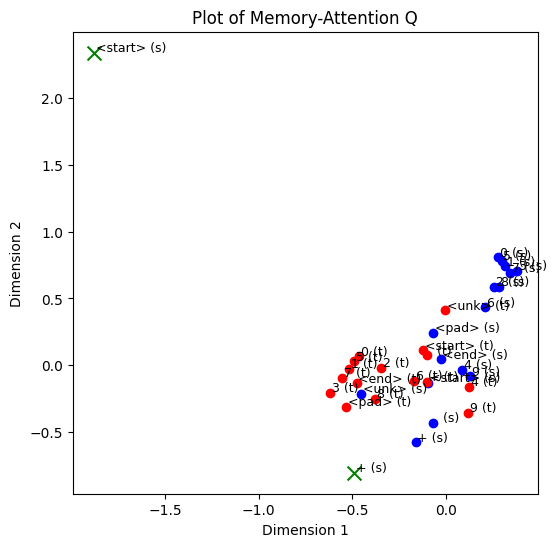

[[-2.5873542  -7.7650056  -5.898153    4.113516  ]
 [ 0.02491225 -1.2135888  -4.709598    1.5243986 ]
 [-0.47594458 -1.9969475  -5.156567    1.3736546 ]
 [-1.842775    0.50118184 -3.8816538   2.1161594 ]
 [-3.0246556  -0.64733064 -1.8812219   2.7934177 ]
 [ 0.9243954  -0.10356134  2.236121    0.4095208 ]
 [-1.419923   -2.239407   -2.2152905   2.3829184 ]
 [ 3.5096743  -1.6742307  -0.818094   -0.90171045]
 [-0.18588106 -2.2118235  -5.1941667   1.290563  ]
 [-1.3821328   0.308455   -4.3772726   1.8689482 ]
 [-2.7963638  -0.5893663  -2.3601792   2.5950441 ]
 [ 0.28278285 -0.02799085  1.6769762   0.7531041 ]
 [-1.8359957  -1.9127802  -1.7172087   2.585585  ]
 [ 3.2743897  -1.5754788  -0.25579175 -0.71645576]
 [ 1.2156768  -1.7601197  -3.9086413   0.6484872 ]]
(15, 4)
[[-2.5873542  -7.7650056 ]
 [ 0.02491225 -1.2135888 ]
 [-0.47594458 -1.9969475 ]
 [-1.842775    0.50118184]
 [-3.0246556  -0.64733064]
 [ 0.9243954  -0.10356134]
 [-1.419923   -2.239407  ]
 [ 3.5096743  -1.6742307 ]
 [-0.18588

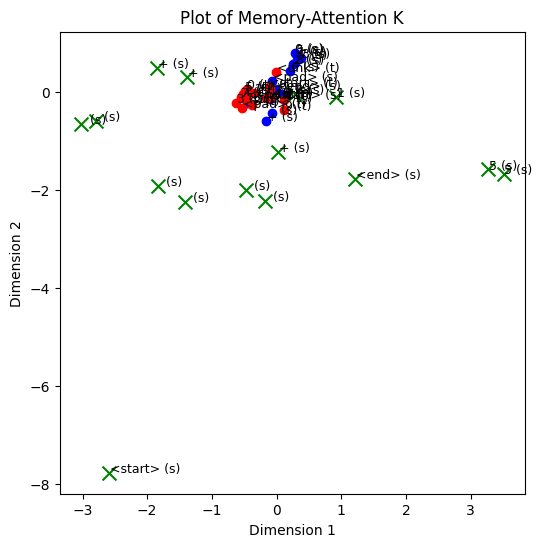

[[-4.157559   -0.22806118  1.2357246   0.5402342 ]
 [ 1.4508448   0.36097324 -1.1337703  -0.02642263]
 [ 0.05422554  0.70298916  0.3357393  -0.383374  ]
 [ 2.7505176  -0.53587735 -0.49158764 -1.1917727 ]
 [ 0.8331038  -1.1127834   0.5858201  -1.1625319 ]
 [-0.5007478   0.06357405 -0.7633241   0.786577  ]
 [-0.40591896 -0.4493605  -0.08779202 -0.03363407]
 [-1.4312079   1.8047924  -1.1555783   1.7204238 ]
 [-0.10231569  0.8126207   0.19123979 -0.19372857]
 [ 2.6538467  -0.23851366 -0.58247584 -1.0411739 ]
 [ 0.93491787 -0.902572    0.6017019  -1.18919   ]
 [-0.18725705 -0.13979931 -0.5472724   0.4329274 ]
 [-0.18144369 -0.73824126 -0.04923896 -0.20051992]
 [-1.3956933   1.5630281  -1.2213548   1.7193637 ]
 [ 0.10003449  1.0408527  -0.8392485   0.53835785]]
(15, 4)
[[-4.157559   -0.22806118]
 [ 1.4508448   0.36097324]
 [ 0.05422554  0.70298916]
 [ 2.7505176  -0.53587735]
 [ 0.8331038  -1.1127834 ]
 [-0.5007478   0.06357405]
 [-0.40591896 -0.4493605 ]
 [-1.4312079   1.8047924 ]
 [-0.10231

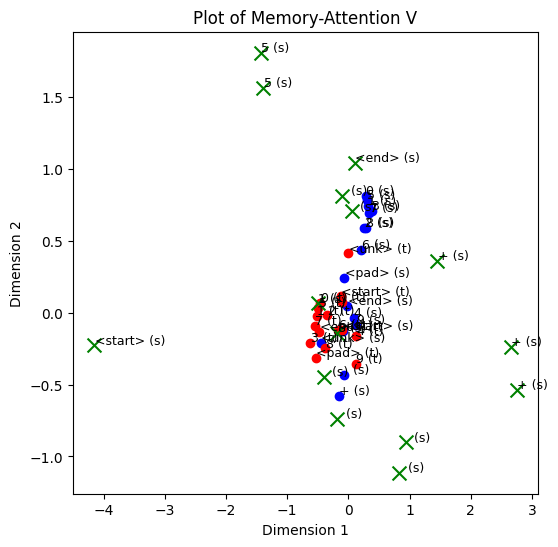

[[ 0.12984496 -0.26461595 -0.39418224  0.11795878]
 [-4.0368767  -0.20713493  1.2026626   0.5176533 ]]
(2, 4)
[[ 0.12984496 -0.26461595]
 [-4.0368767  -0.20713493]]


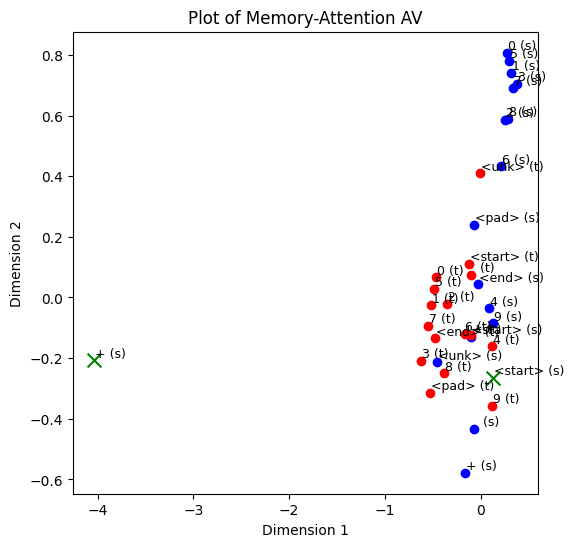

[[[ 0.41936135 -0.3875808   0.31427383  0.18898961]]

 [[ 0.22212772  1.090244   -0.4175529   0.22899532]]]
(2, 1, 4)
[[ 0.41936135 -0.3875808 ]
 [ 0.22212772  1.090244  ]]


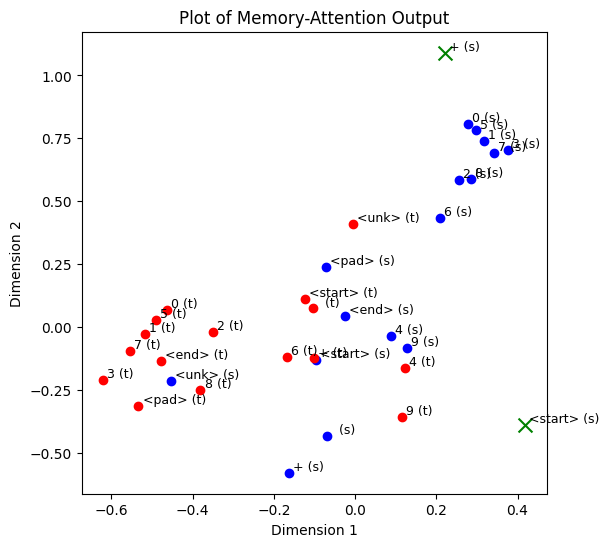

[[[-0.5309919   0.98810756  1.3534826  -1.5006131 ]]

 [[-1.6690059   1.0268178  -0.6707049   1.0704353 ]]]
(2, 1, 4)
[[-0.5309919   0.98810756]
 [-1.6690059   1.0268178 ]]


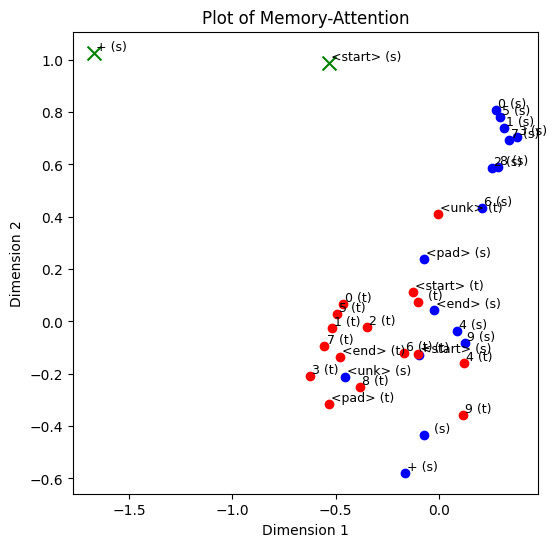

AfterLinear.shape: torch.Size([2, 1, 4])
AfterAddTGT.shape: torch.Size([2, 1, 4])
AfterAddTGT: tensor([[[-3.6033,  4.3668,  2.4201, -4.5128]],

        [[-4.7010,  0.7108, -5.6175,  7.0443]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[-4.4242e+01, -2.5253e+01, -2.6222e+01,  2.3729e+01,  8.8910e+00, -3.9589e+01, -9.7749e+00,
         -3.1262e+00, -3.5927e+01,  8.6432e+00, -7.4477e-01, -1.0101e+00,  9.4433e-03,  1.9652e+01,
          3.2226e+01,  7.9169e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
predicted: 14

------------------

iter: 2
ys: tensor([[12],
        [ 1],
        [14]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [[-0.1934,  0.4897,  0.1387,  1.6061]],

        [[ 0.7031, -0.2669,  0.4363, -0.1348]]], device='cuda:0')
now tgt: 1 
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [[-0.1934,  0.4897,  0.1387,  1.6061]],

        [[ 0.7031, -0.

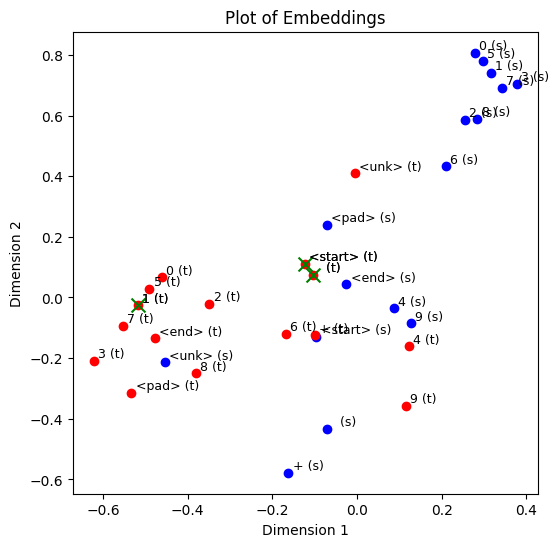

[[[-0.24789122  1.223464    0.55137694 -0.1776787 ]]

 [[-0.1934315   0.48972806  0.13874242  1.6061097 ]]

 [[ 0.7031361  -0.2668827   0.4362919  -0.1347509 ]]]
(3, 1, 4)
[[-0.24789122  1.223464  ]
 [-0.1934315   0.48972806]
 [ 0.7031361  -0.2668827 ]]


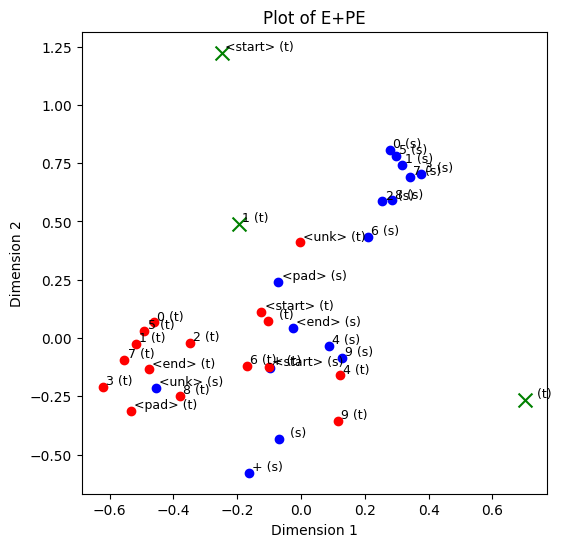

SelfAttention Layer
QV.shape: torch.Size([1, 3, 4])
KV.shape: torch.Size([1, 3, 4])
WV.shape: torch.Size([1, 3, 4])
attn_weight.shape: torch.Size([1, 3, 3])
AV.shape: torch.Size([1, 3, 4])
[[[ 1.6710228   0.86309004  0.24995238 -0.27111757]
  [-0.5829186   0.16324538 -0.7912906   1.0486854 ]
  [-0.30402273 -0.64216936 -0.7364837   0.40141028]]]
(1, 3, 4)
[[ 1.6710228   0.86309004]
 [-0.5829186   0.16324538]
 [-0.30402273 -0.64216936]]


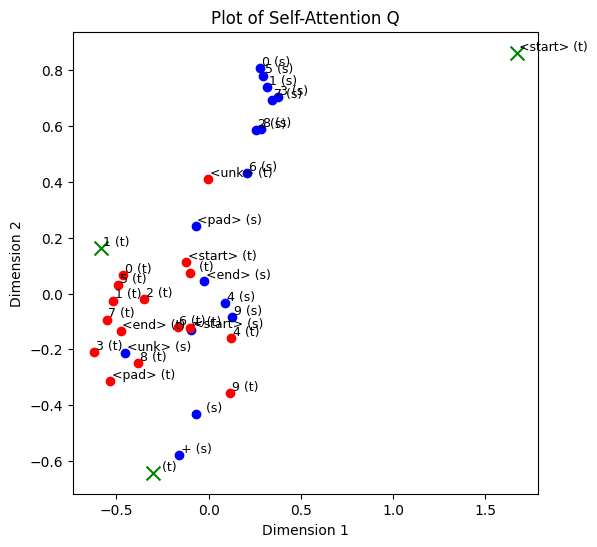

[[[ 1.4933789   1.5820361   0.46946707 -0.9740776 ]
  [ 0.06870762  0.04826249 -0.56696486  0.6129863 ]
  [ 0.14256531  0.18516839 -0.01008819 -0.38967878]]]
(1, 3, 4)
[[1.4933789  1.5820361 ]
 [0.06870762 0.04826249]
 [0.14256531 0.18516839]]


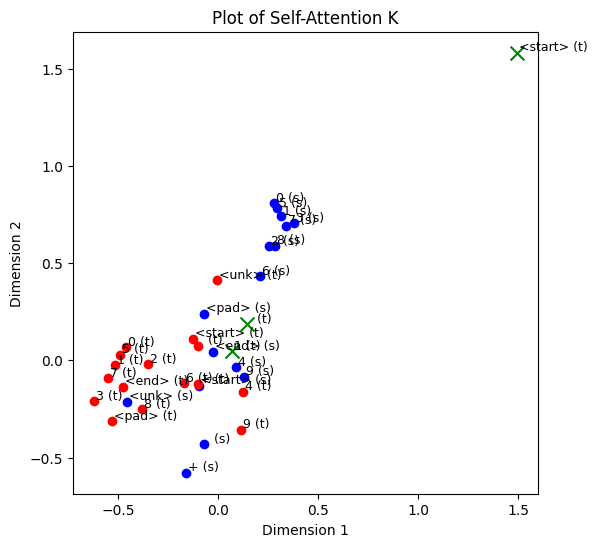

[[[ 0.22888592  0.17663535  0.4518405   0.49838567]
  [ 0.75891817  0.28342536 -0.12693013 -0.9412274 ]
  [ 0.12037133  0.6260945  -0.47412893 -0.7289601 ]]]
(1, 3, 4)
[[0.22888592 0.17663535]
 [0.75891817 0.28342536]
 [0.12037133 0.6260945 ]]


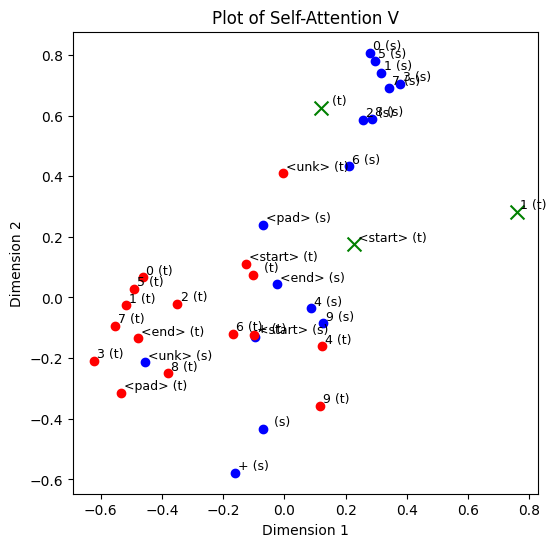

[[[ 0.26223862  0.24073784  0.2882595   0.22248635]
  [ 0.5131534   0.36516222 -0.14942661 -0.69757575]
  [ 0.47513166  0.38472658 -0.16823974 -0.68222517]]]
(1, 3, 4)
[[0.26223862 0.24073784]
 [0.5131534  0.36516222]
 [0.47513166 0.38472658]]


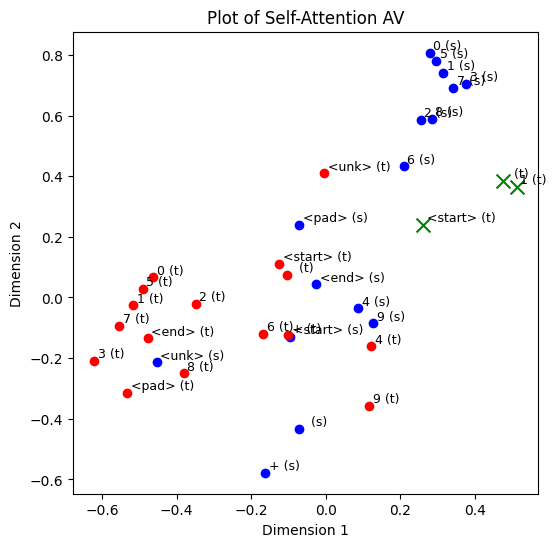

[[[ 0.38724923 -0.18253617  0.13055053  0.1434547 ]]

 [[ 0.203602    1.1477069  -0.6339911   0.1137011 ]]

 [[ 0.20314752  1.1342388  -0.6663135   0.08909918]]]
(3, 1, 4)
[[ 0.38724923 -0.18253617]
 [ 0.203602    1.1477069 ]
 [ 0.20314752  1.1342388 ]]


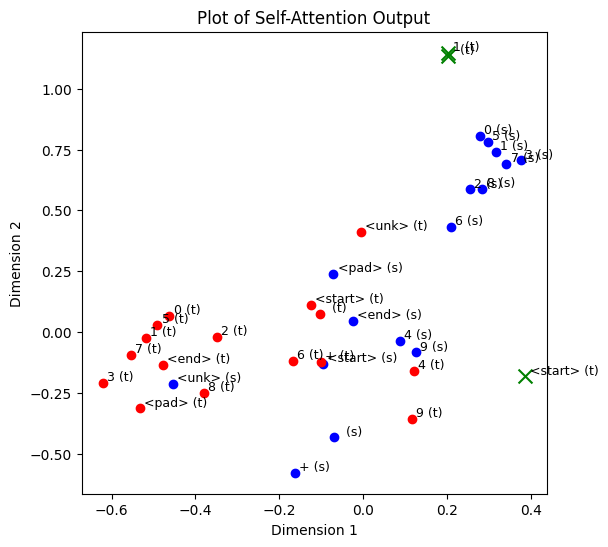

[[[-0.74869305  1.7408842   0.8070492  -1.4051001 ]]

 [[-0.7317219   1.3091072  -1.7141267   1.1326851 ]]

 [[ 0.9742801   1.3227961  -1.6125606  -1.0151784 ]]]
(3, 1, 4)
[[-0.74869305  1.7408842 ]
 [-0.7317219   1.3091072 ]
 [ 0.9742801   1.3227961 ]]


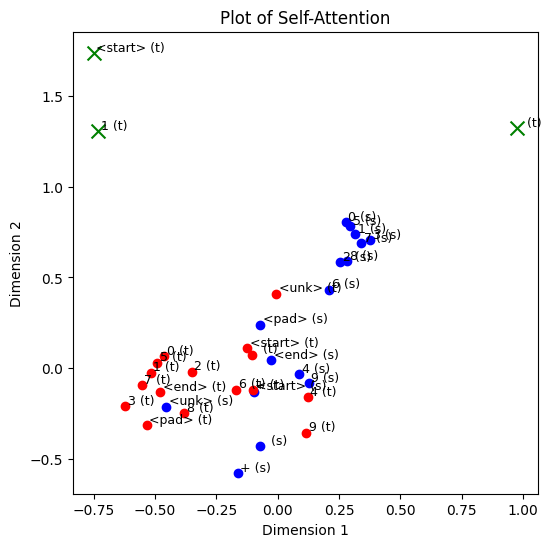

QV.shape: torch.Size([1, 3, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 3, 15])
AV.shape: torch.Size([1, 3, 4])
[[[-1.3548748   1.824782    0.5326145  -1.3809606 ]
  [-0.25986242 -0.8873553  -2.965203    0.36353397]
  [ 2.2545013  -0.81756115 -1.3050855  -1.8110772 ]]]
(1, 3, 4)
[[-1.3548748   1.824782  ]
 [-0.25986242 -0.8873553 ]
 [ 2.2545013  -0.81756115]]


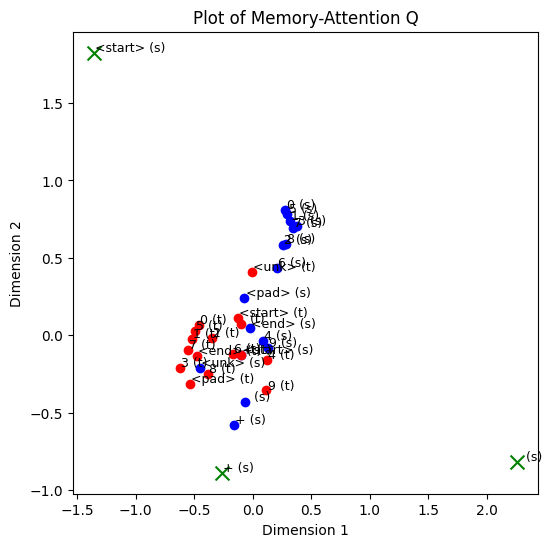

[[-2.5873542  -7.7650056  -5.898153    4.113516  ]
 [ 0.02491225 -1.2135888  -4.709598    1.5243986 ]
 [-0.47594458 -1.9969475  -5.156567    1.3736546 ]
 [-1.842775    0.50118184 -3.8816538   2.1161594 ]
 [-3.0246556  -0.64733064 -1.8812219   2.7934177 ]
 [ 0.9243954  -0.10356134  2.236121    0.4095208 ]
 [-1.419923   -2.239407   -2.2152905   2.3829184 ]
 [ 3.5096743  -1.6742307  -0.818094   -0.90171045]
 [-0.18588106 -2.2118235  -5.1941667   1.290563  ]
 [-1.3821328   0.308455   -4.3772726   1.8689482 ]
 [-2.7963638  -0.5893663  -2.3601792   2.5950441 ]
 [ 0.28278285 -0.02799085  1.6769762   0.7531041 ]
 [-1.8359957  -1.9127802  -1.7172087   2.585585  ]
 [ 3.2743897  -1.5754788  -0.25579175 -0.71645576]
 [ 1.2156768  -1.7601197  -3.9086413   0.6484872 ]]
(15, 4)
[[-2.5873542  -7.7650056 ]
 [ 0.02491225 -1.2135888 ]
 [-0.47594458 -1.9969475 ]
 [-1.842775    0.50118184]
 [-3.0246556  -0.64733064]
 [ 0.9243954  -0.10356134]
 [-1.419923   -2.239407  ]
 [ 3.5096743  -1.6742307 ]
 [-0.18588

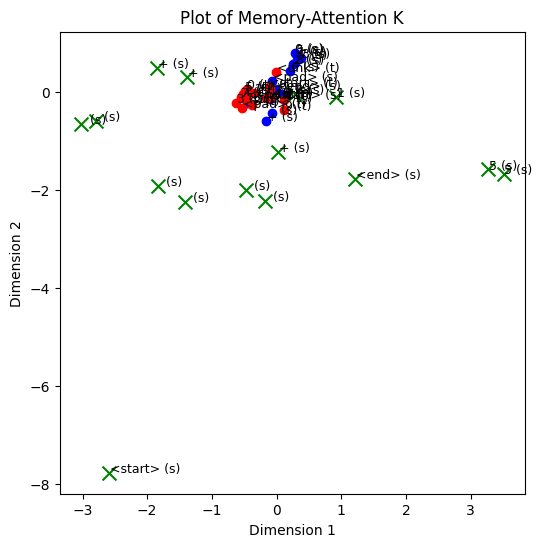

[[-4.157559   -0.22806118  1.2357246   0.5402342 ]
 [ 1.4508448   0.36097324 -1.1337703  -0.02642263]
 [ 0.05422554  0.70298916  0.3357393  -0.383374  ]
 [ 2.7505176  -0.53587735 -0.49158764 -1.1917727 ]
 [ 0.8331038  -1.1127834   0.5858201  -1.1625319 ]
 [-0.5007478   0.06357405 -0.7633241   0.786577  ]
 [-0.40591896 -0.4493605  -0.08779202 -0.03363407]
 [-1.4312079   1.8047924  -1.1555783   1.7204238 ]
 [-0.10231569  0.8126207   0.19123979 -0.19372857]
 [ 2.6538467  -0.23851366 -0.58247584 -1.0411739 ]
 [ 0.93491787 -0.902572    0.6017019  -1.18919   ]
 [-0.18725705 -0.13979931 -0.5472724   0.4329274 ]
 [-0.18144369 -0.73824126 -0.04923896 -0.20051992]
 [-1.3956933   1.5630281  -1.2213548   1.7193637 ]
 [ 0.10003449  1.0408527  -0.8392485   0.53835785]]
(15, 4)
[[-4.157559   -0.22806118]
 [ 1.4508448   0.36097324]
 [ 0.05422554  0.70298916]
 [ 2.7505176  -0.53587735]
 [ 0.8331038  -1.1127834 ]
 [-0.5007478   0.06357405]
 [-0.40591896 -0.4493605 ]
 [-1.4312079   1.8047924 ]
 [-0.10231

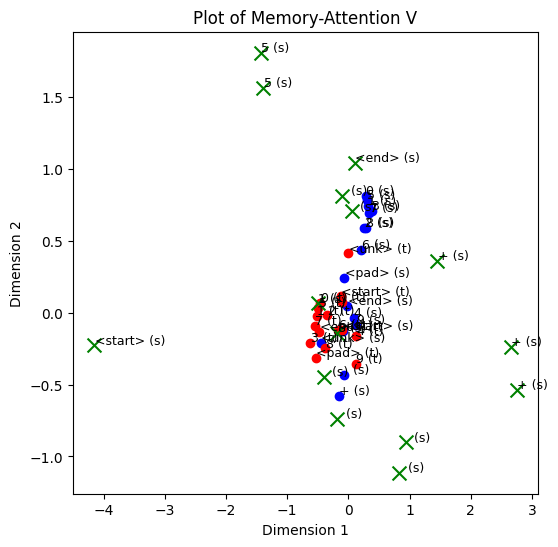

[[ 0.6708464  -0.31669644 -0.3222579  -0.2363815 ]
 [-4.0110884  -0.200811    1.1952549   0.51345396]
 [-1.1900235   1.6020886  -1.0765762   1.4999075 ]]
(3, 4)
[[ 0.6708464  -0.31669644]
 [-4.0110884  -0.200811  ]
 [-1.1900235   1.6020886 ]]


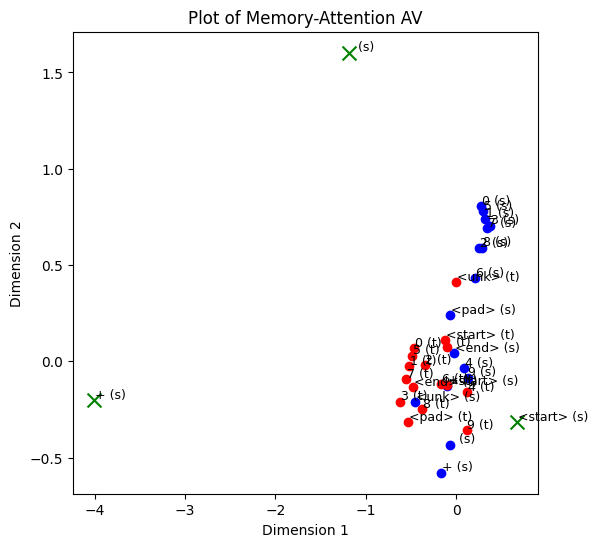

[[[ 0.38724923 -0.18253617  0.13055053  0.1434547 ]]

 [[ 0.203602    1.1477069  -0.6339911   0.1137011 ]]

 [[ 0.20314752  1.1342388  -0.6663135   0.08909918]]]
(3, 1, 4)
[[ 0.38724923 -0.18253617]
 [ 0.203602    1.1477069 ]
 [ 0.20314752  1.1342388 ]]


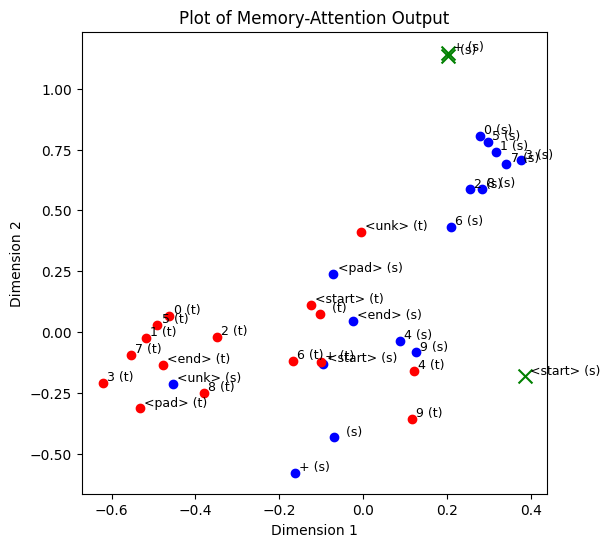

[[[-0.10563611  1.2877712   0.3871965  -1.6352135 ]]

 [[-1.6509151   1.0576435  -0.72352874  1.0490474 ]]

 [[-0.57418066  0.76367325  1.7049227  -1.4110761 ]]]
(3, 1, 4)
[[-0.10563611  1.2877712 ]
 [-1.6509151   1.0576435 ]
 [-0.57418066  0.76367325]]


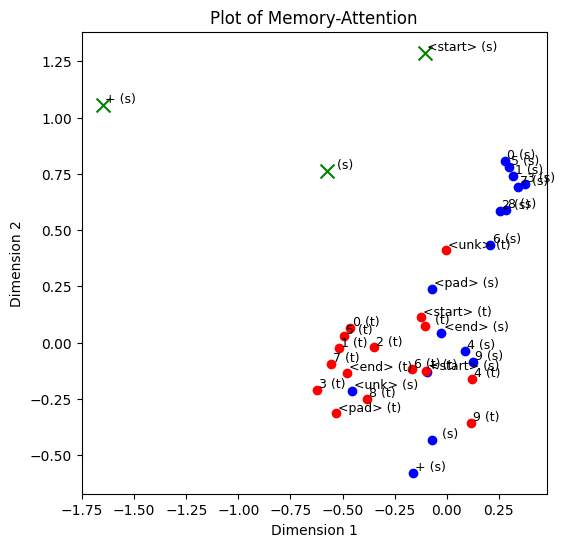

AfterLinear.shape: torch.Size([3, 1, 4])
AfterAddTGT.shape: torch.Size([3, 1, 4])
AfterAddTGT: tensor([[[ 7.7796, -5.7111, -0.3928, -2.5625]],

        [[-4.6082,  0.6301, -5.6712,  7.0864]],

        [[-0.5071,  3.2079,  2.3684, -6.0929]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[ 25.4343,  25.9295,   4.5618,  -4.6046, -17.8974,  28.9499,  -7.7611,  15.7462,  16.9922,
         -16.8805,  -1.6035,  -0.1144,  -1.4127, -22.5420, -10.0050, -11.3601]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 5

------------------

iter: 3
ys: tensor([[12],
        [ 1],
        [14],
        [ 5]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [[-0.1934,  0.4897,  0.1387,  1.6061]],

        [[ 0.7031, -0.2669,  0.4363, -0.1348]],

        [[-0.8408, -0.9311, -0.0663,  1.8630]]], device='cuda:0')
now tgt: 1 5
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [

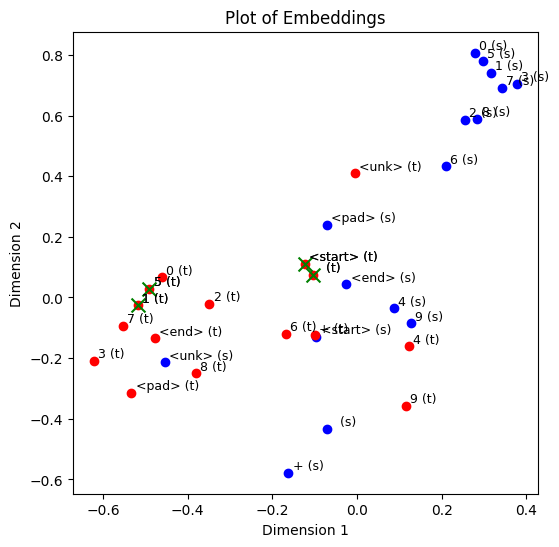

[[[-0.24789122  1.223464    0.55137694 -0.1776787 ]]

 [[-0.1934315   0.48972806  0.13874242  1.6061097 ]]

 [[ 0.7031361  -0.2668827   0.4362919  -0.1347509 ]]

 [[-0.8407894  -0.9311025  -0.0662975   1.8629564 ]]]
(4, 1, 4)
[[-0.24789122  1.223464  ]
 [-0.1934315   0.48972806]
 [ 0.7031361  -0.2668827 ]
 [-0.8407894  -0.9311025 ]]


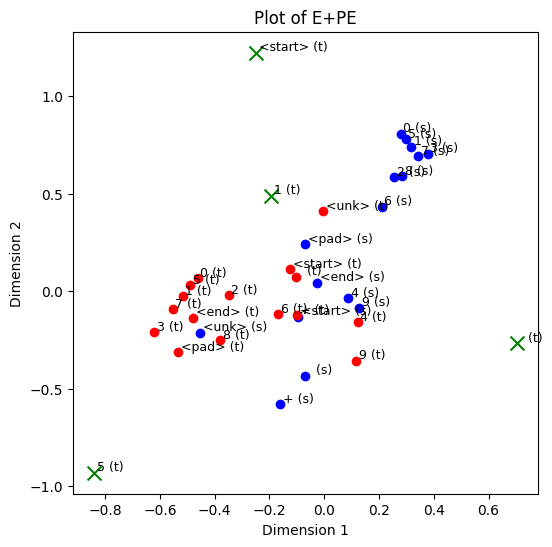

SelfAttention Layer
QV.shape: torch.Size([1, 4, 4])
KV.shape: torch.Size([1, 4, 4])
WV.shape: torch.Size([1, 4, 4])
attn_weight.shape: torch.Size([1, 4, 4])
AV.shape: torch.Size([1, 4, 4])
[[[ 1.6710228   0.86309004  0.24995238 -0.27111757]
  [-0.5829186   0.16324538 -0.7912906   1.0486854 ]
  [-0.30402273 -0.64216936 -0.7364837   0.40141028]
  [-1.2785212   0.3870846  -0.57777995  0.9510717 ]]]
(1, 4, 4)
[[ 1.6710228   0.86309004]
 [-0.5829186   0.16324538]
 [-0.30402273 -0.64216936]
 [-1.2785212   0.3870846 ]]


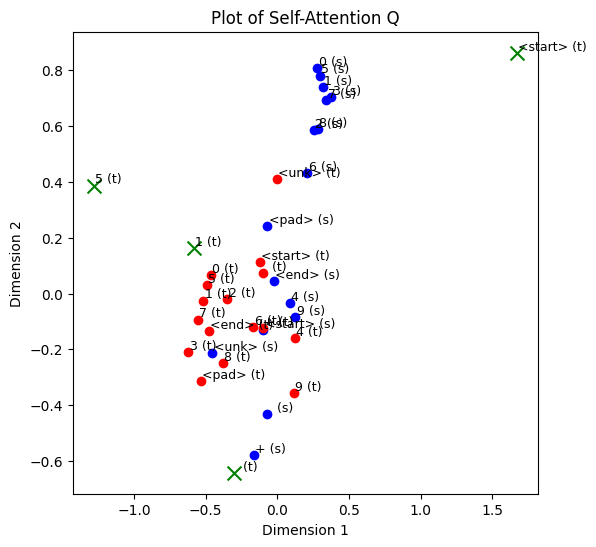

[[[ 1.4933789   1.5820361   0.46946707 -0.9740776 ]
  [ 0.06870762  0.04826249 -0.56696486  0.6129863 ]
  [ 0.14256531  0.18516839 -0.01008819 -0.38967878]
  [-1.6470414  -1.7903842  -1.9260877   2.440474  ]]]
(1, 4, 4)
[[ 1.4933789   1.5820361 ]
 [ 0.06870762  0.04826249]
 [ 0.14256531  0.18516839]
 [-1.6470414  -1.7903842 ]]


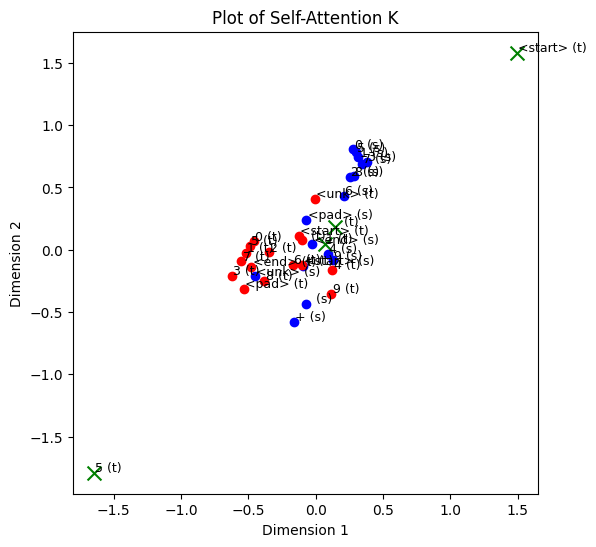

[[[ 0.22888592  0.17663535  0.4518405   0.49838567]
  [ 0.75891817  0.28342536 -0.12693013 -0.9412274 ]
  [ 0.12037133  0.6260945  -0.47412893 -0.7289601 ]
  [ 1.0959395  -0.47901723 -0.58115566 -1.5819137 ]]]
(1, 4, 4)
[[ 0.22888592  0.17663535]
 [ 0.75891817  0.28342536]
 [ 0.12037133  0.6260945 ]
 [ 1.0959395  -0.47901723]]


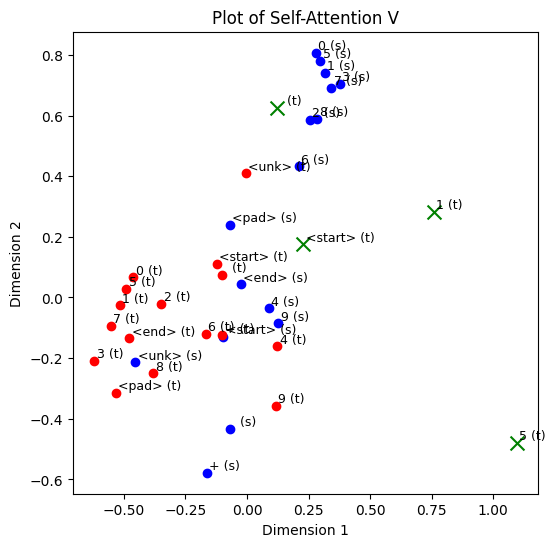

[[[ 0.26740915  0.23627405  0.28286752  0.21129571]
  [ 0.9734609  -0.30160418 -0.49042332 -1.3960608 ]
  [ 0.93973416 -0.2616853  -0.47725934 -1.3555375 ]
  [ 0.9856134  -0.3190347  -0.5038662  -1.420129  ]]]
(1, 4, 4)
[[ 0.26740915  0.23627405]
 [ 0.9734609  -0.30160418]
 [ 0.93973416 -0.2616853 ]
 [ 0.9856134  -0.3190347 ]]


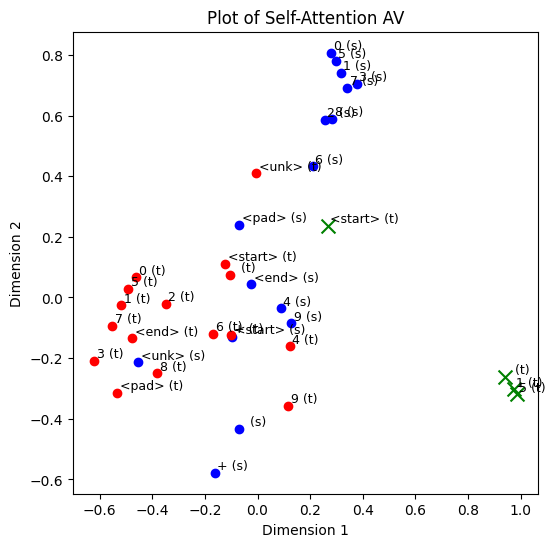

[[[ 0.38093948 -0.16547681  0.126569    0.14308193]]

 [[-0.45492655  2.2696252  -0.5371922   0.08972806]]

 [[-0.42047715  2.2073512  -0.55040574  0.08479611]]

 [[-0.47505438  2.3082614  -0.5405102   0.08723726]]]
(4, 1, 4)
[[ 0.38093948 -0.16547681]
 [-0.45492655  2.2696252 ]
 [-0.42047715  2.2073512 ]
 [-0.47505438  2.3082614 ]]


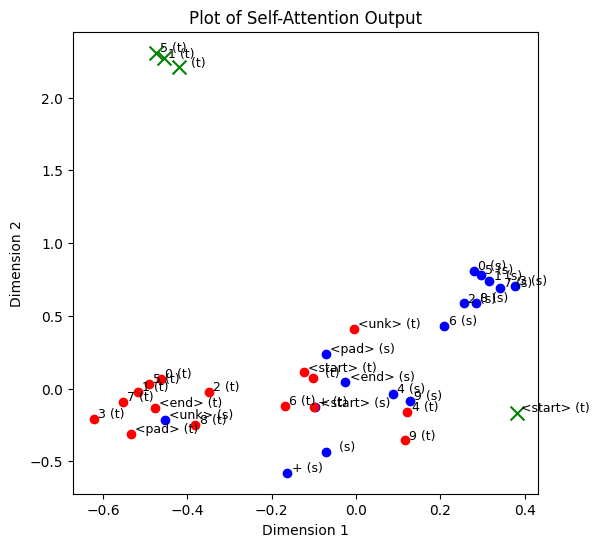

[[[-0.75540954  1.7560097   0.77733475 -1.3900119 ]]

 [[-1.0489489   1.7119021  -1.1918445   0.62521845]]

 [[-0.29702443  2.0885544  -1.0151819  -0.85350823]]

 [[-1.2272261   1.1238326  -0.9542374   1.3176852 ]]]
(4, 1, 4)
[[-0.75540954  1.7560097 ]
 [-1.0489489   1.7119021 ]
 [-0.29702443  2.0885544 ]
 [-1.2272261   1.1238326 ]]


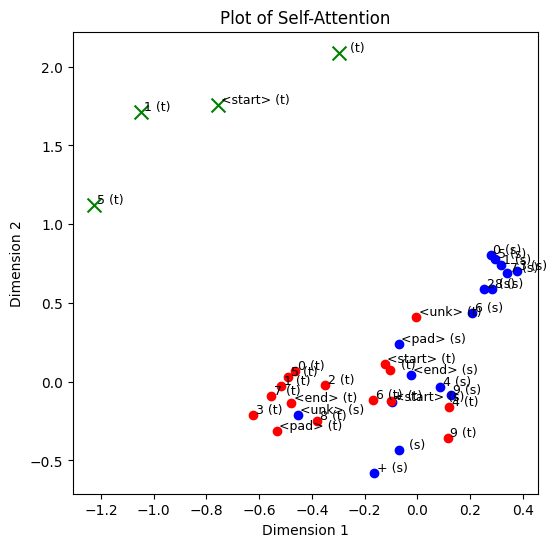

QV.shape: torch.Size([1, 4, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 4, 15])
AV.shape: torch.Size([1, 4, 4])
[[[-1.3462018   1.8024726   0.49014804 -1.3778518 ]
  [-0.86200434 -0.17127448 -2.443763   -0.01319545]
  [ 0.2959752   0.16496435 -1.4435866  -1.5116514 ]
  [-1.4211777  -0.20734665 -2.4244874   0.8494336 ]]]
(1, 4, 4)
[[-1.3462018   1.8024726 ]
 [-0.86200434 -0.17127448]
 [ 0.2959752   0.16496435]
 [-1.4211777  -0.20734665]]


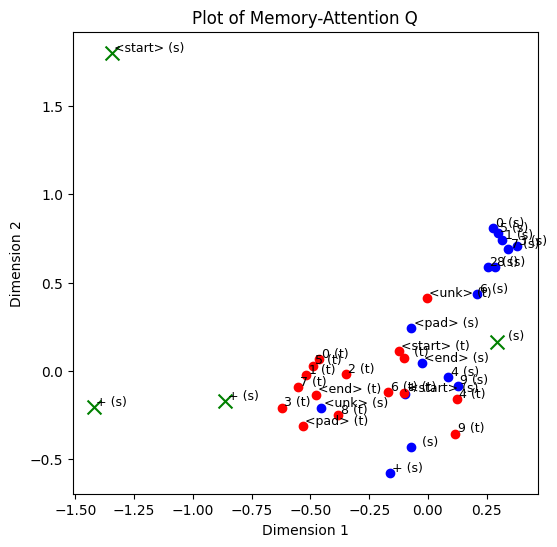

[[-2.5873542  -7.7650056  -5.898153    4.113516  ]
 [ 0.02491225 -1.2135888  -4.709598    1.5243986 ]
 [-0.47594458 -1.9969475  -5.156567    1.3736546 ]
 [-1.842775    0.50118184 -3.8816538   2.1161594 ]
 [-3.0246556  -0.64733064 -1.8812219   2.7934177 ]
 [ 0.9243954  -0.10356134  2.236121    0.4095208 ]
 [-1.419923   -2.239407   -2.2152905   2.3829184 ]
 [ 3.5096743  -1.6742307  -0.818094   -0.90171045]
 [-0.18588106 -2.2118235  -5.1941667   1.290563  ]
 [-1.3821328   0.308455   -4.3772726   1.8689482 ]
 [-2.7963638  -0.5893663  -2.3601792   2.5950441 ]
 [ 0.28278285 -0.02799085  1.6769762   0.7531041 ]
 [-1.8359957  -1.9127802  -1.7172087   2.585585  ]
 [ 3.2743897  -1.5754788  -0.25579175 -0.71645576]
 [ 1.2156768  -1.7601197  -3.9086413   0.6484872 ]]
(15, 4)
[[-2.5873542  -7.7650056 ]
 [ 0.02491225 -1.2135888 ]
 [-0.47594458 -1.9969475 ]
 [-1.842775    0.50118184]
 [-3.0246556  -0.64733064]
 [ 0.9243954  -0.10356134]
 [-1.419923   -2.239407  ]
 [ 3.5096743  -1.6742307 ]
 [-0.18588

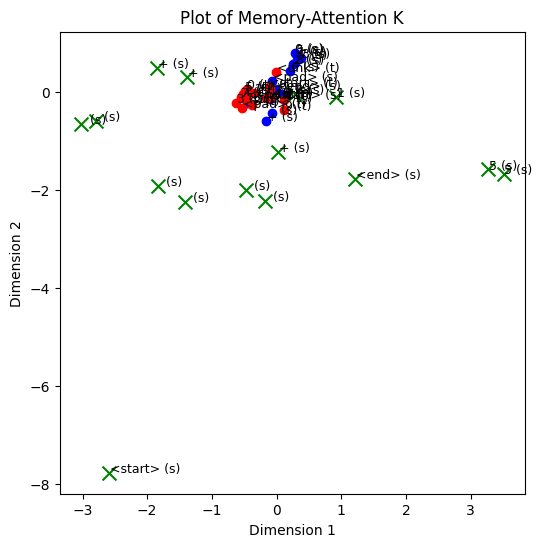

[[-4.157559   -0.22806118  1.2357246   0.5402342 ]
 [ 1.4508448   0.36097324 -1.1337703  -0.02642263]
 [ 0.05422554  0.70298916  0.3357393  -0.383374  ]
 [ 2.7505176  -0.53587735 -0.49158764 -1.1917727 ]
 [ 0.8331038  -1.1127834   0.5858201  -1.1625319 ]
 [-0.5007478   0.06357405 -0.7633241   0.786577  ]
 [-0.40591896 -0.4493605  -0.08779202 -0.03363407]
 [-1.4312079   1.8047924  -1.1555783   1.7204238 ]
 [-0.10231569  0.8126207   0.19123979 -0.19372857]
 [ 2.6538467  -0.23851366 -0.58247584 -1.0411739 ]
 [ 0.93491787 -0.902572    0.6017019  -1.18919   ]
 [-0.18725705 -0.13979931 -0.5472724   0.4329274 ]
 [-0.18144369 -0.73824126 -0.04923896 -0.20051992]
 [-1.3956933   1.5630281  -1.2213548   1.7193637 ]
 [ 0.10003449  1.0408527  -0.8392485   0.53835785]]
(15, 4)
[[-4.157559   -0.22806118]
 [ 1.4508448   0.36097324]
 [ 0.05422554  0.70298916]
 [ 2.7505176  -0.53587735]
 [ 0.8331038  -1.1127834 ]
 [-0.5007478   0.06357405]
 [-0.40591896 -0.4493605 ]
 [-1.4312079   1.8047924 ]
 [-0.10231

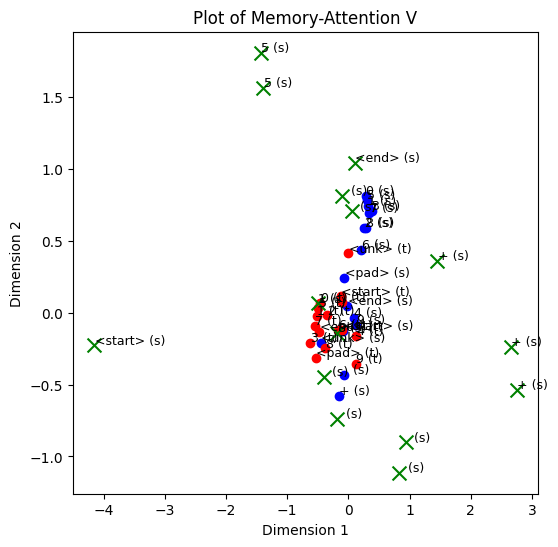

[[ 0.7233166  -0.32487875 -0.31226948 -0.27347776]
 [-2.8754807  -0.07185733  0.8849729   0.28633294]
 [ 0.26894072  0.68518555 -0.3913369   0.06872313]
 [-3.8371782  -0.20575811  1.1531011   0.47014472]]
(4, 4)
[[ 0.7233166  -0.32487875]
 [-2.8754807  -0.07185733]
 [ 0.26894072  0.68518555]
 [-3.8371782  -0.20575811]]


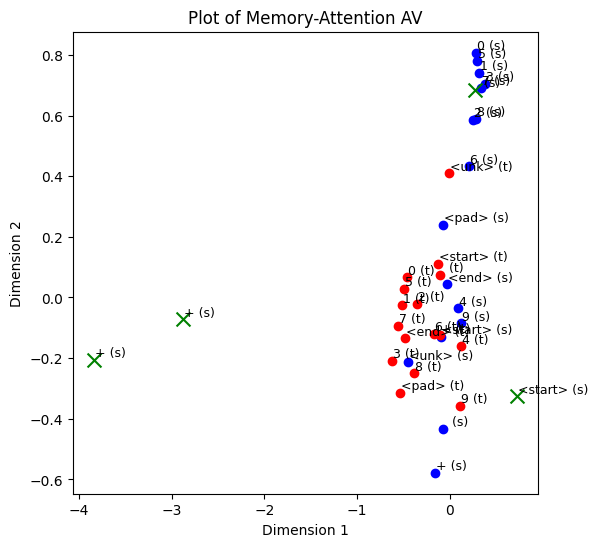

[[[ 0.38093948 -0.16547681  0.126569    0.14308193]]

 [[-0.45492655  2.2696252  -0.5371922   0.08972806]]

 [[-0.42047715  2.2073512  -0.55040574  0.08479611]]

 [[-0.47505438  2.3082614  -0.5405102   0.08723726]]]
(4, 1, 4)
[[ 0.38093948 -0.16547681]
 [-0.45492655  2.2696252 ]
 [-0.42047715  2.2073512 ]
 [-0.47505438  2.3082614 ]]


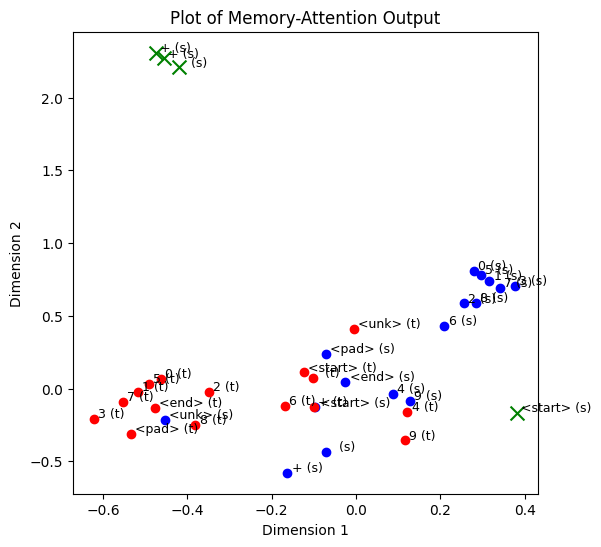

[[[-0.07359586  1.2986243   0.32194966 -1.6351552 ]]

 [[-1.6792195   1.1904784  -0.6245752   0.82894546]]

 [[-0.3332546   1.6290872  -0.51906615 -1.2038158 ]]

 [[-1.7435534   0.981124   -0.44355834  1.0431187 ]]]
(4, 1, 4)
[[-0.07359586  1.2986243 ]
 [-1.6792195   1.1904784 ]
 [-0.3332546   1.6290872 ]
 [-1.7435534   0.981124  ]]


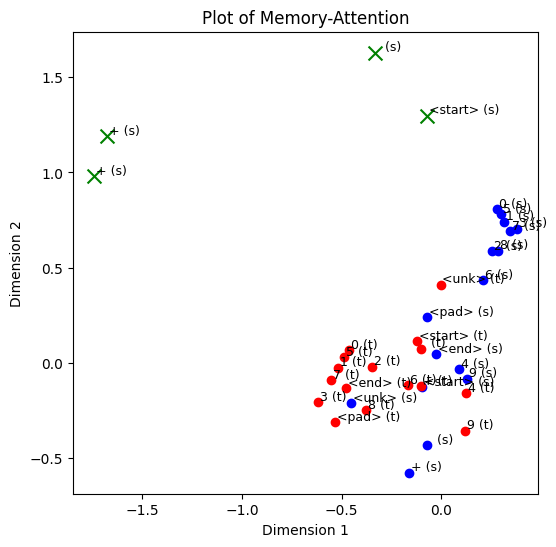

AfterLinear.shape: torch.Size([4, 1, 4])
AfterAddTGT.shape: torch.Size([4, 1, 4])
AfterAddTGT: tensor([[[ 7.7954, -5.8259, -0.4573, -2.4118]],

        [[-4.7117,  0.7522, -5.6247,  7.0216]],

        [[ 5.3233, -8.2729, -2.6366,  3.9754]],

        [[-5.0454,  1.0275, -5.4094,  6.8641]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[-43.4450, -23.4995, -27.0695,  24.9013,   6.6377, -38.1447, -11.3938,  -1.4995, -35.9334,
           6.4441,  -0.9678,  -1.0323,  -0.2743,  17.6735,  32.3600,   7.5388]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 14

------------------

iter: 4
ys: tensor([[12],
        [ 1],
        [14],
        [ 5],
        [14]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [[-0.1934,  0.4897,  0.1387,  1.6061]],

        [[ 0.7031, -0.2669,  0.4363, -0.1348]],

        [[-0.8408, -0.9311, -0.0663,  1.8630]],

        [[-0.9630, -0.5044,  0.4563

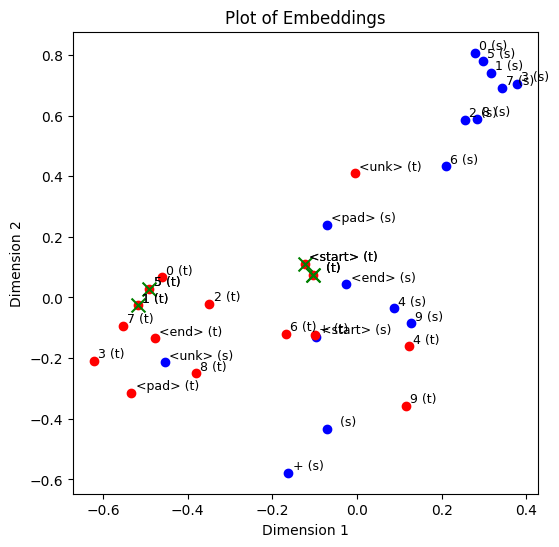

[[[-0.24789122  1.223464    0.55137694 -0.1776787 ]]

 [[-0.1934315   0.48972806  0.13874242  1.6061097 ]]

 [[ 0.7031361  -0.2668827   0.4362919  -0.1347509 ]]

 [[-0.8407894  -0.9311025  -0.0662975   1.8629564 ]]

 [[-0.9629638  -0.50437945  0.45628256 -0.13535082]]]
(5, 1, 4)
[[-0.24789122  1.223464  ]
 [-0.1934315   0.48972806]
 [ 0.7031361  -0.2668827 ]
 [-0.8407894  -0.9311025 ]
 [-0.9629638  -0.50437945]]


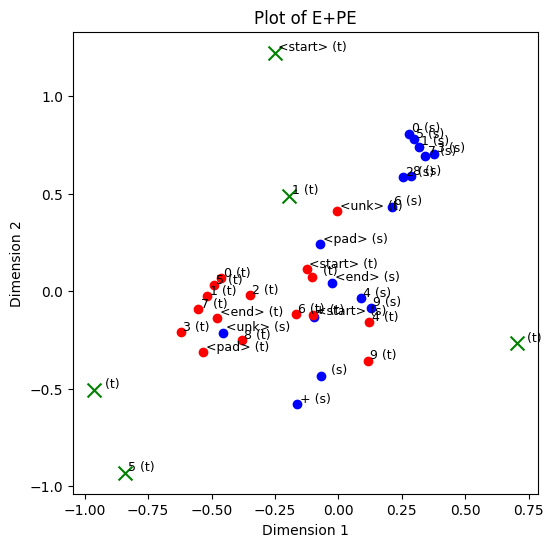

SelfAttention Layer
QV.shape: torch.Size([1, 5, 4])
KV.shape: torch.Size([1, 5, 4])
WV.shape: torch.Size([1, 5, 4])
attn_weight.shape: torch.Size([1, 5, 5])
AV.shape: torch.Size([1, 5, 4])
[[[ 1.6710228   0.86309004  0.24995238 -0.27111757]
  [-0.5829186   0.16324538 -0.7912906   1.0486854 ]
  [-0.30402273 -0.64216936 -0.7364837   0.40141028]
  [-1.2785212   0.3870846  -0.57777995  0.9510717 ]
  [ 1.0569528   1.1295671   0.55142087 -0.546205  ]]]
(1, 5, 4)
[[ 1.6710228   0.86309004]
 [-0.5829186   0.16324538]
 [-0.30402273 -0.64216936]
 [-1.2785212   0.3870846 ]
 [ 1.0569528   1.1295671 ]]


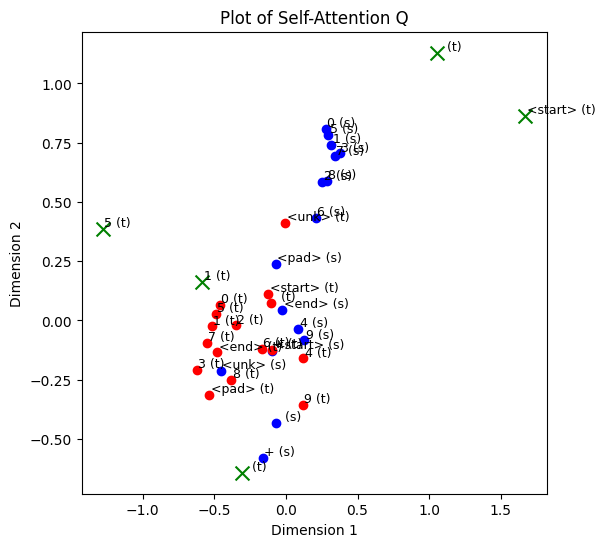

[[[ 1.4933789   1.5820361   0.46946707 -0.9740776 ]
  [ 0.06870762  0.04826249 -0.56696486  0.6129863 ]
  [ 0.14256531  0.18516839 -0.01008819 -0.38967878]
  [-1.6470414  -1.7903842  -1.9260877   2.440474  ]
  [-0.41122705 -0.48842144 -1.1186817   1.0450444 ]]]
(1, 5, 4)
[[ 1.4933789   1.5820361 ]
 [ 0.06870762  0.04826249]
 [ 0.14256531  0.18516839]
 [-1.6470414  -1.7903842 ]
 [-0.41122705 -0.48842144]]


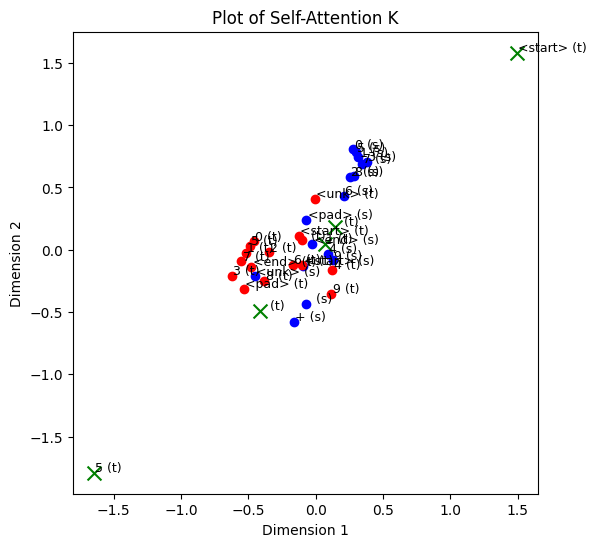

[[[ 0.22888592  0.17663535  0.4518405   0.49838567]
  [ 0.75891817  0.28342536 -0.12693013 -0.9412274 ]
  [ 0.12037133  0.6260945  -0.47412893 -0.7289601 ]
  [ 1.0959395  -0.47901723 -0.58115566 -1.5819137 ]
  [ 0.60003024 -0.6870174  -0.07659452 -0.21349032]]]
(1, 5, 4)
[[ 0.22888592  0.17663535]
 [ 0.75891817  0.28342536]
 [ 0.12037133  0.6260945 ]
 [ 1.0959395  -0.47901723]
 [ 0.60003024 -0.6870174 ]]


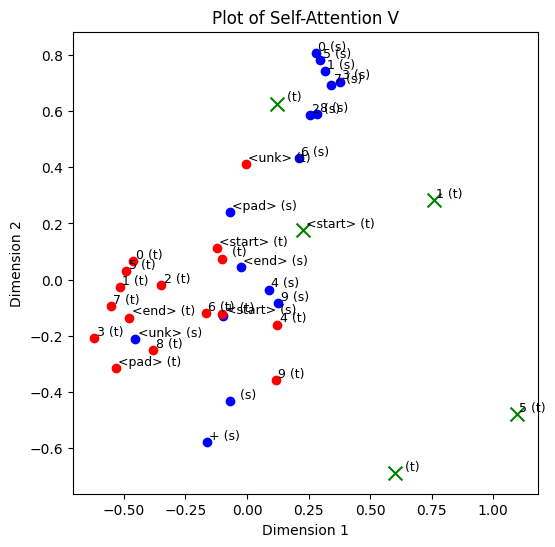

[[[ 0.280456    0.20005852  0.26876783  0.1946337 ]
  [ 0.90759015 -0.36958855 -0.41742656 -1.1874629 ]
  [ 0.8763904  -0.34099603 -0.40254834 -1.1425827 ]
  [ 0.92308086 -0.3787128  -0.43457282 -1.2244406 ]
  [ 0.26990673  0.2107972   0.27026397  0.20471276]]]
(1, 5, 4)
[[ 0.280456    0.20005852]
 [ 0.90759015 -0.36958855]
 [ 0.8763904  -0.34099603]
 [ 0.92308086 -0.3787128 ]
 [ 0.26990673  0.2107972 ]]


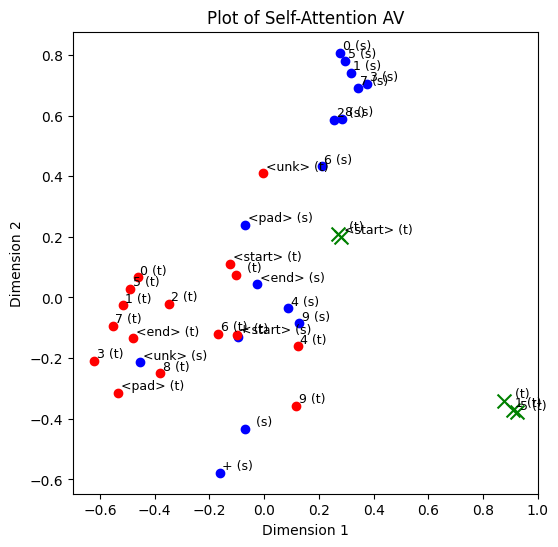

[[[ 0.34747162 -0.13300146  0.14123707  0.13710079]]

 [[-0.45799154  1.9861315  -0.3541461   0.07224178]]

 [[-0.43014097  1.919279   -0.35444167  0.06723081]]

 [[-0.47460815  2.041351   -0.37167925  0.07156434]]

 [[ 0.35534155 -0.14782597  0.1354959   0.13415453]]]
(5, 1, 4)
[[ 0.34747162 -0.13300146]
 [-0.45799154  1.9861315 ]
 [-0.43014097  1.919279  ]
 [-0.47460815  2.041351  ]
 [ 0.35534155 -0.14782597]]


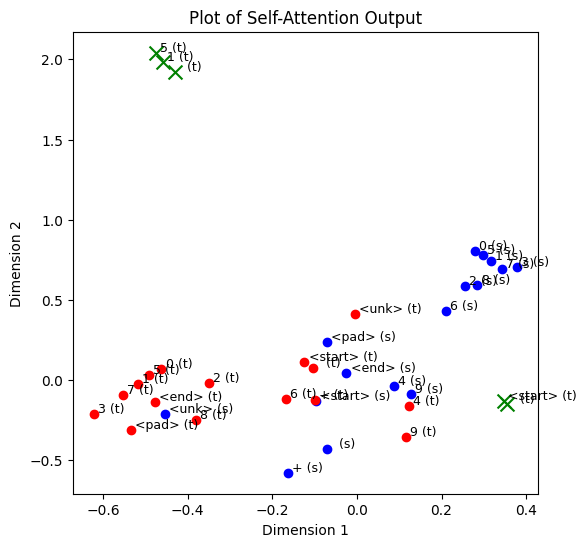

[[[-0.7970961   1.7590787   0.7837986  -1.3487469 ]]

 [[-1.1333865   1.6521999  -1.0850888   0.7075444 ]]

 [[-0.32828295  2.0897398  -0.7826913  -1.0076646 ]]

 [[-1.2794217   0.9803264  -0.7956935   1.4147749 ]]

 [[-0.8702086  -0.62602884  2.1896732   0.31711483]]]
(5, 1, 4)
[[-0.7970961   1.7590787 ]
 [-1.1333865   1.6521999 ]
 [-0.32828295  2.0897398 ]
 [-1.2794217   0.9803264 ]
 [-0.8702086  -0.62602884]]


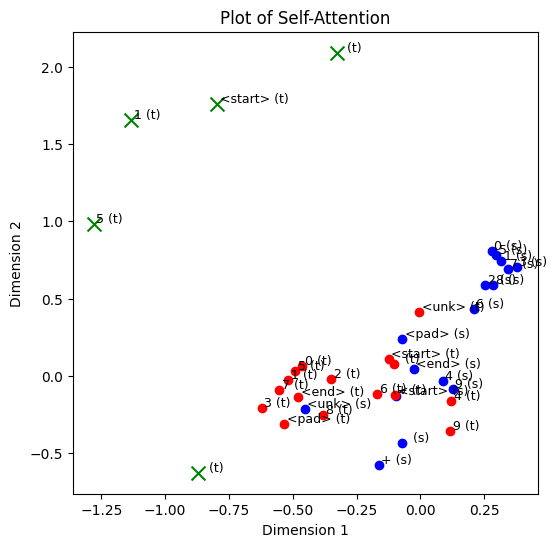

QV.shape: torch.Size([1, 5, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 5, 15])
AV.shape: torch.Size([1, 5, 4])
[[[-1.4108671   1.8112687   0.46250287 -1.3333863 ]
  [-1.0576186  -0.0912433  -2.3891978   0.11669851]
  [ 0.1387306   0.39756042 -1.156883   -1.5861393 ]
  [-1.6185589  -0.11589071 -2.291597    1.0224125 ]
  [-2.9146078   2.0906086   1.7172718   1.149848  ]]]
(1, 5, 4)
[[-1.4108671   1.8112687 ]
 [-1.0576186  -0.0912433 ]
 [ 0.1387306   0.39756042]
 [-1.6185589  -0.11589071]
 [-2.9146078   2.0906086 ]]


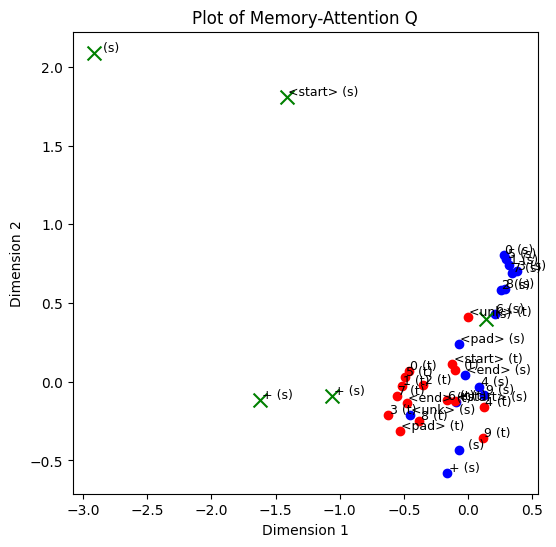

[[-2.5873542  -7.7650056  -5.898153    4.113516  ]
 [ 0.02491225 -1.2135888  -4.709598    1.5243986 ]
 [-0.47594458 -1.9969475  -5.156567    1.3736546 ]
 [-1.842775    0.50118184 -3.8816538   2.1161594 ]
 [-3.0246556  -0.64733064 -1.8812219   2.7934177 ]
 [ 0.9243954  -0.10356134  2.236121    0.4095208 ]
 [-1.419923   -2.239407   -2.2152905   2.3829184 ]
 [ 3.5096743  -1.6742307  -0.818094   -0.90171045]
 [-0.18588106 -2.2118235  -5.1941667   1.290563  ]
 [-1.3821328   0.308455   -4.3772726   1.8689482 ]
 [-2.7963638  -0.5893663  -2.3601792   2.5950441 ]
 [ 0.28278285 -0.02799085  1.6769762   0.7531041 ]
 [-1.8359957  -1.9127802  -1.7172087   2.585585  ]
 [ 3.2743897  -1.5754788  -0.25579175 -0.71645576]
 [ 1.2156768  -1.7601197  -3.9086413   0.6484872 ]]
(15, 4)
[[-2.5873542  -7.7650056 ]
 [ 0.02491225 -1.2135888 ]
 [-0.47594458 -1.9969475 ]
 [-1.842775    0.50118184]
 [-3.0246556  -0.64733064]
 [ 0.9243954  -0.10356134]
 [-1.419923   -2.239407  ]
 [ 3.5096743  -1.6742307 ]
 [-0.18588

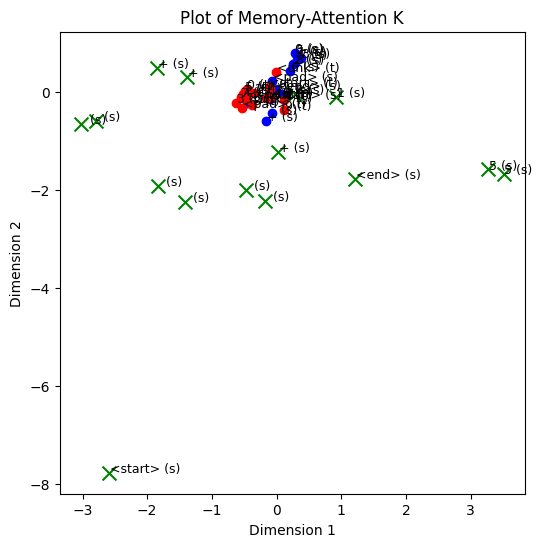

[[-4.157559   -0.22806118  1.2357246   0.5402342 ]
 [ 1.4508448   0.36097324 -1.1337703  -0.02642263]
 [ 0.05422554  0.70298916  0.3357393  -0.383374  ]
 [ 2.7505176  -0.53587735 -0.49158764 -1.1917727 ]
 [ 0.8331038  -1.1127834   0.5858201  -1.1625319 ]
 [-0.5007478   0.06357405 -0.7633241   0.786577  ]
 [-0.40591896 -0.4493605  -0.08779202 -0.03363407]
 [-1.4312079   1.8047924  -1.1555783   1.7204238 ]
 [-0.10231569  0.8126207   0.19123979 -0.19372857]
 [ 2.6538467  -0.23851366 -0.58247584 -1.0411739 ]
 [ 0.93491787 -0.902572    0.6017019  -1.18919   ]
 [-0.18725705 -0.13979931 -0.5472724   0.4329274 ]
 [-0.18144369 -0.73824126 -0.04923896 -0.20051992]
 [-1.3956933   1.5630281  -1.2213548   1.7193637 ]
 [ 0.10003449  1.0408527  -0.8392485   0.53835785]]
(15, 4)
[[-4.157559   -0.22806118]
 [ 1.4508448   0.36097324]
 [ 0.05422554  0.70298916]
 [ 2.7505176  -0.53587735]
 [ 0.8331038  -1.1127834 ]
 [-0.5007478   0.06357405]
 [-0.40591896 -0.4493605 ]
 [-1.4312079   1.8047924 ]
 [-0.10231

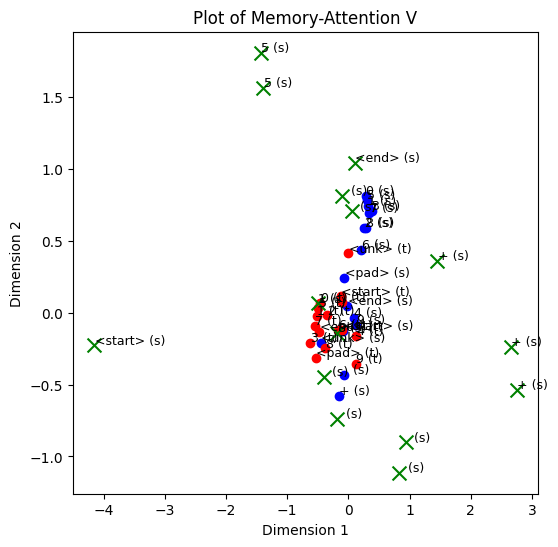

[[ 0.8240894  -0.36691162 -0.2733463  -0.3629203 ]
 [-2.8962538  -0.10011895  0.89627975  0.28137004]
 [ 0.35288662  0.65976465 -0.4758841   0.10025451]
 [-3.8051882  -0.21434598  1.1476189   0.45927492]
 [ 0.82430786 -0.92224985  0.40890157 -0.9889581 ]]
(5, 4)
[[ 0.8240894  -0.36691162]
 [-2.8962538  -0.10011895]
 [ 0.35288662  0.65976465]
 [-3.8051882  -0.21434598]
 [ 0.82430786 -0.92224985]]


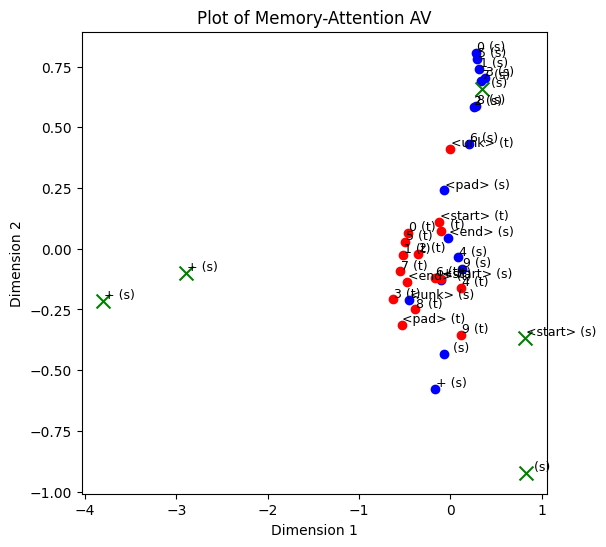

[[[ 0.34747162 -0.13300146  0.14123707  0.13710079]]

 [[-0.45799154  1.9861315  -0.3541461   0.07224178]]

 [[-0.43014097  1.919279   -0.35444167  0.06723081]]

 [[-0.47460815  2.041351   -0.37167925  0.07156434]]

 [[ 0.35534155 -0.14782597  0.1354959   0.13415453]]]
(5, 1, 4)
[[ 0.34747162 -0.13300146]
 [-0.45799154  1.9861315 ]
 [-0.43014097  1.919279  ]
 [-0.47460815  2.041351  ]
 [ 0.35534155 -0.14782597]]


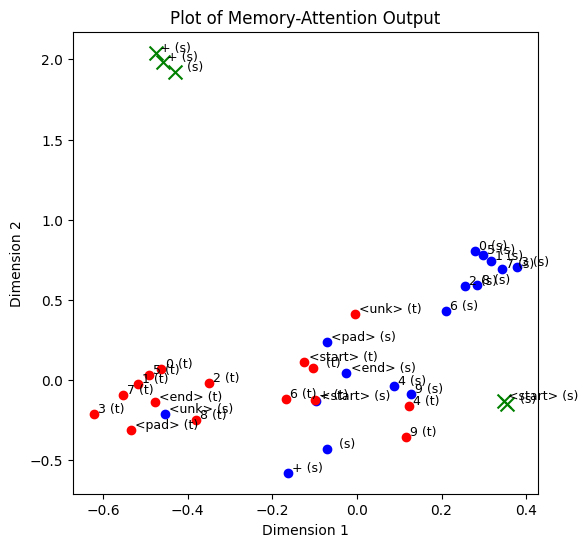

[[[-0.03657317  1.3181982   0.22425164 -1.628351  ]]

 [[-1.6969279   1.165851   -0.5814579   0.8486866 ]]

 [[-0.23962694  1.5301234  -0.20090847 -1.3970913 ]]

 [[-1.756358    0.9456     -0.39000776  1.0648708 ]]

 [[-0.6796136   0.05568764  2.3090827  -0.79521143]]]
(5, 1, 4)
[[-0.03657317  1.3181982 ]
 [-1.6969279   1.165851  ]
 [-0.23962694  1.5301234 ]
 [-1.756358    0.9456    ]
 [-0.6796136   0.05568764]]


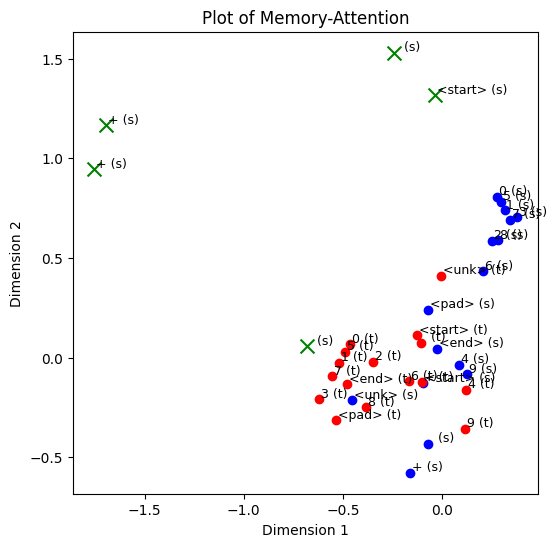

AfterLinear.shape: torch.Size([5, 1, 4])
AfterAddTGT.shape: torch.Size([5, 1, 4])
AfterAddTGT: tensor([[[ 7.8162, -6.0813, -0.6054, -2.0597]],

        [[-4.7909,  0.8227, -5.5778,  6.9832]],

        [[ 6.6184, -8.2186, -1.3122,  1.6077]],

        [[-5.1242,  1.0944, -5.3557,  6.8227]],

        [[-1.0318, -8.7101,  2.8421,  5.0274]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[-16.3793, -21.7807,   2.1547, -12.0871,   5.5271, -21.5394,   6.6605, -16.7508,  -5.4194,
           6.2909,  -6.4608,  -5.2535,  -8.8798,   8.8486,   0.4834,  27.4471]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 15

------------------

iter: 5
ys: tensor([[12],
        [ 1],
        [14],
        [ 5],
        [14],
        [15]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [[-0.1934,  0.4897,  0.1387,  1.6061]],

        [[ 0.7031, -0.2669,  0.4363, -0.1348]],

        [[-0.8408, -0

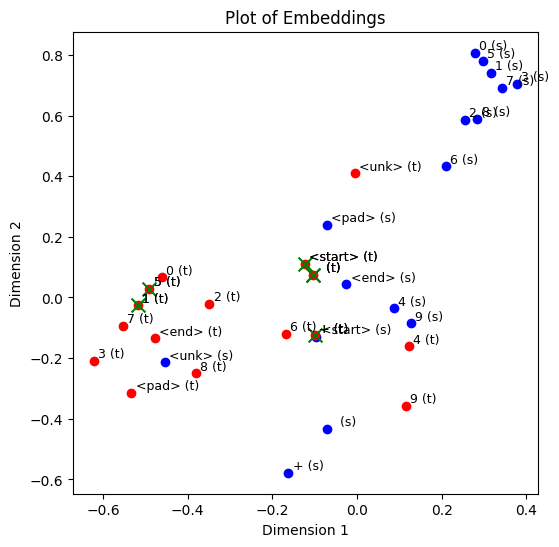

[[[-0.24789122  1.223464    0.55137694 -0.1776787 ]]

 [[-0.1934315   0.48972806  0.13874242  1.6061097 ]]

 [[ 0.7031361  -0.2668827   0.4362919  -0.1347509 ]]

 [[-0.8407894  -0.9311025  -0.0662975   1.8629564 ]]

 [[-0.9629638  -0.50437945  0.45628256 -0.13535082]]

 [[-1.1592597   0.0356656  -0.29029036  0.24739105]]]
(6, 1, 4)
[[-0.24789122  1.223464  ]
 [-0.1934315   0.48972806]
 [ 0.7031361  -0.2668827 ]
 [-0.8407894  -0.9311025 ]
 [-0.9629638  -0.50437945]
 [-1.1592597   0.0356656 ]]


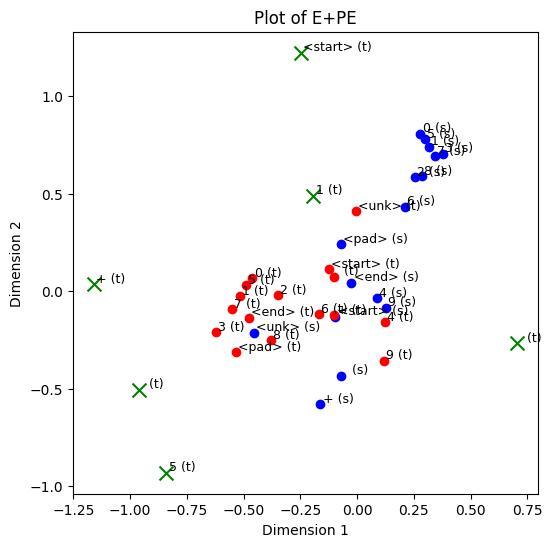

SelfAttention Layer
QV.shape: torch.Size([1, 6, 4])
KV.shape: torch.Size([1, 6, 4])
WV.shape: torch.Size([1, 6, 4])
attn_weight.shape: torch.Size([1, 6, 6])
AV.shape: torch.Size([1, 6, 4])
[[[ 1.6710228   0.86309004  0.24995238 -0.27111757]
  [-0.5829186   0.16324538 -0.7912906   1.0486854 ]
  [-0.30402273 -0.64216936 -0.7364837   0.40141028]
  [-1.2785212   0.3870846  -0.57777995  0.9510717 ]
  [ 1.0569528   1.1295671   0.55142087 -0.546205  ]
  [ 0.95438915  1.3444736   0.84715956 -0.35651731]]]
(1, 6, 4)
[[ 1.6710228   0.86309004]
 [-0.5829186   0.16324538]
 [-0.30402273 -0.64216936]
 [-1.2785212   0.3870846 ]
 [ 1.0569528   1.1295671 ]
 [ 0.95438915  1.3444736 ]]


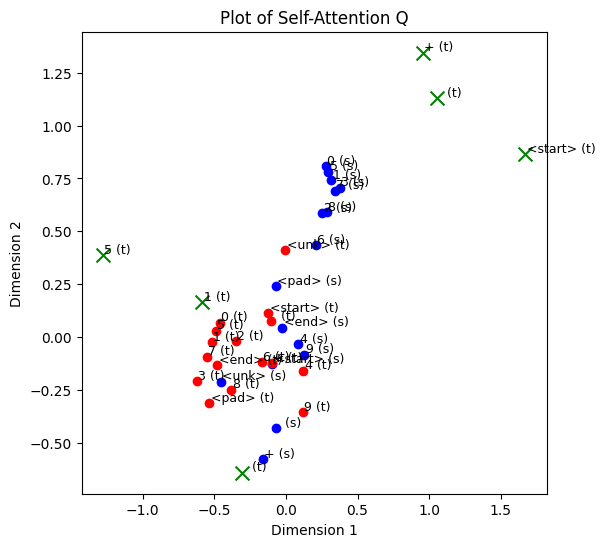

[[[ 1.4933789   1.5820361   0.46946707 -0.9740776 ]
  [ 0.06870762  0.04826249 -0.56696486  0.6129863 ]
  [ 0.14256531  0.18516839 -0.01008819 -0.38967878]
  [-1.6470414  -1.7903842  -1.9260877   2.440474  ]
  [-0.41122705 -0.48842144 -1.1186817   1.0450444 ]
  [-0.497376   -0.35002643 -0.5451736   0.93166566]]]
(1, 6, 4)
[[ 1.4933789   1.5820361 ]
 [ 0.06870762  0.04826249]
 [ 0.14256531  0.18516839]
 [-1.6470414  -1.7903842 ]
 [-0.41122705 -0.48842144]
 [-0.497376   -0.35002643]]


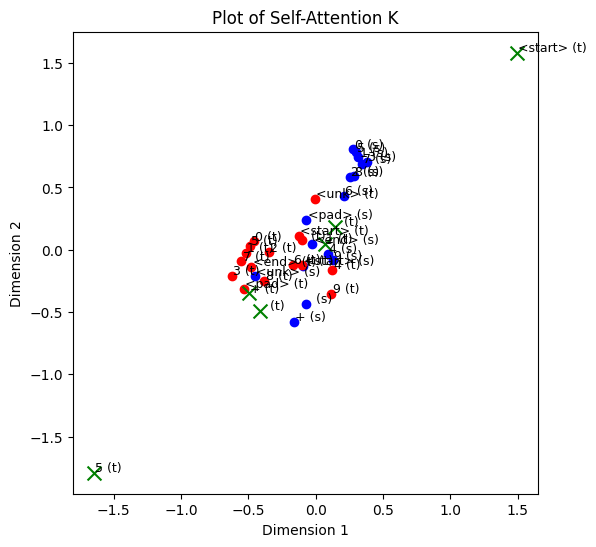

[[[ 0.22888592  0.17663535  0.4518405   0.49838567]
  [ 0.75891817  0.28342536 -0.12693013 -0.9412274 ]
  [ 0.12037133  0.6260945  -0.47412893 -0.7289601 ]
  [ 1.0959395  -0.47901723 -0.58115566 -1.5819137 ]
  [ 0.60003024 -0.6870174  -0.07659452 -0.21349032]
  [ 0.3312436  -0.9682738   0.10430816  0.35166842]]]
(1, 6, 4)
[[ 0.22888592  0.17663535]
 [ 0.75891817  0.28342536]
 [ 0.12037133  0.6260945 ]
 [ 1.0959395  -0.47901723]
 [ 0.60003024 -0.6870174 ]
 [ 0.3312436  -0.9682738 ]]


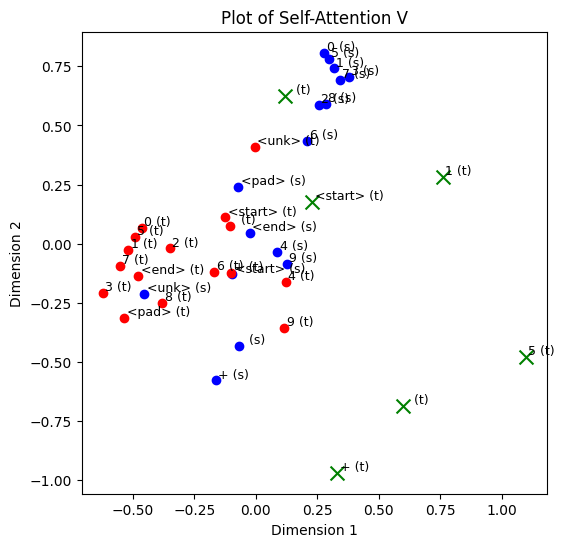

[[[ 0.28251573  0.15267551  0.262098    0.20100243]
  [ 0.8379743  -0.4419027  -0.3544072  -1.0015541 ]
  [ 0.80817986 -0.41948304 -0.3391288  -0.95561713]
  [ 0.8498039  -0.45170796 -0.3678525  -1.0292983 ]
  [ 0.27227694  0.16523483  0.26385102  0.21039152]
  [ 0.26831502  0.16717596  0.27778053  0.2320192 ]]]
(1, 6, 4)
[[ 0.28251573  0.15267551]
 [ 0.8379743  -0.4419027 ]
 [ 0.80817986 -0.41948304]
 [ 0.8498039  -0.45170796]
 [ 0.27227694  0.16523483]
 [ 0.26831502  0.16717596]]


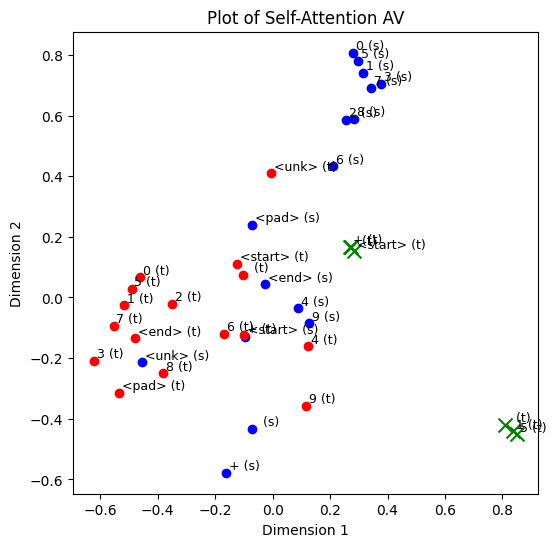

[[[ 0.3102415  -0.13208099  0.17954245  0.12787545]]

 [[-0.4715835   1.732907   -0.18022478  0.05260018]]

 [[-0.44770542  1.665331   -0.17424136  0.04751127]]

 [[-0.48648304  1.774949   -0.19123217  0.05151478]]

 [[ 0.31956396 -0.14637606  0.17221583  0.1254783 ]]

 [[ 0.32969657 -0.17995714  0.18935363  0.1296224 ]]]
(6, 1, 4)
[[ 0.3102415  -0.13208099]
 [-0.4715835   1.732907  ]
 [-0.44770542  1.665331  ]
 [-0.48648304  1.774949  ]
 [ 0.31956396 -0.14637606]
 [ 0.32969657 -0.17995714]]


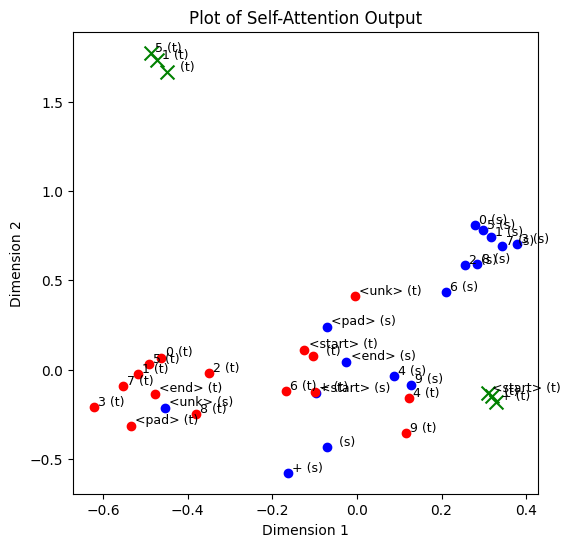

[[[-0.84465283  1.7182637   0.8811119  -1.3245982 ]]

 [[-1.2249765   1.5801927  -0.9486187   0.78821254]]

 [[-0.37671536  2.0605285  -0.43849534 -1.197868  ]]

 [[-1.3297708   0.81296223 -0.5921112   1.5000719 ]]

 [[-0.9002193  -0.5821329   2.2097535   0.28649378]]

 [[-1.5094093   0.42014214  0.30147636  1.4337059 ]]]
(6, 1, 4)
[[-0.84465283  1.7182637 ]
 [-1.2249765   1.5801927 ]
 [-0.37671536  2.0605285 ]
 [-1.3297708   0.81296223]
 [-0.9002193  -0.5821329 ]
 [-1.5094093   0.42014214]]


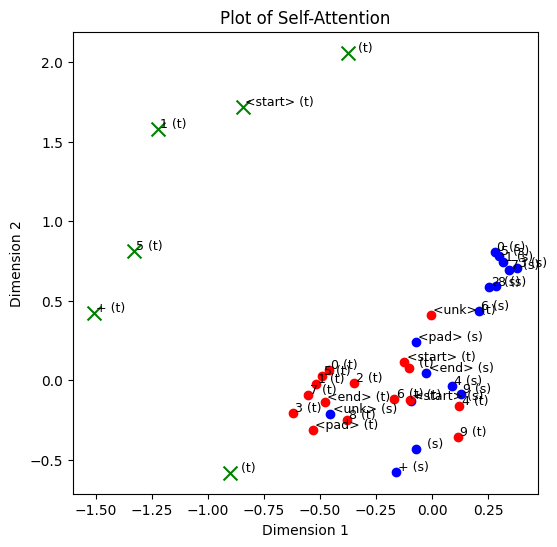

QV.shape: torch.Size([1, 6, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 6, 15])
AV.shape: torch.Size([1, 6, 4])
[[[-1.5409349   1.8899678   0.5417503  -1.2688295 ]
  [-1.2818494   0.01272984 -2.3038323   0.25699514]
  [-0.10670476  0.7274028  -0.741882   -1.6539245 ]
  [-1.8418682   0.00912575 -2.1019893   1.2021779 ]
  [-2.9558449   2.131889    1.7283669   1.1208383 ]
  [-2.6561854   0.7176267  -1.1497264   1.5005027 ]]]
(1, 6, 4)
[[-1.5409349   1.8899678 ]
 [-1.2818494   0.01272984]
 [-0.10670476  0.7274028 ]
 [-1.8418682   0.00912575]
 [-2.9558449   2.131889  ]
 [-2.6561854   0.7176267 ]]


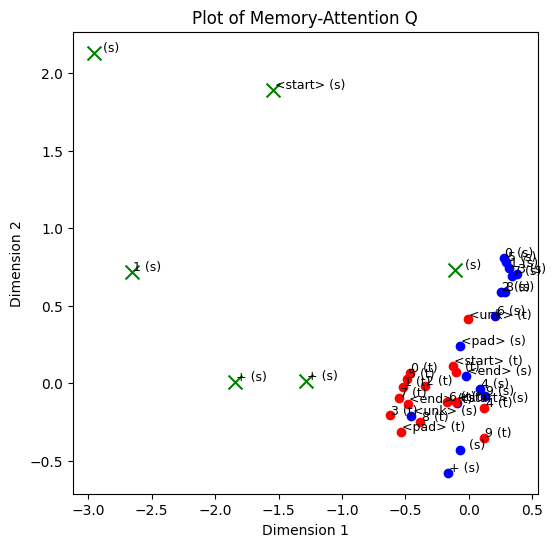

[[-2.5873542  -7.7650056  -5.898153    4.113516  ]
 [ 0.02491225 -1.2135888  -4.709598    1.5243986 ]
 [-0.47594458 -1.9969475  -5.156567    1.3736546 ]
 [-1.842775    0.50118184 -3.8816538   2.1161594 ]
 [-3.0246556  -0.64733064 -1.8812219   2.7934177 ]
 [ 0.9243954  -0.10356134  2.236121    0.4095208 ]
 [-1.419923   -2.239407   -2.2152905   2.3829184 ]
 [ 3.5096743  -1.6742307  -0.818094   -0.90171045]
 [-0.18588106 -2.2118235  -5.1941667   1.290563  ]
 [-1.3821328   0.308455   -4.3772726   1.8689482 ]
 [-2.7963638  -0.5893663  -2.3601792   2.5950441 ]
 [ 0.28278285 -0.02799085  1.6769762   0.7531041 ]
 [-1.8359957  -1.9127802  -1.7172087   2.585585  ]
 [ 3.2743897  -1.5754788  -0.25579175 -0.71645576]
 [ 1.2156768  -1.7601197  -3.9086413   0.6484872 ]]
(15, 4)
[[-2.5873542  -7.7650056 ]
 [ 0.02491225 -1.2135888 ]
 [-0.47594458 -1.9969475 ]
 [-1.842775    0.50118184]
 [-3.0246556  -0.64733064]
 [ 0.9243954  -0.10356134]
 [-1.419923   -2.239407  ]
 [ 3.5096743  -1.6742307 ]
 [-0.18588

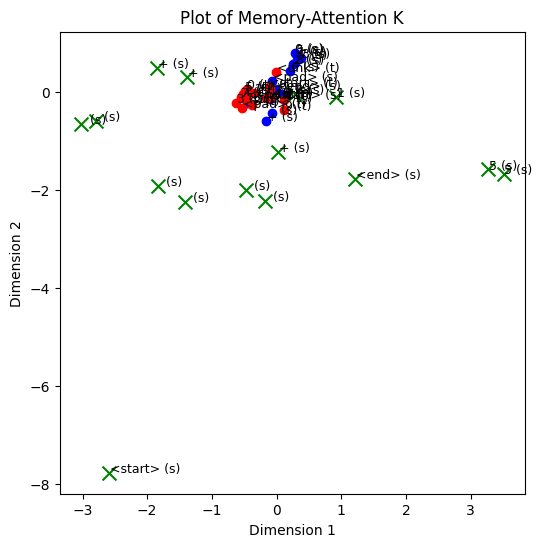

[[-4.157559   -0.22806118  1.2357246   0.5402342 ]
 [ 1.4508448   0.36097324 -1.1337703  -0.02642263]
 [ 0.05422554  0.70298916  0.3357393  -0.383374  ]
 [ 2.7505176  -0.53587735 -0.49158764 -1.1917727 ]
 [ 0.8331038  -1.1127834   0.5858201  -1.1625319 ]
 [-0.5007478   0.06357405 -0.7633241   0.786577  ]
 [-0.40591896 -0.4493605  -0.08779202 -0.03363407]
 [-1.4312079   1.8047924  -1.1555783   1.7204238 ]
 [-0.10231569  0.8126207   0.19123979 -0.19372857]
 [ 2.6538467  -0.23851366 -0.58247584 -1.0411739 ]
 [ 0.93491787 -0.902572    0.6017019  -1.18919   ]
 [-0.18725705 -0.13979931 -0.5472724   0.4329274 ]
 [-0.18144369 -0.73824126 -0.04923896 -0.20051992]
 [-1.3956933   1.5630281  -1.2213548   1.7193637 ]
 [ 0.10003449  1.0408527  -0.8392485   0.53835785]]
(15, 4)
[[-4.157559   -0.22806118]
 [ 1.4508448   0.36097324]
 [ 0.05422554  0.70298916]
 [ 2.7505176  -0.53587735]
 [ 0.8331038  -1.1127834 ]
 [-0.5007478   0.06357405]
 [-0.40591896 -0.4493605 ]
 [-1.4312079   1.8047924 ]
 [-0.10231

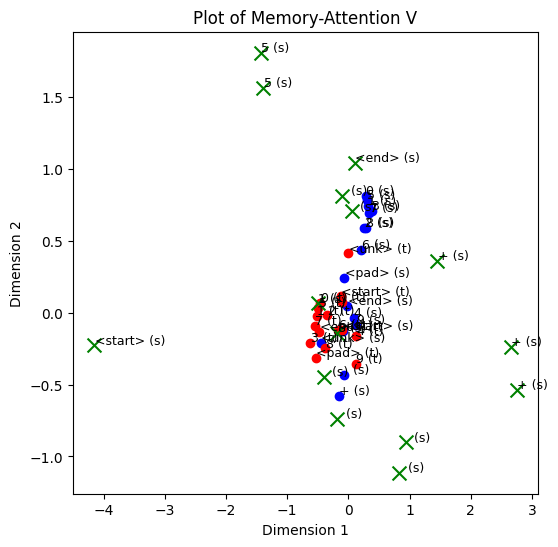

[[ 0.83007866 -0.4089427  -0.23705961 -0.39941284]
 [-2.8192954  -0.12813577  0.8835944   0.25299022]
 [ 0.44896507  0.54939413 -0.54964364  0.11097637]
 [-3.6874352  -0.22710201  1.1235735   0.42550722]
 [ 0.82636863 -0.92346746  0.41048616 -0.99127144]
 [-0.17580454 -0.61124027  0.4837288  -0.62548   ]]
(6, 4)
[[ 0.83007866 -0.4089427 ]
 [-2.8192954  -0.12813577]
 [ 0.44896507  0.54939413]
 [-3.6874352  -0.22710201]
 [ 0.82636863 -0.92346746]
 [-0.17580454 -0.61124027]]


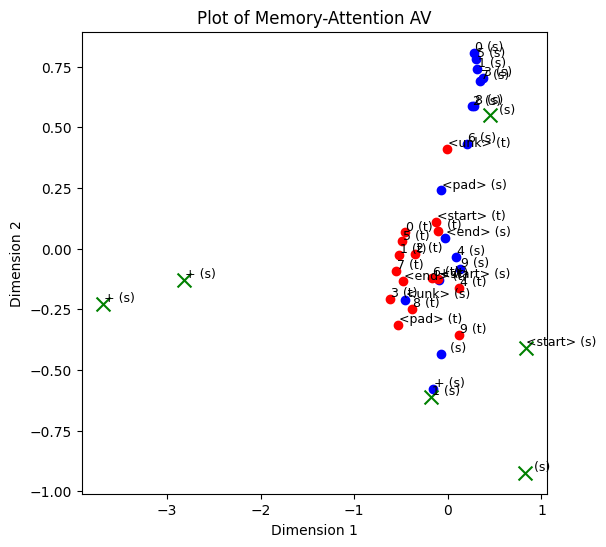

[[[ 0.3102415  -0.13208099  0.17954245  0.12787545]]

 [[-0.4715835   1.732907   -0.18022478  0.05260018]]

 [[-0.44770542  1.665331   -0.17424136  0.04751127]]

 [[-0.48648304  1.774949   -0.19123217  0.05151478]]

 [[ 0.31956396 -0.14637606  0.17221583  0.1254783 ]]

 [[ 0.32969657 -0.17995714  0.18935363  0.1296224 ]]]
(6, 1, 4)
[[ 0.3102415  -0.13208099]
 [-0.4715835   1.732907  ]
 [-0.44770542  1.665331  ]
 [-0.48648304  1.774949  ]
 [ 0.31956396 -0.14637606]
 [ 0.32969657 -0.17995714]]


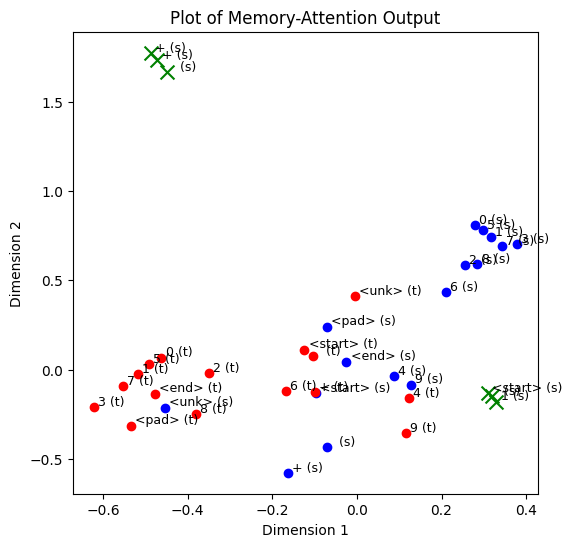

[[[-0.07424548  1.3223563   0.25913674 -1.620762  ]]

 [[-1.7122955   1.1449741  -0.5410035   0.862961  ]]

 [[-0.13242756  1.3946109   0.1230854  -1.559606  ]]

 [[-1.7693654   0.907298   -0.32903525  1.0851722 ]]

 [[-0.73119473  0.14578368  2.2850144  -0.8455786 ]]

 [[-1.6175904   1.0055408  -0.79527867  1.136564  ]]]
(6, 1, 4)
[[-0.07424548  1.3223563 ]
 [-1.7122955   1.1449741 ]
 [-0.13242756  1.3946109 ]
 [-1.7693654   0.907298  ]
 [-0.73119473  0.14578368]
 [-1.6175904   1.0055408 ]]


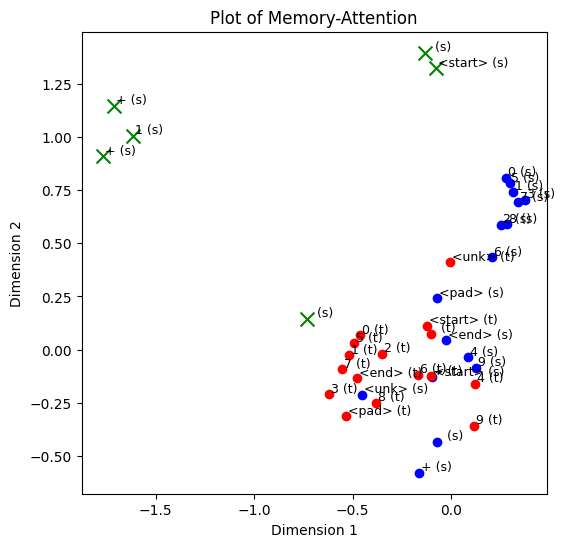

AfterLinear.shape: torch.Size([6, 1, 4])
AfterAddTGT.shape: torch.Size([6, 1, 4])
AfterAddTGT: tensor([[[ 7.7990, -6.0884, -0.5577, -2.0808]],

        [[-4.8612,  0.8854, -5.5351,  6.9480]],

        [[ 7.6598, -6.8594, -0.7826, -1.0405]],

        [[-5.2099,  1.1671, -5.2957,  6.7763]],

        [[-3.9933, -6.9968,  3.1741,  5.7233]],

        [[-4.5063,  0.5213, -5.7193,  7.1416]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[-44.6429, -26.2164, -25.7141,  23.0306,  10.1273, -40.3616,  -8.8587,  -4.0444, -35.8797,
           9.8513,  -0.6313,  -1.0049,   0.1513,  20.7267,  32.1065,   8.1584]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 14

------------------

iter: 6
ys: tensor([[12],
        [ 1],
        [14],
        [ 5],
        [14],
        [15],
        [14]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.1777]],

        [[-0.1934,  0.4897,  0.1387,  1.6061]],

       

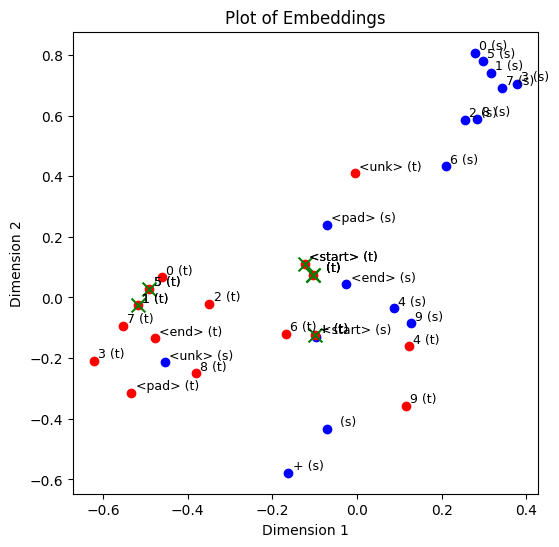

[[[-0.24789122  1.223464    0.55137694 -0.1776787 ]]

 [[-0.1934315   0.48972806  0.13874242  1.6061097 ]]

 [[ 0.7031361  -0.2668827   0.4362919  -0.1347509 ]]

 [[-0.8407894  -0.9311025  -0.0662975   1.8629564 ]]

 [[-0.9629638  -0.50437945  0.45628256 -0.13535082]]

 [[-1.1592597   0.0356656  -0.29029036  0.24739105]]

 [[-0.4855768   1.1094344   0.47625723 -0.1363504 ]]]
(7, 1, 4)
[[-0.24789122  1.223464  ]
 [-0.1934315   0.48972806]
 [ 0.7031361  -0.2668827 ]
 [-0.8407894  -0.9311025 ]
 [-0.9629638  -0.50437945]
 [-1.1592597   0.0356656 ]
 [-0.4855768   1.1094344 ]]


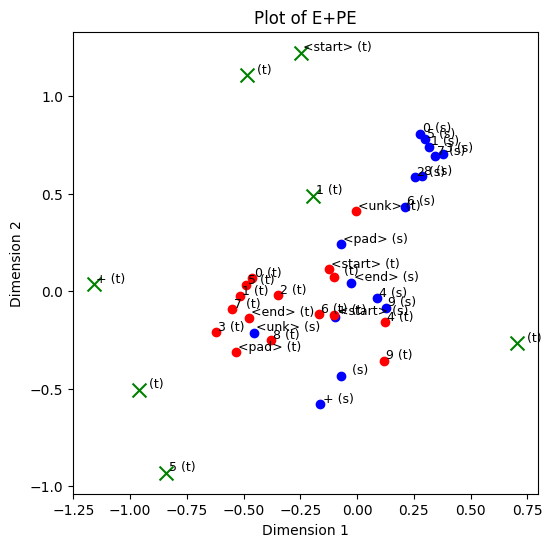

SelfAttention Layer
QV.shape: torch.Size([1, 7, 4])
KV.shape: torch.Size([1, 7, 4])
WV.shape: torch.Size([1, 7, 4])
attn_weight.shape: torch.Size([1, 7, 7])
AV.shape: torch.Size([1, 7, 4])
[[[ 1.6710228   0.86309004  0.24995238 -0.27111757]
  [-0.5829186   0.16324538 -0.7912906   1.0486854 ]
  [-0.30402273 -0.64216936 -0.7364837   0.40141028]
  [-1.2785212   0.3870846  -0.57777995  0.9510717 ]
  [ 1.0569528   1.1295671   0.55142087 -0.546205  ]
  [ 0.95438915  1.3444736   0.84715956 -0.35651731]
  [ 1.7408184   1.0755386   0.425125   -0.36595732]]]
(1, 7, 4)
[[ 1.6710228   0.86309004]
 [-0.5829186   0.16324538]
 [-0.30402273 -0.64216936]
 [-1.2785212   0.3870846 ]
 [ 1.0569528   1.1295671 ]
 [ 0.95438915  1.3444736 ]
 [ 1.7408184   1.0755386 ]]


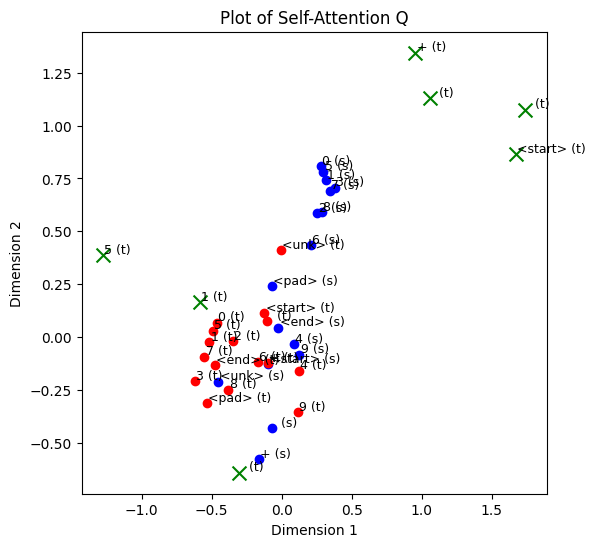

[[[ 1.4933789   1.5820361   0.46946707 -0.9740776 ]
  [ 0.06870762  0.04826249 -0.56696486  0.6129863 ]
  [ 0.14256531  0.18516839 -0.01008819 -0.38967878]
  [-1.6470414  -1.7903842  -1.9260877   2.440474  ]
  [-0.41122705 -0.48842144 -1.1186817   1.0450444 ]
  [-0.497376   -0.35002643 -0.5451736   0.93166566]
  [ 1.2756093   1.3597391   0.28467572 -0.67956465]]]
(1, 7, 4)
[[ 1.4933789   1.5820361 ]
 [ 0.06870762  0.04826249]
 [ 0.14256531  0.18516839]
 [-1.6470414  -1.7903842 ]
 [-0.41122705 -0.48842144]
 [-0.497376   -0.35002643]
 [ 1.2756093   1.3597391 ]]


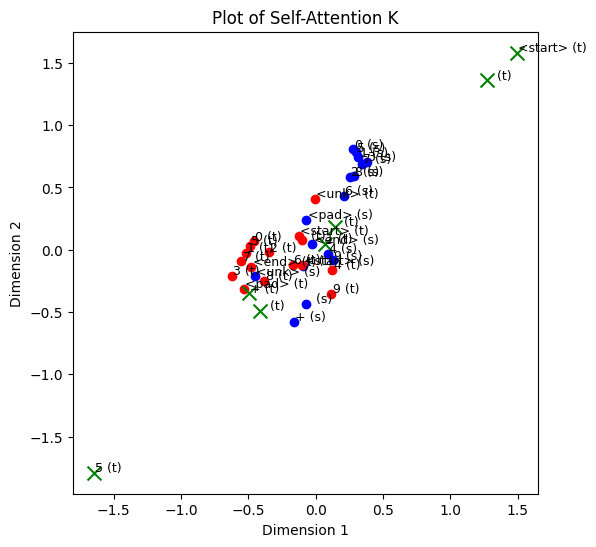

[[[ 0.22888592  0.17663535  0.4518405   0.49838567]
  [ 0.75891817  0.28342536 -0.12693013 -0.9412274 ]
  [ 0.12037133  0.6260945  -0.47412893 -0.7289601 ]
  [ 1.0959395  -0.47901723 -0.58115566 -1.5819137 ]
  [ 0.60003024 -0.6870174  -0.07659452 -0.21349032]
  [ 0.3312436  -0.9682738   0.10430816  0.35166842]
  [ 0.28153926 -0.04648737  0.46357247  0.54083675]]]
(1, 7, 4)
[[ 0.22888592  0.17663535]
 [ 0.75891817  0.28342536]
 [ 0.12037133  0.6260945 ]
 [ 1.0959395  -0.47901723]
 [ 0.60003024 -0.6870174 ]
 [ 0.3312436  -0.9682738 ]
 [ 0.28153926 -0.04648737]]


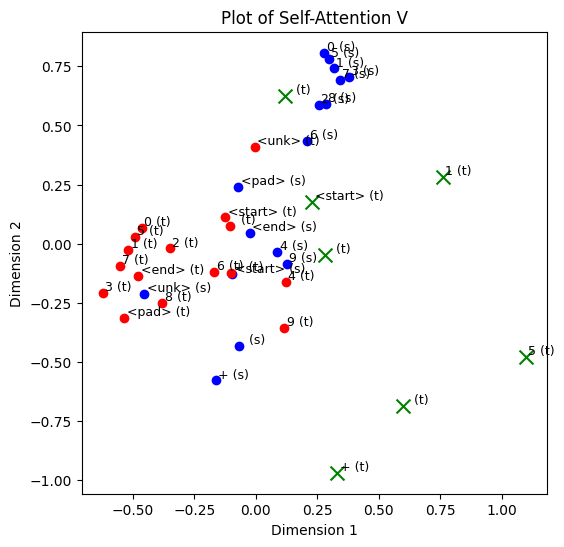

[[[ 0.28218383  0.08498055  0.33057866  0.31651127]
  [ 0.8240704  -0.43202224 -0.33396795 -0.9630137 ]
  [ 0.7931265  -0.4088214  -0.31618455 -0.91284287]
  [ 0.8385007  -0.44364783 -0.3513148  -0.998067  ]
  [ 0.2753875   0.09413259  0.33092308  0.32136428]
  [ 0.27279824  0.09474082  0.34076685  0.33671308]
  [ 0.27068153  0.09509359  0.35985538  0.36363086]]]
(1, 7, 4)
[[ 0.28218383  0.08498055]
 [ 0.8240704  -0.43202224]
 [ 0.7931265  -0.4088214 ]
 [ 0.8385007  -0.44364783]
 [ 0.2753875   0.09413259]
 [ 0.27279824  0.09474082]
 [ 0.27068153  0.09509359]]


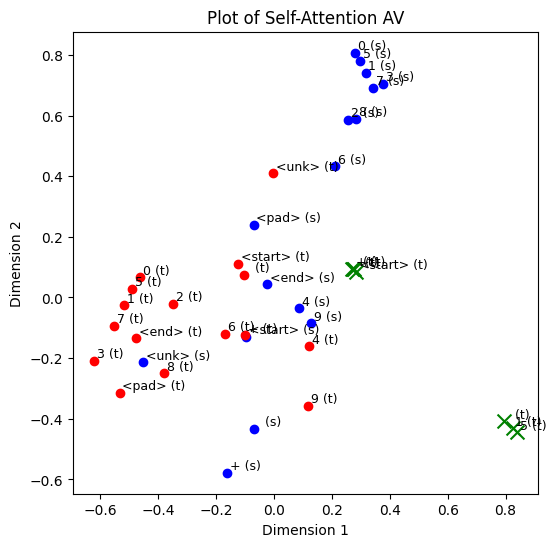

[[[ 0.3074262  -0.2981181   0.33591446  0.14476624]]

 [[-0.45225462  1.6740994  -0.1597395   0.05572284]]

 [[-0.42627716  1.5999913  -0.15097877  0.05122884]]

 [[-0.4708003   1.7273002  -0.17470625  0.05402208]]

 [[ 0.31365165 -0.3056246   0.32917616  0.1429719 ]]

 [[ 0.32029304 -0.3293326   0.34199366  0.14587715]]

 [[ 0.3327656  -0.37154937  0.36684412  0.15277818]]]
(7, 1, 4)
[[ 0.3074262  -0.2981181 ]
 [-0.45225462  1.6740994 ]
 [-0.42627716  1.5999913 ]
 [-0.4708003   1.7273002 ]
 [ 0.31365165 -0.3056246 ]
 [ 0.32029304 -0.3293326 ]
 [ 0.3327656  -0.37154937]]


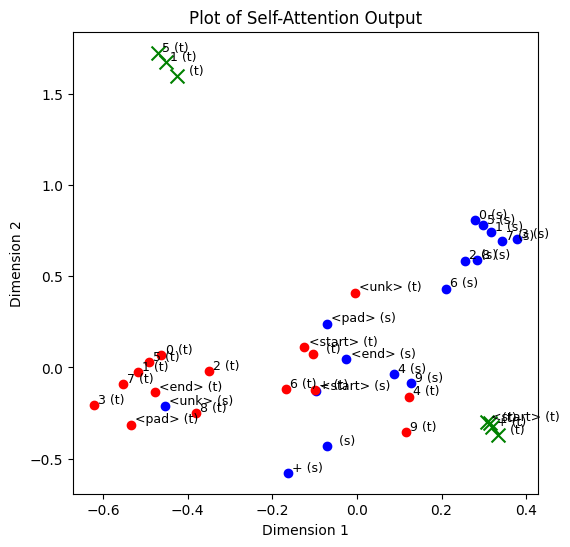

[[[-0.8966262   1.4099905   1.4196833  -1.350382  ]]

 [[-1.2328897   1.5600972  -0.9415693   0.8149389 ]]

 [[-0.3506779   2.0460656  -0.39433712 -1.2487457 ]]

 [[-1.3268905   0.7795754  -0.5748076   1.520647  ]]

 [[-0.7735876  -0.6958103   2.2169535   0.2585749 ]]

 [[-1.4525223   0.07543685  0.75847846  1.3856398 ]]

 [[-1.1764418   1.2328247   1.6385052  -0.99073917]]]
(7, 1, 4)
[[-0.8966262   1.4099905 ]
 [-1.2328897   1.5600972 ]
 [-0.3506779   2.0460656 ]
 [-1.3268905   0.7795754 ]
 [-0.7735876  -0.6958103 ]
 [-1.4525223   0.07543685]
 [-1.1764418   1.2328247 ]]


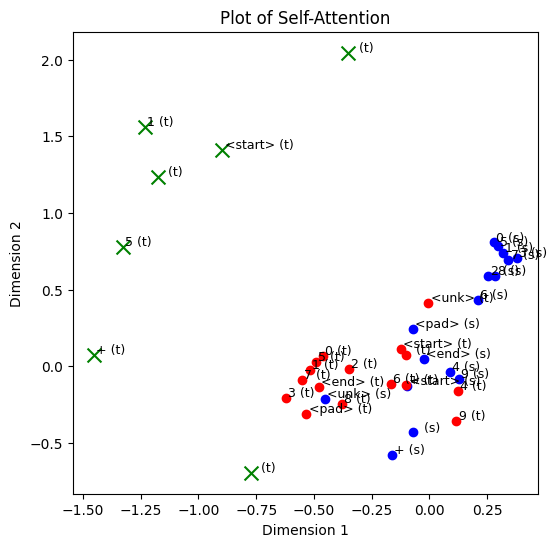

QV.shape: torch.Size([1, 7, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 7, 15])
AV.shape: torch.Size([1, 7, 4])
[[[-1.9690249   2.2821212   1.1484233  -1.0666118 ]
  [-1.3031788   0.01047248 -2.3062422   0.28923702]
  [-0.09307902  0.7639694  -0.66252196 -1.6886946 ]
  [-1.8559315   0.0105855  -2.0841594   1.2332544 ]
  [-2.8038907   2.082815    1.8232232   1.1071025 ]
  [-2.8932314   1.0090789  -0.5652164   1.6542022 ]
  [-2.546712    2.4227667   1.1518638  -0.5979832 ]]]
(1, 7, 4)
[[-1.9690249   2.2821212 ]
 [-1.3031788   0.01047248]
 [-0.09307902  0.7639694 ]
 [-1.8559315   0.0105855 ]
 [-2.8038907   2.082815  ]
 [-2.8932314   1.0090789 ]
 [-2.546712    2.4227667 ]]


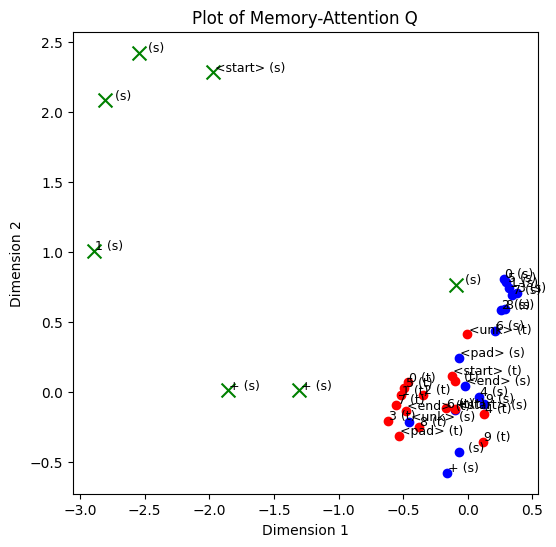

[[-2.5873542  -7.7650056  -5.898153    4.113516  ]
 [ 0.02491225 -1.2135888  -4.709598    1.5243986 ]
 [-0.47594458 -1.9969475  -5.156567    1.3736546 ]
 [-1.842775    0.50118184 -3.8816538   2.1161594 ]
 [-3.0246556  -0.64733064 -1.8812219   2.7934177 ]
 [ 0.9243954  -0.10356134  2.236121    0.4095208 ]
 [-1.419923   -2.239407   -2.2152905   2.3829184 ]
 [ 3.5096743  -1.6742307  -0.818094   -0.90171045]
 [-0.18588106 -2.2118235  -5.1941667   1.290563  ]
 [-1.3821328   0.308455   -4.3772726   1.8689482 ]
 [-2.7963638  -0.5893663  -2.3601792   2.5950441 ]
 [ 0.28278285 -0.02799085  1.6769762   0.7531041 ]
 [-1.8359957  -1.9127802  -1.7172087   2.585585  ]
 [ 3.2743897  -1.5754788  -0.25579175 -0.71645576]
 [ 1.2156768  -1.7601197  -3.9086413   0.6484872 ]]
(15, 4)
[[-2.5873542  -7.7650056 ]
 [ 0.02491225 -1.2135888 ]
 [-0.47594458 -1.9969475 ]
 [-1.842775    0.50118184]
 [-3.0246556  -0.64733064]
 [ 0.9243954  -0.10356134]
 [-1.419923   -2.239407  ]
 [ 3.5096743  -1.6742307 ]
 [-0.18588

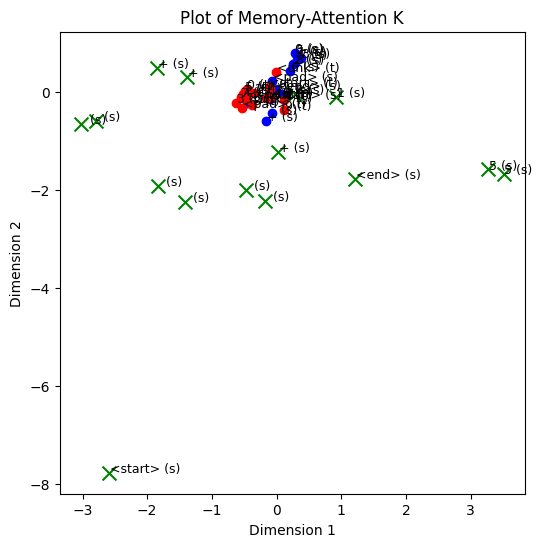

[[-4.157559   -0.22806118  1.2357246   0.5402342 ]
 [ 1.4508448   0.36097324 -1.1337703  -0.02642263]
 [ 0.05422554  0.70298916  0.3357393  -0.383374  ]
 [ 2.7505176  -0.53587735 -0.49158764 -1.1917727 ]
 [ 0.8331038  -1.1127834   0.5858201  -1.1625319 ]
 [-0.5007478   0.06357405 -0.7633241   0.786577  ]
 [-0.40591896 -0.4493605  -0.08779202 -0.03363407]
 [-1.4312079   1.8047924  -1.1555783   1.7204238 ]
 [-0.10231569  0.8126207   0.19123979 -0.19372857]
 [ 2.6538467  -0.23851366 -0.58247584 -1.0411739 ]
 [ 0.93491787 -0.902572    0.6017019  -1.18919   ]
 [-0.18725705 -0.13979931 -0.5472724   0.4329274 ]
 [-0.18144369 -0.73824126 -0.04923896 -0.20051992]
 [-1.3956933   1.5630281  -1.2213548   1.7193637 ]
 [ 0.10003449  1.0408527  -0.8392485   0.53835785]]
(15, 4)
[[-4.157559   -0.22806118]
 [ 1.4508448   0.36097324]
 [ 0.05422554  0.70298916]
 [ 2.7505176  -0.53587735]
 [ 0.8331038  -1.1127834 ]
 [-0.5007478   0.06357405]
 [-0.40591896 -0.4493605 ]
 [-1.4312079   1.8047924 ]
 [-0.10231

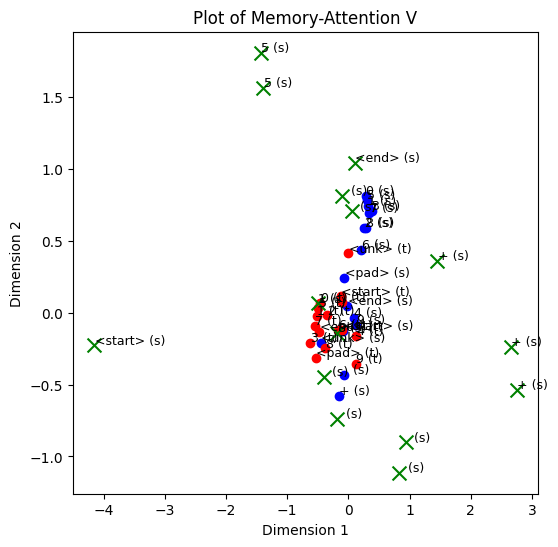

[[ 0.41999376 -0.39054313 -0.2548344  -0.16416763]
 [-2.8816998  -0.13514207  0.90081424  0.2653935 ]
 [ 0.3602937   0.5840866  -0.5861551   0.19195235]
 [-3.6941872  -0.22848114  1.1257098   0.42658263]
 [ 0.7677408  -0.88367283  0.3619057  -0.91618496]
 [ 0.8928362  -0.83803624  0.3798523  -1.0179244 ]
 [ 0.8481617  -0.68444663  0.09169995 -0.7086109 ]]
(7, 4)
[[ 0.41999376 -0.39054313]
 [-2.8816998  -0.13514207]
 [ 0.3602937   0.5840866 ]
 [-3.6941872  -0.22848114]
 [ 0.7677408  -0.88367283]
 [ 0.8928362  -0.83803624]
 [ 0.8481617  -0.68444663]]


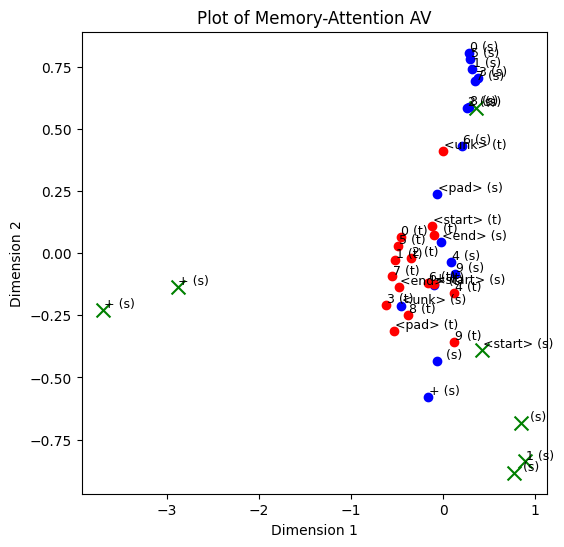

[[[ 0.3074262  -0.2981181   0.33591446  0.14476624]]

 [[-0.45225462  1.6740994  -0.1597395   0.05572284]]

 [[-0.42627716  1.5999913  -0.15097877  0.05122884]]

 [[-0.4708003   1.7273002  -0.17470625  0.05402208]]

 [[ 0.31365165 -0.3056246   0.32917616  0.1429719 ]]

 [[ 0.32029304 -0.3293326   0.34199366  0.14587715]]

 [[ 0.3327656  -0.37154937  0.36684412  0.15277818]]]
(7, 1, 4)
[[ 0.3074262  -0.2981181 ]
 [-0.45225462  1.6740994 ]
 [-0.42627716  1.5999913 ]
 [-0.4708003   1.7273002 ]
 [ 0.31365165 -0.3056246 ]
 [ 0.32029304 -0.3293326 ]
 [ 0.3327656  -0.37154937]]


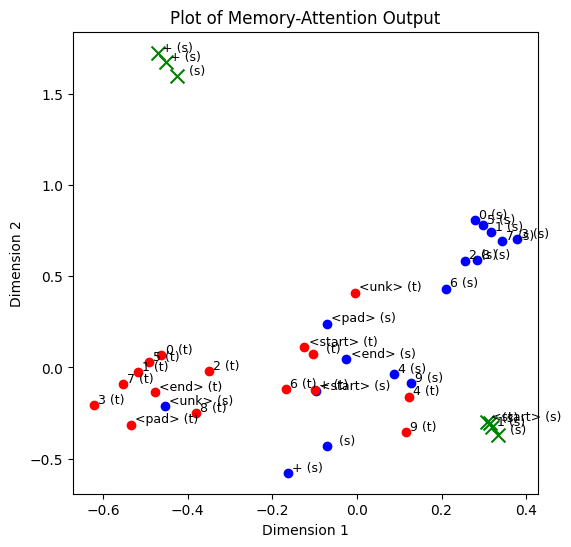

[[[-0.4408535   1.1494817   1.0032945  -1.554668  ]]

 [[-1.7164017   1.1348207  -0.531216    0.8736232 ]]

 [[-0.17906636  1.3607314   0.2753341  -1.5769618 ]]

 [[-1.7700574   0.8995525  -0.32247013  1.0914718 ]]

 [[-0.49331412 -0.08300123  2.3050506  -0.7968416 ]]

 [[-1.248208    1.0219675  -1.5028069   1.2500604 ]]

 [[-0.44834045  1.3282385   0.61598736 -1.5056658 ]]]
(7, 1, 4)
[[-0.4408535   1.1494817 ]
 [-1.7164017   1.1348207 ]
 [-0.17906636  1.3607314 ]
 [-1.7700574   0.8995525 ]
 [-0.49331412 -0.08300123]
 [-1.248208    1.0219675 ]
 [-0.44834045  1.3282385 ]]


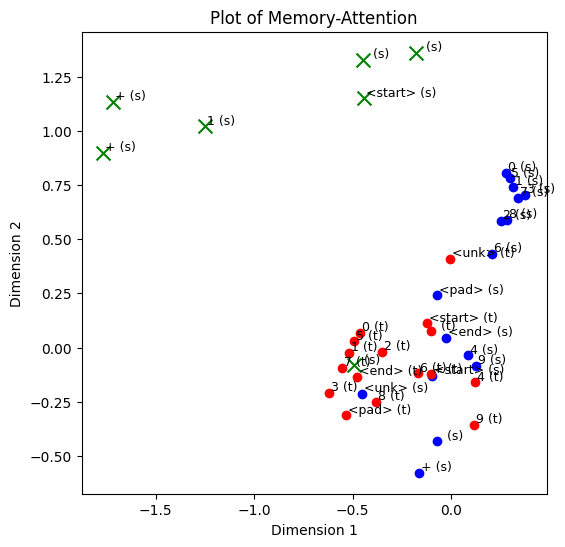

AfterLinear.shape: torch.Size([7, 1, 4])
AfterAddTGT.shape: torch.Size([7, 1, 4])
AfterAddTGT: tensor([[[-0.0596,  2.2692,  3.1211, -6.2847]],

        [[-4.8797,  0.9012, -5.5234,  6.9390]],

        [[ 7.6972, -6.5315, -0.5300, -1.6045]],

        [[-5.2192,  1.1741, -5.2888,  6.7717]],

        [[ 3.8005, -9.4351,  1.3022,  2.8597]],

        [[-3.0087, -0.8686, -6.2942,  7.6412]],

        [[ 1.6629, -6.2270,  6.1703, -2.6165]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[ 21.7481,   6.7791,  18.6512, -26.4566,  -6.7482,  16.2383,   8.2872,  -5.6556,  23.1796,
          -5.4441,  -5.6970,  -3.9798,  -7.8613, -12.4758, -21.4081,  12.8959]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 8

------------------

iter: 7
ys: tensor([[12],
        [ 1],
        [14],
        [ 5],
        [14],
        [15],
        [14],
        [ 8]], device='cuda:0')
tgt_embed: tensor([[[-0.2479,  1.2235,  0.5514, -0.177

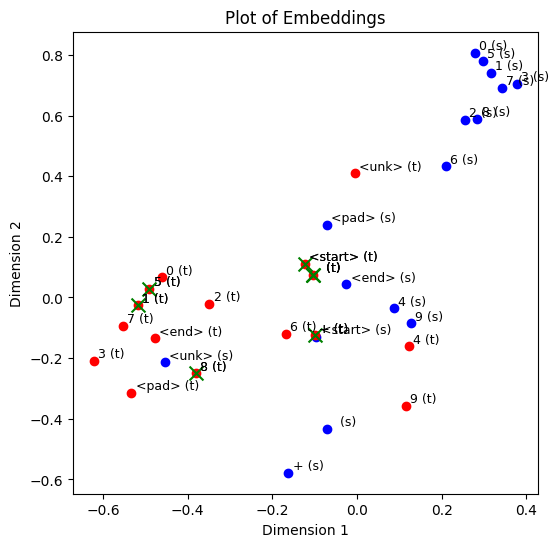

[[[-0.24789122  1.223464    0.55137694 -0.1776787 ]]

 [[-0.1934315   0.48972806  0.13874242  1.6061097 ]]

 [[ 0.7031361  -0.2668827   0.4362919  -0.1347509 ]]

 [[-0.8407894  -0.9311025  -0.0662975   1.8629564 ]]

 [[-0.9629638  -0.50437945  0.45628256 -0.13535082]]

 [[-1.1592597   0.0356656  -0.29029036  0.24739105]]

 [[-0.4855768   1.1094344   0.47625723 -0.1363504 ]]

 [[-0.10445678  0.25425085  0.21430784  0.82900965]]]
(8, 1, 4)
[[-0.24789122  1.223464  ]
 [-0.1934315   0.48972806]
 [ 0.7031361  -0.2668827 ]
 [-0.8407894  -0.9311025 ]
 [-0.9629638  -0.50437945]
 [-1.1592597   0.0356656 ]
 [-0.4855768   1.1094344 ]
 [-0.10445678  0.25425085]]


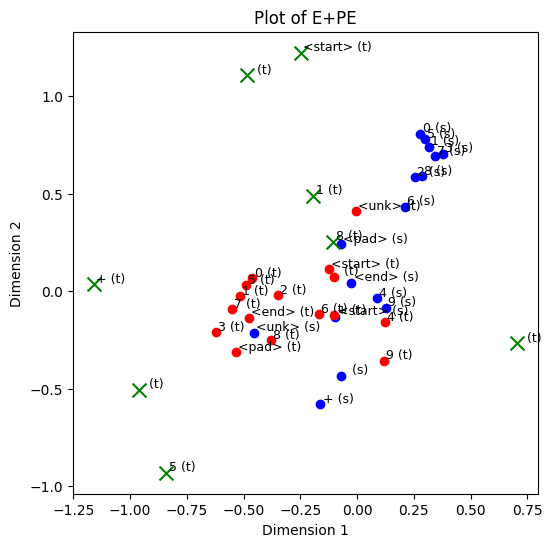

SelfAttention Layer
QV.shape: torch.Size([1, 8, 4])
KV.shape: torch.Size([1, 8, 4])
WV.shape: torch.Size([1, 8, 4])
attn_weight.shape: torch.Size([1, 8, 8])
AV.shape: torch.Size([1, 8, 4])
[[[ 1.6710228   0.86309004  0.24995238 -0.27111757]
  [-0.5829186   0.16324538 -0.7912906   1.0486854 ]
  [-0.30402273 -0.64216936 -0.7364837   0.40141028]
  [-1.2785212   0.3870846  -0.57777995  0.9510717 ]
  [ 1.0569528   1.1295671   0.55142087 -0.546205  ]
  [ 0.95438915  1.3444736   0.84715956 -0.35651731]
  [ 1.7408184   1.0755386   0.425125   -0.36595732]
  [-0.1301779   0.17113748 -0.48027337  0.5805658 ]]]
(1, 8, 4)
[[ 1.6710228   0.86309004]
 [-0.5829186   0.16324538]
 [-0.30402273 -0.64216936]
 [-1.2785212   0.3870846 ]
 [ 1.0569528   1.1295671 ]
 [ 0.95438915  1.3444736 ]
 [ 1.7408184   1.0755386 ]
 [-0.1301779   0.17113748]]


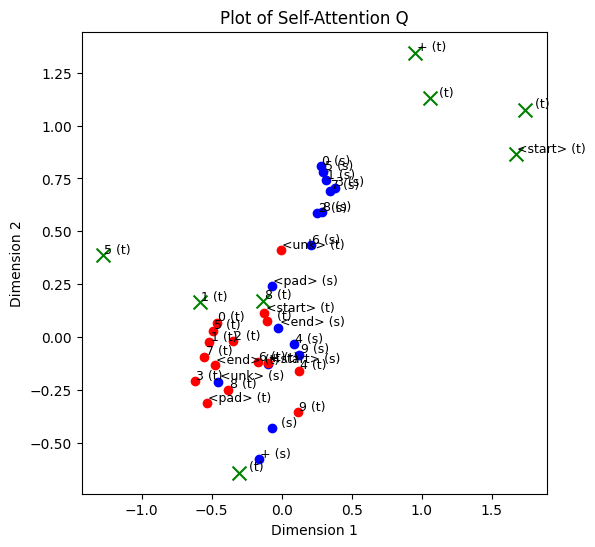

[[[ 1.4933789   1.5820361   0.46946707 -0.9740776 ]
  [ 0.06870762  0.04826249 -0.56696486  0.6129863 ]
  [ 0.14256531  0.18516839 -0.01008819 -0.38967878]
  [-1.6470414  -1.7903842  -1.9260877   2.440474  ]
  [-0.41122705 -0.48842144 -1.1186817   1.0450444 ]
  [-0.497376   -0.35002643 -0.5451736   0.93166566]
  [ 1.2756093   1.3597391   0.28467572 -0.67956465]
  [ 0.10257641  0.11908643 -0.38261726  0.3074934 ]]]
(1, 8, 4)
[[ 1.4933789   1.5820361 ]
 [ 0.06870762  0.04826249]
 [ 0.14256531  0.18516839]
 [-1.6470414  -1.7903842 ]
 [-0.41122705 -0.48842144]
 [-0.497376   -0.35002643]
 [ 1.2756093   1.3597391 ]
 [ 0.10257641  0.11908643]]


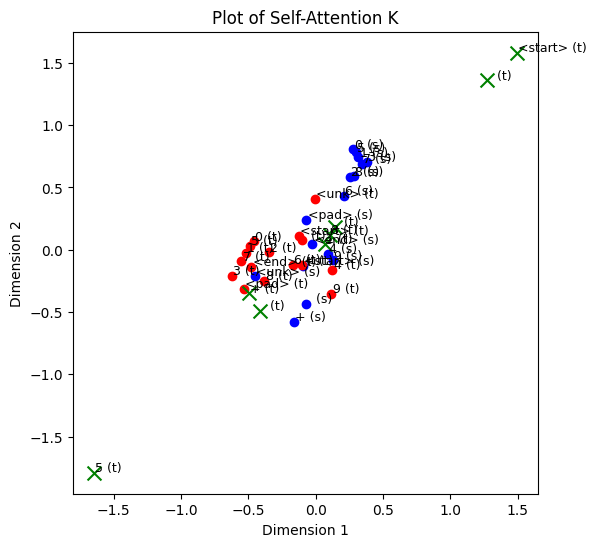

[[[ 0.22888592  0.17663535  0.4518405   0.49838567]
  [ 0.75891817  0.28342536 -0.12693013 -0.9412274 ]
  [ 0.12037133  0.6260945  -0.47412893 -0.7289601 ]
  [ 1.0959395  -0.47901723 -0.58115566 -1.5819137 ]
  [ 0.60003024 -0.6870174  -0.07659452 -0.21349032]
  [ 0.3312436  -0.9682738   0.10430816  0.35166842]
  [ 0.28153926 -0.04648737  0.46357247  0.54083675]
  [ 0.51268286  0.19123994 -0.15055123 -0.62838167]]]
(1, 8, 4)
[[ 0.22888592  0.17663535]
 [ 0.75891817  0.28342536]
 [ 0.12037133  0.6260945 ]
 [ 1.0959395  -0.47901723]
 [ 0.60003024 -0.6870174 ]
 [ 0.3312436  -0.9682738 ]
 [ 0.28153926 -0.04648737]
 [ 0.51268286  0.19123994]]


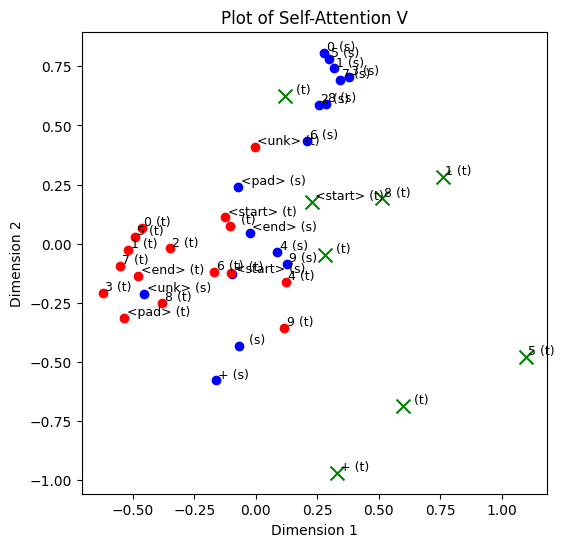

[[[ 0.2952509   0.09100444  0.30330324  0.26294497]
  [ 0.80384964 -0.39154917 -0.32205734 -0.94128346]
  [ 0.77251935 -0.36472863 -0.3040138  -0.89194053]
  [ 0.81884205 -0.40534097 -0.33920145 -0.97576153]
  [ 0.28817645  0.09936617  0.30497423  0.27017814]
  [ 0.28491092  0.09961344  0.31595832  0.28798175]
  [ 0.28139722  0.09935091  0.33725482  0.31970504]
  [ 0.6259873  -0.25299254 -0.16531067 -0.58841866]]]
(1, 8, 4)
[[ 0.2952509   0.09100444]
 [ 0.80384964 -0.39154917]
 [ 0.77251935 -0.36472863]
 [ 0.81884205 -0.40534097]
 [ 0.28817645  0.09936617]
 [ 0.28491092  0.09961344]
 [ 0.28139722  0.09935091]
 [ 0.6259873  -0.25299254]]


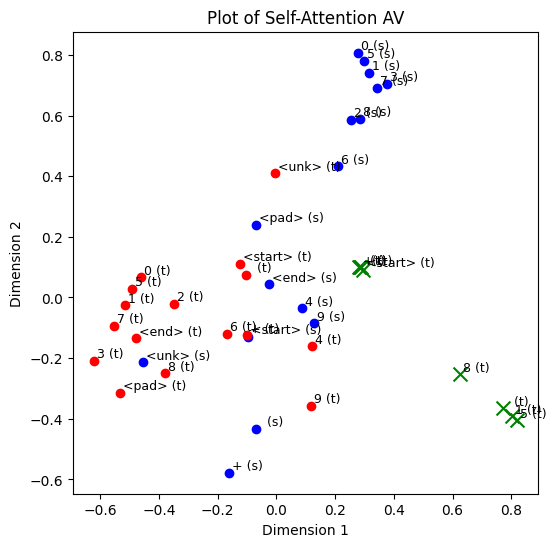

[[[ 0.2946444  -0.21973728  0.29078016  0.1413002 ]]

 [[-0.4175642   1.635812   -0.17925328  0.05753481]]

 [[-0.38893184  1.5621125  -0.17370355  0.05360939]]

 [[-0.43744886  1.6885157  -0.19193442  0.05580833]]

 [[ 0.30116463 -0.23070465  0.28663084  0.13977355]]

 [[ 0.30825862 -0.25794297  0.30148578  0.14273387]]

 [[ 0.32165998 -0.3070764   0.33022115  0.1497162 ]]

 [[-0.22957513  1.1036167  -0.06431877  0.05623787]]]
(8, 1, 4)
[[ 0.2946444  -0.21973728]
 [-0.4175642   1.635812  ]
 [-0.38893184  1.5621125 ]
 [-0.43744886  1.6885157 ]
 [ 0.30116463 -0.23070465]
 [ 0.30825862 -0.25794297]
 [ 0.32165998 -0.3070764 ]
 [-0.22957513  1.1036167 ]]


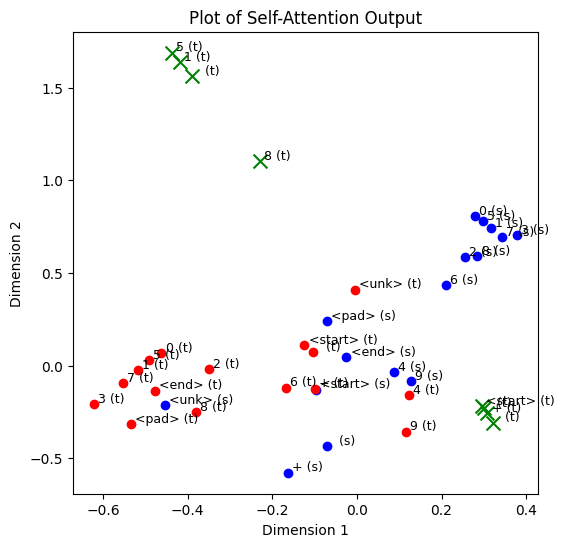

[[[-0.90339404  1.5379857   1.2221397  -1.3269744 ]]

 [[-1.217961    1.5498812  -0.9752573   0.83627766]]

 [[-0.28068936  2.0378253  -0.4582354  -1.2710652 ]]

 [[-1.3089442   0.7552209  -0.59590995  1.5442357 ]]

 [[-0.8412816  -0.6314634   2.222504    0.26171026]]

 [[-1.5010655   0.22555459  0.62474567  1.3816674 ]]

 [[-1.1844342   1.3548357   1.477102   -0.9886025 ]]

 [[-1.2933038   1.6686797  -0.7407788   0.5988698 ]]]
(8, 1, 4)
[[-0.90339404  1.5379857 ]
 [-1.217961    1.5498812 ]
 [-0.28068936  2.0378253 ]
 [-1.3089442   0.7552209 ]
 [-0.8412816  -0.6314634 ]
 [-1.5010655   0.22555459]
 [-1.1844342   1.3548357 ]
 [-1.2933038   1.6686797 ]]


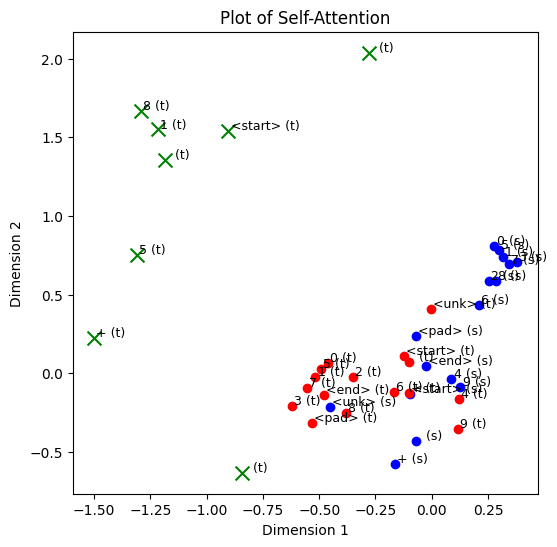

QV.shape: torch.Size([1, 8, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 8, 15])
AV.shape: torch.Size([1, 8, 4])
[[[-1.8462124   2.1458688   0.90652484 -1.1280555 ]
  [-1.2678485  -0.02818224 -2.340967    0.300097  ]
  [ 0.03981538  0.69496465 -0.6885604  -1.7339176 ]
  [-1.8263648  -0.02225891 -2.102626    1.25253   ]
  [-2.888511    2.1200838   1.7860913   1.1053318 ]
  [-2.8567412   0.94764686 -0.75268704  1.5853022 ]
  [-2.4447656   2.319691    0.95626926 -0.66756374]
  [-1.4564279   0.26265618 -2.0622206   0.12786296]]]
(1, 8, 4)
[[-1.8462124   2.1458688 ]
 [-1.2678485  -0.02818224]
 [ 0.03981538  0.69496465]
 [-1.8263648  -0.02225891]
 [-2.888511    2.1200838 ]
 [-2.8567412   0.94764686]
 [-2.4447656   2.319691  ]
 [-1.4564279   0.26265618]]


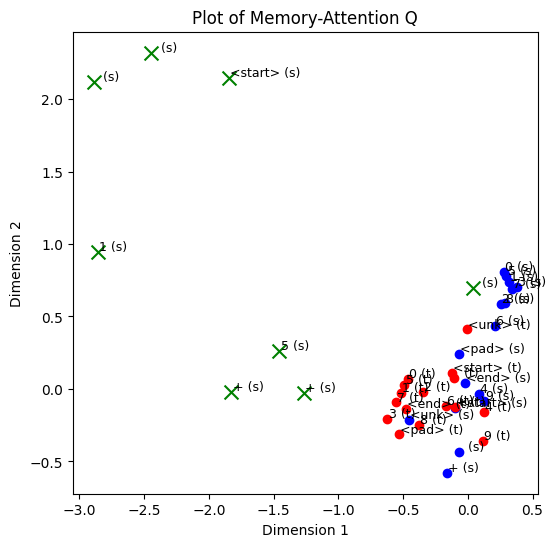

[[-2.5873542  -7.7650056  -5.898153    4.113516  ]
 [ 0.02491225 -1.2135888  -4.709598    1.5243986 ]
 [-0.47594458 -1.9969475  -5.156567    1.3736546 ]
 [-1.842775    0.50118184 -3.8816538   2.1161594 ]
 [-3.0246556  -0.64733064 -1.8812219   2.7934177 ]
 [ 0.9243954  -0.10356134  2.236121    0.4095208 ]
 [-1.419923   -2.239407   -2.2152905   2.3829184 ]
 [ 3.5096743  -1.6742307  -0.818094   -0.90171045]
 [-0.18588106 -2.2118235  -5.1941667   1.290563  ]
 [-1.3821328   0.308455   -4.3772726   1.8689482 ]
 [-2.7963638  -0.5893663  -2.3601792   2.5950441 ]
 [ 0.28278285 -0.02799085  1.6769762   0.7531041 ]
 [-1.8359957  -1.9127802  -1.7172087   2.585585  ]
 [ 3.2743897  -1.5754788  -0.25579175 -0.71645576]
 [ 1.2156768  -1.7601197  -3.9086413   0.6484872 ]]
(15, 4)
[[-2.5873542  -7.7650056 ]
 [ 0.02491225 -1.2135888 ]
 [-0.47594458 -1.9969475 ]
 [-1.842775    0.50118184]
 [-3.0246556  -0.64733064]
 [ 0.9243954  -0.10356134]
 [-1.419923   -2.239407  ]
 [ 3.5096743  -1.6742307 ]
 [-0.18588

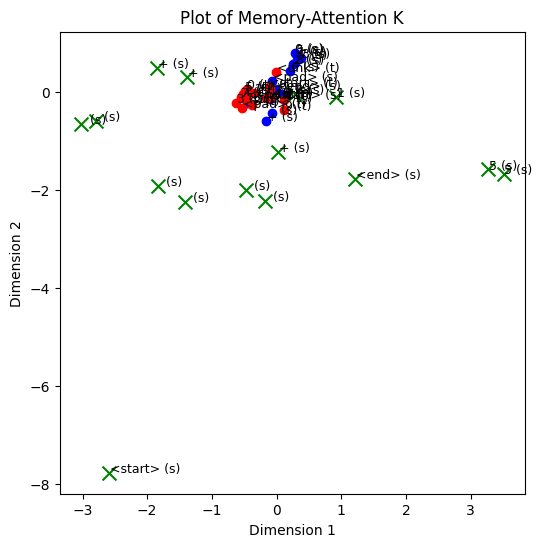

[[-4.157559   -0.22806118  1.2357246   0.5402342 ]
 [ 1.4508448   0.36097324 -1.1337703  -0.02642263]
 [ 0.05422554  0.70298916  0.3357393  -0.383374  ]
 [ 2.7505176  -0.53587735 -0.49158764 -1.1917727 ]
 [ 0.8331038  -1.1127834   0.5858201  -1.1625319 ]
 [-0.5007478   0.06357405 -0.7633241   0.786577  ]
 [-0.40591896 -0.4493605  -0.08779202 -0.03363407]
 [-1.4312079   1.8047924  -1.1555783   1.7204238 ]
 [-0.10231569  0.8126207   0.19123979 -0.19372857]
 [ 2.6538467  -0.23851366 -0.58247584 -1.0411739 ]
 [ 0.93491787 -0.902572    0.6017019  -1.18919   ]
 [-0.18725705 -0.13979931 -0.5472724   0.4329274 ]
 [-0.18144369 -0.73824126 -0.04923896 -0.20051992]
 [-1.3956933   1.5630281  -1.2213548   1.7193637 ]
 [ 0.10003449  1.0408527  -0.8392485   0.53835785]]
(15, 4)
[[-4.157559   -0.22806118]
 [ 1.4508448   0.36097324]
 [ 0.05422554  0.70298916]
 [ 2.7505176  -0.53587735]
 [ 0.8331038  -1.1127834 ]
 [-0.5007478   0.06357405]
 [-0.40591896 -0.4493605 ]
 [-1.4312079   1.8047924 ]
 [-0.10231

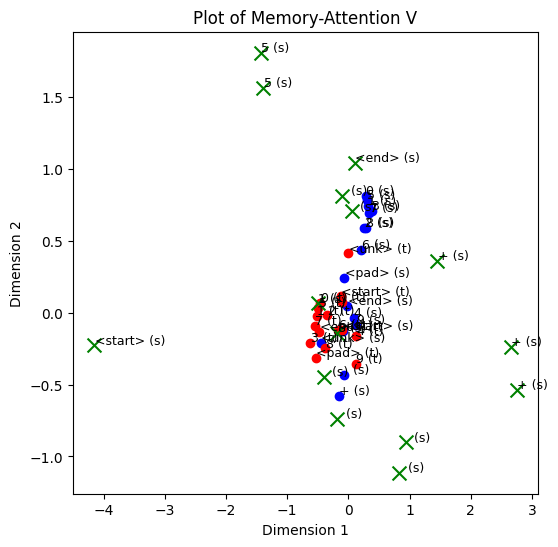

[[ 0.6069086  -0.42844632 -0.21724012 -0.29836893]
 [-3.0197933  -0.13850273  0.9358922   0.29726857]
 [ 0.15982081  0.7194935  -0.6408677   0.35242224]
 [-3.7518442  -0.22697395  1.1389683   0.44129422]
 [ 0.79713774 -0.90406793  0.38683864 -0.9543096 ]
 [ 0.776124   -0.791641    0.3734761  -0.9611793 ]
 [ 0.9622689  -0.6940259   0.09377436 -0.7713842 ]
 [-1.4282017  -0.11570202  0.534579   -0.07519267]]
(8, 4)
[[ 0.6069086  -0.42844632]
 [-3.0197933  -0.13850273]
 [ 0.15982081  0.7194935 ]
 [-3.7518442  -0.22697395]
 [ 0.79713774 -0.90406793]
 [ 0.776124   -0.791641  ]
 [ 0.9622689  -0.6940259 ]
 [-1.4282017  -0.11570202]]


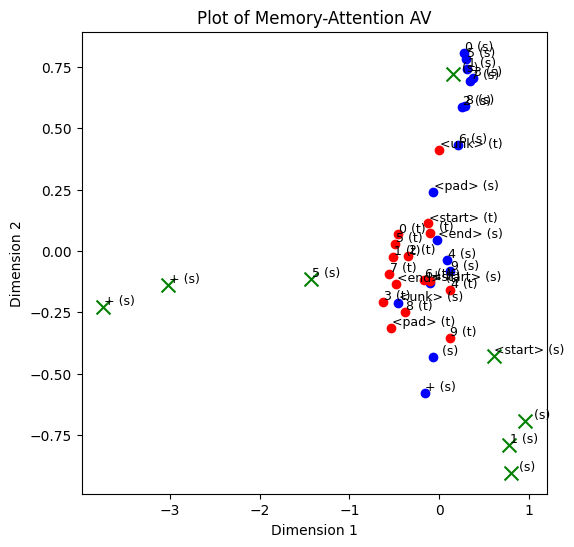

[[[ 0.2946444  -0.21973728  0.29078016  0.1413002 ]]

 [[-0.4175642   1.635812   -0.17925328  0.05753481]]

 [[-0.38893184  1.5621125  -0.17370355  0.05360939]]

 [[-0.43744886  1.6885157  -0.19193442  0.05580833]]

 [[ 0.30116463 -0.23070465  0.28663084  0.13977355]]

 [[ 0.30825862 -0.25794297  0.30148578  0.14273387]]

 [[ 0.32165998 -0.3070764   0.33022115  0.1497162 ]]

 [[-0.22957513  1.1036167  -0.06431877  0.05623787]]]
(8, 1, 4)
[[ 0.2946444  -0.21973728]
 [-0.4175642   1.635812  ]
 [-0.38893184  1.5621125 ]
 [-0.43744886  1.6885157 ]
 [ 0.30116463 -0.23070465]
 [ 0.30825862 -0.25794297]
 [ 0.32165998 -0.3070764 ]
 [-0.22957513  1.1036167 ]]


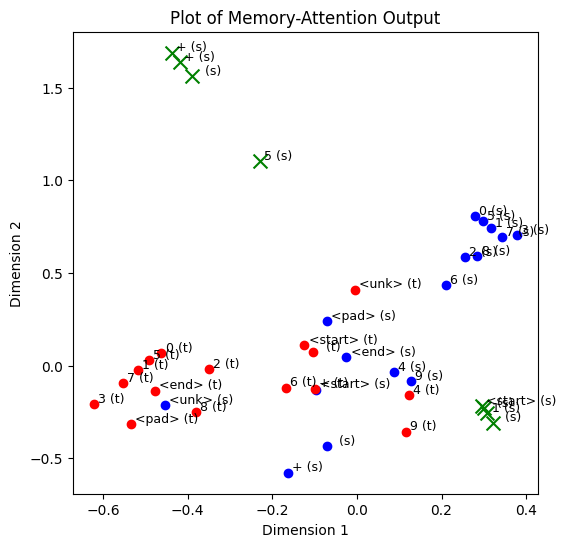

[[[-0.30341431  1.251875    0.6741572  -1.5933621 ]]

 [[-1.718464    1.1242869  -0.52761614  0.8871861 ]]

 [[-0.30722255  1.336412    0.47242483 -1.556488  ]]

 [[-1.7683054   0.8934836  -0.3248559   1.0995165 ]]

 [[-0.6126748   0.04058239  2.3024786  -0.8384393 ]]

 [[-1.3191435   1.0916327  -1.405272    1.158752  ]]

 [[-0.3443284   1.39225     0.3589439  -1.5111976 ]]

 [[-1.6268487   1.3026893  -0.6953748   0.67697114]]]
(8, 1, 4)
[[-0.30341431  1.251875  ]
 [-1.718464    1.1242869 ]
 [-0.30722255  1.336412  ]
 [-1.7683054   0.8934836 ]
 [-0.6126748   0.04058239]
 [-1.3191435   1.0916327 ]
 [-0.3443284   1.39225   ]
 [-1.6268487   1.3026893 ]]


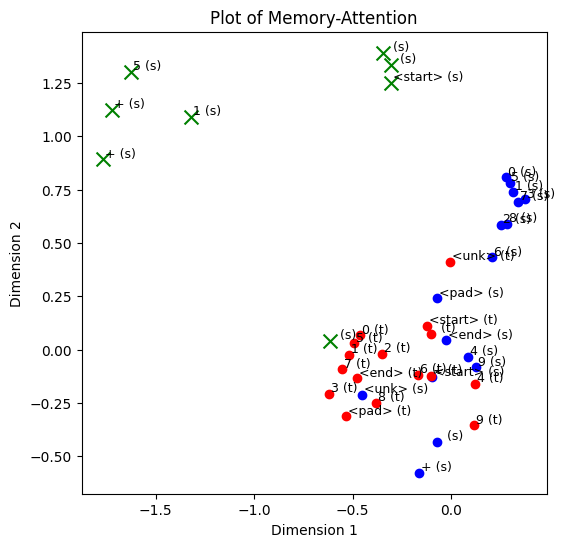

AfterLinear.shape: torch.Size([8, 1, 4])
AfterAddTGT.shape: torch.Size([8, 1, 4])
AfterAddTGT: tensor([[[ 6.6337, -3.7619,  1.2290, -4.8269]],

        [[-4.8888,  0.9080, -5.5172,  6.9351]],

        [[ 7.4512, -6.3410,  0.2327, -2.2498]],

        [[-5.2166,  1.1700, -5.2899,  6.7742]],

        [[ 1.5057, -9.4161,  2.1893,  4.0522]],

        [[-3.2226, -0.6524, -6.2449,  7.5829]],

        [[ 7.0932, -7.6714, -0.1888, -0.3220]],

        [[-4.5200,  0.5863, -5.7350,  7.1072]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[-44.5556, -26.0365, -25.7870,  23.1579,  10.0131, -40.2115,  -8.9747,  -3.8775, -35.8764,
           9.7368,  -0.6081,  -0.9798,   0.1884,  20.6096,  32.1462,   7.9850]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 14

------------------

iter: 8
ys: tensor([[12],
        [ 1],
        [14],
        [ 5],
        [14],
        [15],
        [14],
        [ 8],
        [14]], device=

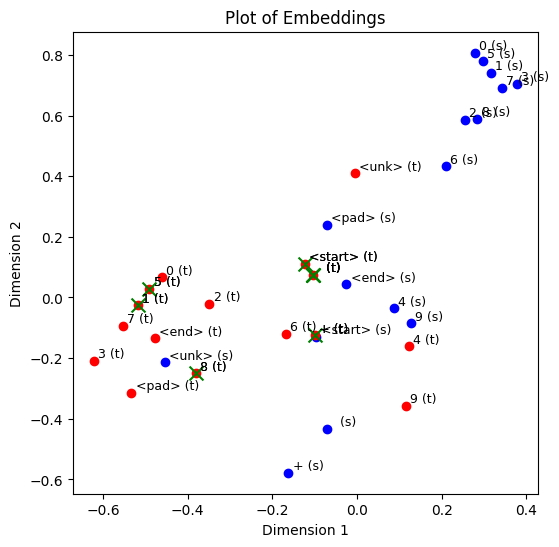

[[[-0.24789122  1.223464    0.55137694 -0.1776787 ]]

 [[-0.1934315   0.48972806  0.13874242  1.6061097 ]]

 [[ 0.7031361  -0.2668827   0.4362919  -0.1347509 ]]

 [[-0.8407894  -0.9311025  -0.0662975   1.8629564 ]]

 [[-0.9629638  -0.50437945  0.45628256 -0.13535082]]

 [[-1.1592597   0.0356656  -0.29029036  0.24739105]]

 [[-0.4855768   1.1094344   0.47625723 -0.1363504 ]]

 [[-0.10445678  0.25425085  0.21430784  0.82900965]]

 [[ 0.7831969   0.00376412  0.49620792 -0.13774925]]]
(9, 1, 4)
[[-0.24789122  1.223464  ]
 [-0.1934315   0.48972806]
 [ 0.7031361  -0.2668827 ]
 [-0.8407894  -0.9311025 ]
 [-0.9629638  -0.50437945]
 [-1.1592597   0.0356656 ]
 [-0.4855768   1.1094344 ]
 [-0.10445678  0.25425085]
 [ 0.7831969   0.00376412]]


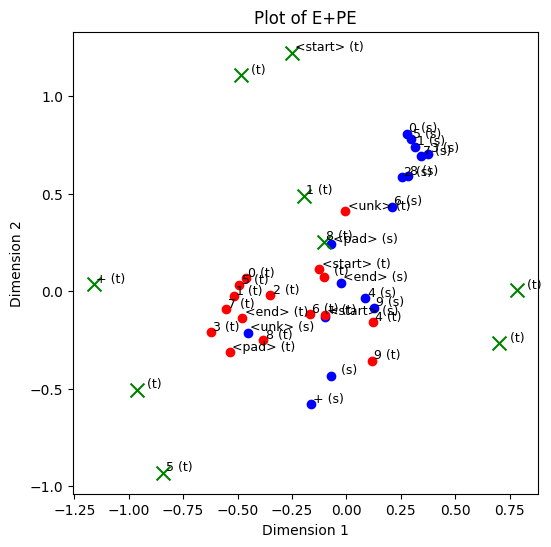

SelfAttention Layer
QV.shape: torch.Size([1, 9, 4])
KV.shape: torch.Size([1, 9, 4])
WV.shape: torch.Size([1, 9, 4])
attn_weight.shape: torch.Size([1, 9, 9])
AV.shape: torch.Size([1, 9, 4])
[[[ 1.6710228   0.86309004  0.24995238 -0.27111757]
  [-0.5829186   0.16324538 -0.7912906   1.0486854 ]
  [-0.30402273 -0.64216936 -0.7364837   0.40141028]
  [-1.2785212   0.3870846  -0.57777995  0.9510717 ]
  [ 1.0569528   1.1295671   0.55142087 -0.546205  ]
  [ 0.95438915  1.3444736   0.84715956 -0.35651731]
  [ 1.7408184   1.0755386   0.425125   -0.36595732]
  [-0.1301779   0.17113748 -0.48027337  0.5805658 ]
  [-0.16224436 -0.64478993 -0.77659994  0.42406577]]]
(1, 9, 4)
[[ 1.6710228   0.86309004]
 [-0.5829186   0.16324538]
 [-0.30402273 -0.64216936]
 [-1.2785212   0.3870846 ]
 [ 1.0569528   1.1295671 ]
 [ 0.95438915  1.3444736 ]
 [ 1.7408184   1.0755386 ]
 [-0.1301779   0.17113748]
 [-0.16224436 -0.64478993]]


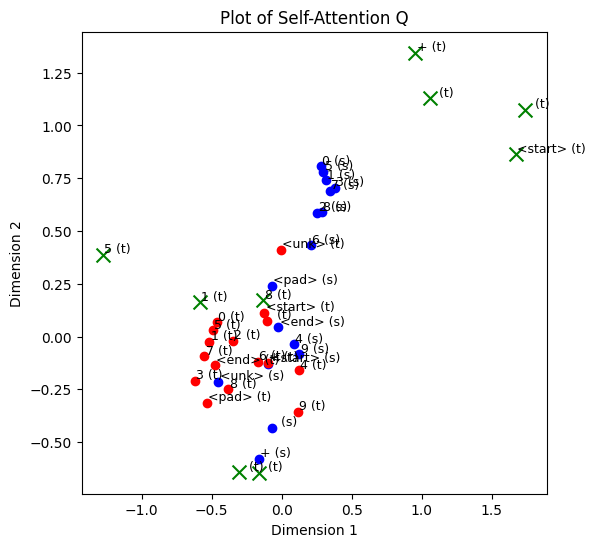

[[[ 1.4933789   1.5820361   0.46946707 -0.9740776 ]
  [ 0.06870762  0.04826249 -0.56696486  0.6129863 ]
  [ 0.14256531  0.18516839 -0.01008819 -0.38967878]
  [-1.6470414  -1.7903842  -1.9260877   2.440474  ]
  [-0.41122705 -0.48842144 -1.1186817   1.0450444 ]
  [-0.497376   -0.35002643 -0.5451736   0.93166566]
  [ 1.2756093   1.3597391   0.28467572 -0.67956465]
  [ 0.10257641  0.11908643 -0.38261726  0.3074934 ]
  [ 0.46234316  0.5151845   0.19089526 -0.6792126 ]]]
(1, 9, 4)
[[ 1.4933789   1.5820361 ]
 [ 0.06870762  0.04826249]
 [ 0.14256531  0.18516839]
 [-1.6470414  -1.7903842 ]
 [-0.41122705 -0.48842144]
 [-0.497376   -0.35002643]
 [ 1.2756093   1.3597391 ]
 [ 0.10257641  0.11908643]
 [ 0.46234316  0.5151845 ]]


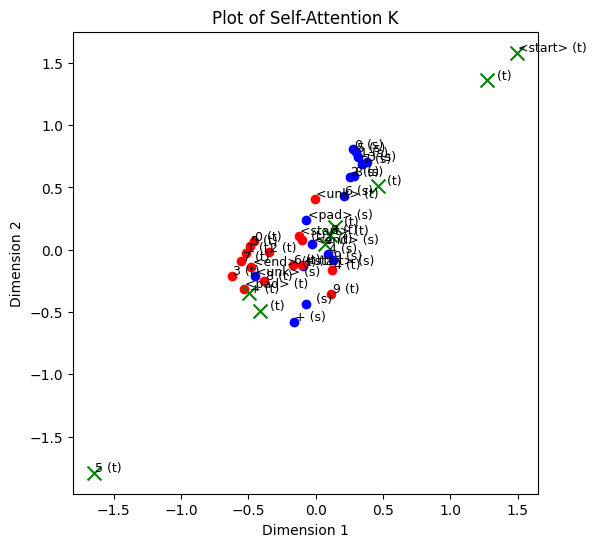

[[[ 0.22888592  0.17663535  0.4518405   0.49838567]
  [ 0.75891817  0.28342536 -0.12693013 -0.9412274 ]
  [ 0.12037133  0.6260945  -0.47412893 -0.7289601 ]
  [ 1.0959395  -0.47901723 -0.58115566 -1.5819137 ]
  [ 0.60003024 -0.6870174  -0.07659452 -0.21349032]
  [ 0.3312436  -0.9682738   0.10430816  0.35166842]
  [ 0.28153926 -0.04648737  0.46357247  0.54083675]
  [ 0.51268286  0.19123994 -0.15055123 -0.62838167]
  [ 0.09595431  0.7552234  -0.37880418 -0.63296586]]]
(1, 9, 4)
[[ 0.22888592  0.17663535]
 [ 0.75891817  0.28342536]
 [ 0.12037133  0.6260945 ]
 [ 1.0959395  -0.47901723]
 [ 0.60003024 -0.6870174 ]
 [ 0.3312436  -0.9682738 ]
 [ 0.28153926 -0.04648737]
 [ 0.51268286  0.19123994]
 [ 0.09595431  0.7552234 ]]


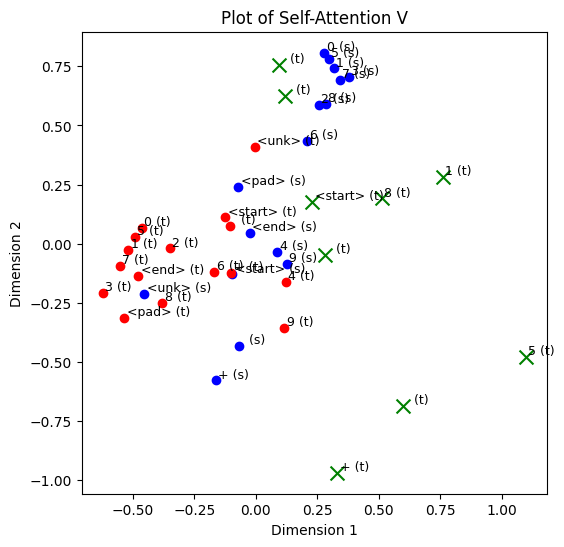

[[[ 0.2752489   0.15766753  0.23484482  0.17302857]
  [ 0.7841051  -0.35956365 -0.32364008 -0.93268394]
  [ 0.74606794 -0.32094213 -0.30693787 -0.88181555]
  [ 0.79954106 -0.37435424 -0.3402588  -0.96660894]
  [ 0.26681557  0.17224884  0.22898877  0.16981548]
  [ 0.2648254   0.1693028   0.24210715  0.19008778]
  [ 0.26432362  0.15973666  0.27132773  0.23199323]
  [ 0.59109974 -0.18663037 -0.1793631  -0.59135073]
  [ 0.73600245 -0.3123629  -0.29796782 -0.86188406]]]
(1, 9, 4)
[[ 0.2752489   0.15766753]
 [ 0.7841051  -0.35956365]
 [ 0.74606794 -0.32094213]
 [ 0.79954106 -0.37435424]
 [ 0.26681557  0.17224884]
 [ 0.2648254   0.1693028 ]
 [ 0.26432362  0.15973666]
 [ 0.59109974 -0.18663037]
 [ 0.73600245 -0.3123629 ]]


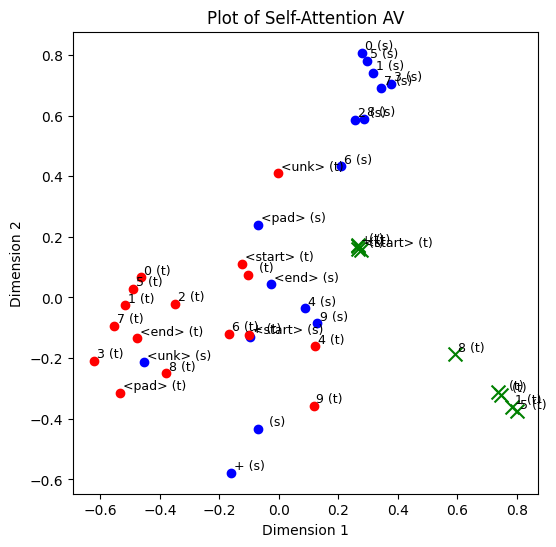

[[[ 0.29573333 -0.08565338  0.14164974  0.11355924]]

 [[-0.3973968   1.6213205  -0.20758781  0.05216176]]

 [[-0.361782    1.5446808  -0.21363798  0.04623126]]

 [[-0.41761246  1.6732363  -0.21871933  0.05071094]]

 [[ 0.30164576 -0.08102311  0.12196911  0.10922731]]

 [[ 0.30796477 -0.11187036  0.14240019  0.11320034]]

 [[ 0.32017165 -0.1760316   0.18978322  0.1234928 ]]

 [[-0.1943561   1.1044482  -0.13875021  0.04364332]]

 [[-0.3505589   1.5144942  -0.20773408  0.04628577]]]
(9, 1, 4)
[[ 0.29573333 -0.08565338]
 [-0.3973968   1.6213205 ]
 [-0.361782    1.5446808 ]
 [-0.41761246  1.6732363 ]
 [ 0.30164576 -0.08102311]
 [ 0.30796477 -0.11187036]
 [ 0.32017165 -0.1760316 ]
 [-0.1943561   1.1044482 ]
 [-0.3505589   1.5144942 ]]


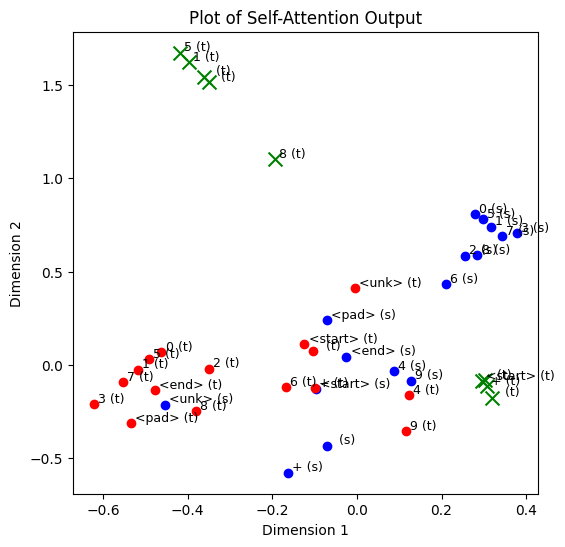

[[[-0.833832    1.7761685   0.7555994  -1.301091  ]]

 [[-1.201178    1.5497339  -1.0077703   0.84290826]]

 [[-0.21233834  2.0313516  -0.54672337 -1.2733061 ]]

 [[-1.2941649   0.75019634 -0.6237241   1.5550057 ]]

 [[-0.9787073  -0.49482593  2.2097886   0.28083828]]

 [[-1.5336765   0.5895127   0.15872331  1.3859317 ]]

 [[-1.1343261   1.6388586   1.0268089  -1.0051055 ]]

 [[-1.2242675   1.6927539  -0.8777331   0.600532  ]]

 [[-0.19690955  2.024333   -0.5356214  -1.2928957 ]]]
(9, 1, 4)
[[-0.833832    1.7761685 ]
 [-1.201178    1.5497339 ]
 [-0.21233834  2.0313516 ]
 [-1.2941649   0.75019634]
 [-0.9787073  -0.49482593]
 [-1.5336765   0.5895127 ]
 [-1.1343261   1.6388586 ]
 [-1.2242675   1.6927539 ]
 [-0.19690955  2.024333  ]]


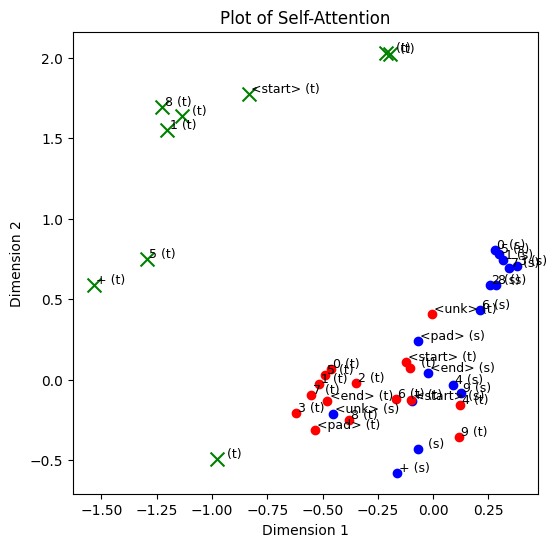

QV.shape: torch.Size([1, 9, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 9, 15])
AV.shape: torch.Size([1, 9, 4])
[[[-1.4473405   1.7920539   0.395825   -1.2964337 ]
  [-1.2272389  -0.06097585 -2.3700027   0.29515275]
  [ 0.18250085  0.6023575  -0.7488659  -1.7675854 ]
  [-1.792479   -0.05262506 -2.1282816   1.2540787 ]
  [-3.0470524   2.174702    1.6797528   1.1055233 ]
  [-2.5731428   0.65573287 -1.3230822   1.3811698 ]
  [-2.0688827   2.0040228   0.4613587  -0.87865794]
  [-1.2803522   0.13616645 -2.179993    0.07732058]
  [ 0.1982206   0.60976434 -0.7218257  -1.7829534 ]]]
(1, 9, 4)
[[-1.4473405   1.7920539 ]
 [-1.2272389  -0.06097585]
 [ 0.18250085  0.6023575 ]
 [-1.792479   -0.05262506]
 [-3.0470524   2.174702  ]
 [-2.5731428   0.65573287]
 [-2.0688827   2.0040228 ]
 [-1.2803522   0.13616645]
 [ 0.1982206   0.60976434]]


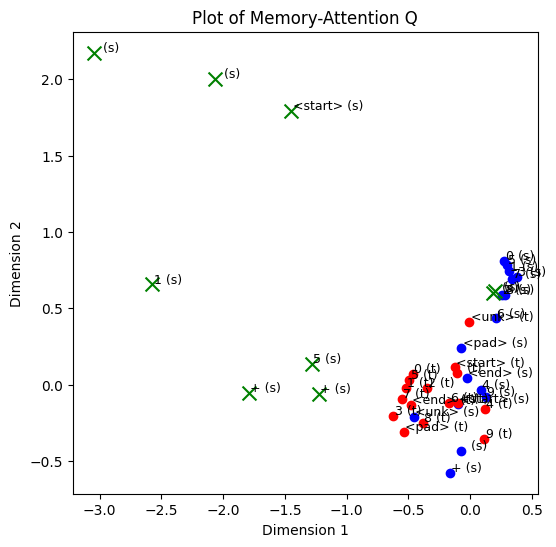

[[-2.5873542  -7.7650056  -5.898153    4.113516  ]
 [ 0.02491225 -1.2135888  -4.709598    1.5243986 ]
 [-0.47594458 -1.9969475  -5.156567    1.3736546 ]
 [-1.842775    0.50118184 -3.8816538   2.1161594 ]
 [-3.0246556  -0.64733064 -1.8812219   2.7934177 ]
 [ 0.9243954  -0.10356134  2.236121    0.4095208 ]
 [-1.419923   -2.239407   -2.2152905   2.3829184 ]
 [ 3.5096743  -1.6742307  -0.818094   -0.90171045]
 [-0.18588106 -2.2118235  -5.1941667   1.290563  ]
 [-1.3821328   0.308455   -4.3772726   1.8689482 ]
 [-2.7963638  -0.5893663  -2.3601792   2.5950441 ]
 [ 0.28278285 -0.02799085  1.6769762   0.7531041 ]
 [-1.8359957  -1.9127802  -1.7172087   2.585585  ]
 [ 3.2743897  -1.5754788  -0.25579175 -0.71645576]
 [ 1.2156768  -1.7601197  -3.9086413   0.6484872 ]]
(15, 4)
[[-2.5873542  -7.7650056 ]
 [ 0.02491225 -1.2135888 ]
 [-0.47594458 -1.9969475 ]
 [-1.842775    0.50118184]
 [-3.0246556  -0.64733064]
 [ 0.9243954  -0.10356134]
 [-1.419923   -2.239407  ]
 [ 3.5096743  -1.6742307 ]
 [-0.18588

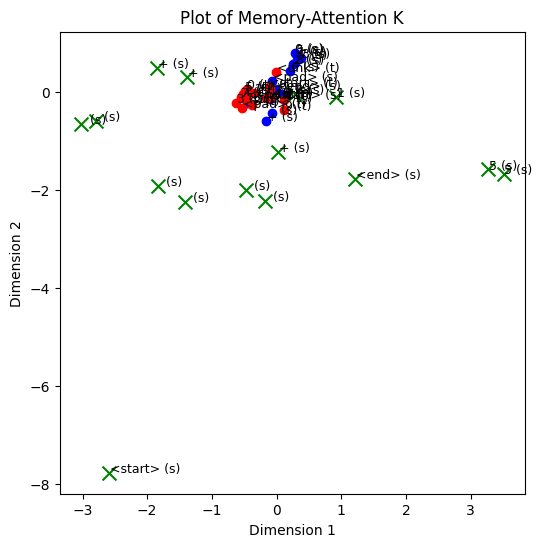

[[-4.157559   -0.22806118  1.2357246   0.5402342 ]
 [ 1.4508448   0.36097324 -1.1337703  -0.02642263]
 [ 0.05422554  0.70298916  0.3357393  -0.383374  ]
 [ 2.7505176  -0.53587735 -0.49158764 -1.1917727 ]
 [ 0.8331038  -1.1127834   0.5858201  -1.1625319 ]
 [-0.5007478   0.06357405 -0.7633241   0.786577  ]
 [-0.40591896 -0.4493605  -0.08779202 -0.03363407]
 [-1.4312079   1.8047924  -1.1555783   1.7204238 ]
 [-0.10231569  0.8126207   0.19123979 -0.19372857]
 [ 2.6538467  -0.23851366 -0.58247584 -1.0411739 ]
 [ 0.93491787 -0.902572    0.6017019  -1.18919   ]
 [-0.18725705 -0.13979931 -0.5472724   0.4329274 ]
 [-0.18144369 -0.73824126 -0.04923896 -0.20051992]
 [-1.3956933   1.5630281  -1.2213548   1.7193637 ]
 [ 0.10003449  1.0408527  -0.8392485   0.53835785]]
(15, 4)
[[-4.157559   -0.22806118]
 [ 1.4508448   0.36097324]
 [ 0.05422554  0.70298916]
 [ 2.7505176  -0.53587735]
 [ 0.8331038  -1.1127834 ]
 [-0.5007478   0.06357405]
 [-0.40591896 -0.4493605 ]
 [-1.4312079   1.8047924 ]
 [-0.10231

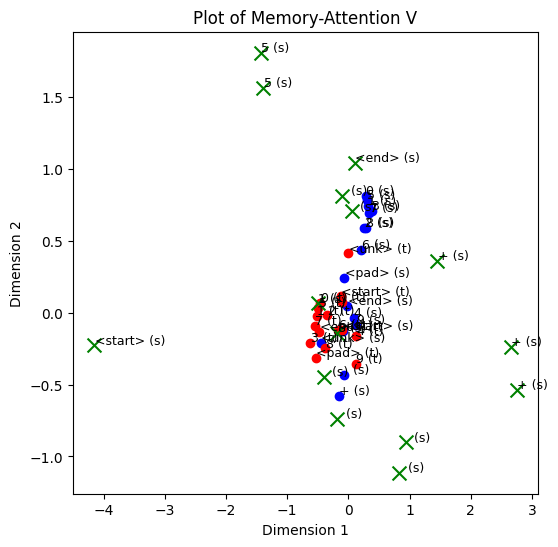

[[ 0.94897515 -0.4036777  -0.23704852 -0.46272963]
 [-3.105357   -0.13898699  0.95725745  0.31758568]
 [-0.01557973  0.84529984 -0.685189    0.49010867]
 [-3.7949176  -0.22532853  1.1486868   0.4524937 ]
 [ 0.8510387  -0.9384476   0.42878562 -1.0207434 ]
 [-0.5853226  -0.5321175   0.5325285  -0.4817548 ]
 [ 1.2382395  -0.65076923  0.01797597 -0.8496087 ]
 [-1.9503233  -0.08272634  0.6553344   0.06223099]
 [-0.06770758  0.87207973 -0.70527065  0.5368344 ]]
(9, 4)
[[ 0.94897515 -0.4036777 ]
 [-3.105357   -0.13898699]
 [-0.01557973  0.84529984]
 [-3.7949176  -0.22532853]
 [ 0.8510387  -0.9384476 ]
 [-0.5853226  -0.5321175 ]
 [ 1.2382395  -0.65076923]
 [-1.9503233  -0.08272634]
 [-0.06770758  0.87207973]]


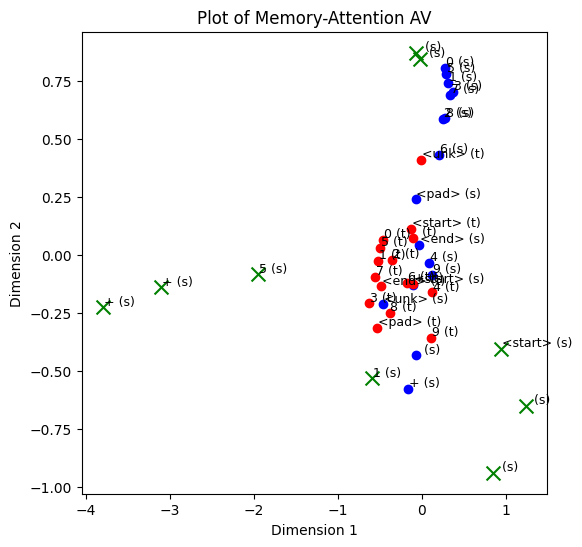

[[[ 0.29573333 -0.08565338  0.14164974  0.11355924]]

 [[-0.3973968   1.6213205  -0.20758781  0.05216176]]

 [[-0.361782    1.5446808  -0.21363798  0.04623126]]

 [[-0.41761246  1.6732363  -0.21871933  0.05071094]]

 [[ 0.30164576 -0.08102311  0.12196911  0.10922731]]

 [[ 0.30796477 -0.11187036  0.14240019  0.11320034]]

 [[ 0.32017165 -0.1760316   0.18978322  0.1234928 ]]

 [[-0.1943561   1.1044482  -0.13875021  0.04364332]]

 [[-0.3505589   1.5144942  -0.20773408  0.04628577]]]
(9, 1, 4)
[[ 0.29573333 -0.08565338]
 [-0.3973968   1.6213205 ]
 [-0.361782    1.5446808 ]
 [-0.41761246  1.6732363 ]
 [ 0.30164576 -0.08102311]
 [ 0.30796477 -0.11187036]
 [ 0.32017165 -0.1760316 ]
 [-0.1943561   1.1044482 ]
 [-0.3505589   1.5144942 ]]


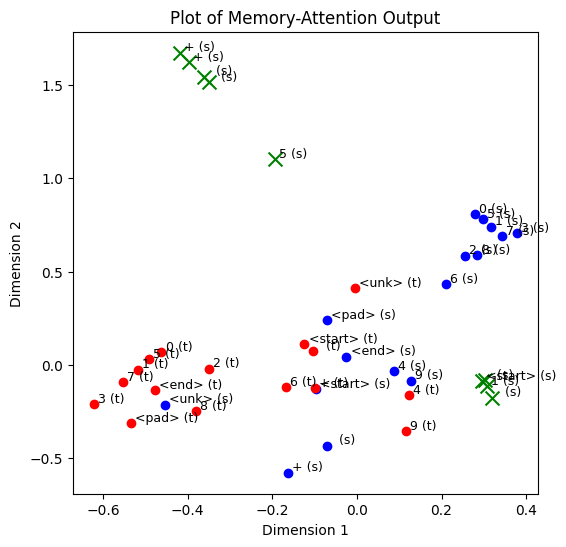

[[[ 0.02169864  1.3394407   0.08787993 -1.6174496 ]]

 [[-1.7180151   1.1202303  -0.5300564   0.89391005]]

 [[-0.42099866  1.3184493   0.61780757 -1.5217566 ]]

 [[-1.7662301   0.89214015 -0.33096388  1.1036136 ]]

 [[-0.88307905  0.33136132  2.2075603  -0.882684  ]]

 [[-1.6718738   1.0233411  -0.66227525  1.0719029 ]]

 [[-0.03815048  1.4438424  -0.16166827 -1.5154498 ]]

 [[-1.6609927   1.2522914  -0.63922834  0.73844016]]

 [[-0.45047614  1.2964652   0.6939018  -1.5174057 ]]]
(9, 1, 4)
[[ 0.02169864  1.3394407 ]
 [-1.7180151   1.1202303 ]
 [-0.42099866  1.3184493 ]
 [-1.7662301   0.89214015]
 [-0.88307905  0.33136132]
 [-1.6718738   1.0233411 ]
 [-0.03815048  1.4438424 ]
 [-1.6609927   1.2522914 ]
 [-0.45047614  1.2964652 ]]


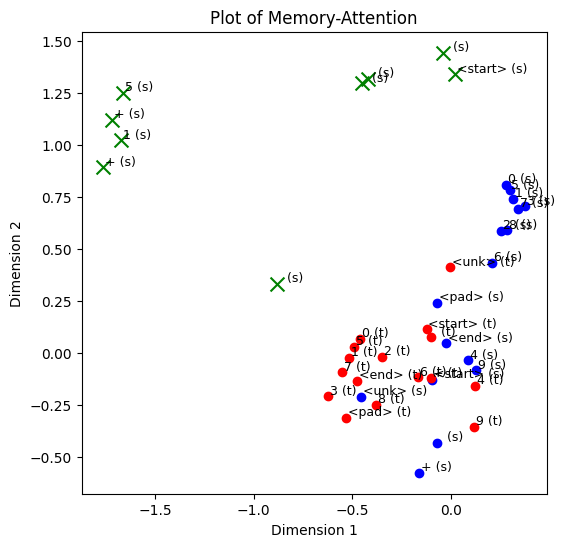

AfterLinear.shape: torch.Size([9, 1, 4])
AfterAddTGT.shape: torch.Size([9, 1, 4])
AfterAddTGT: tensor([[[ 7.8164, -6.3318, -0.7608, -1.6877]],

        [[-4.8866,  0.9052, -5.5182,  6.9367]],

        [[ 4.8235, -5.6904,  3.9031, -3.8463]],

        [[-5.2087,  1.1621, -5.2951,  6.7793]],

        [[-8.6632,  0.4423,  1.4479,  4.4284]],

        [[-4.7151,  0.7233, -5.6094,  7.0377]],

        [[ 7.5505, -7.2044, -1.0594, -0.3764]],

        [[-4.6523,  0.7046, -5.6612,  7.0468]],

        [[-2.2870, -0.4263,  6.2288, -4.6145]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[ 25.9623,  25.5525,   4.8072,  -7.3083, -28.5033,  29.1778, -11.2703,  14.6098,  18.0377,
         -26.9001,  -6.1863,  -2.9091,  -8.0443, -30.6180, -14.0009,   2.4772]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 5

------------------

iter: 9
ys: tensor([[12],
        [ 1],
        [14],
        [ 5],
        [14],
        [15],
  

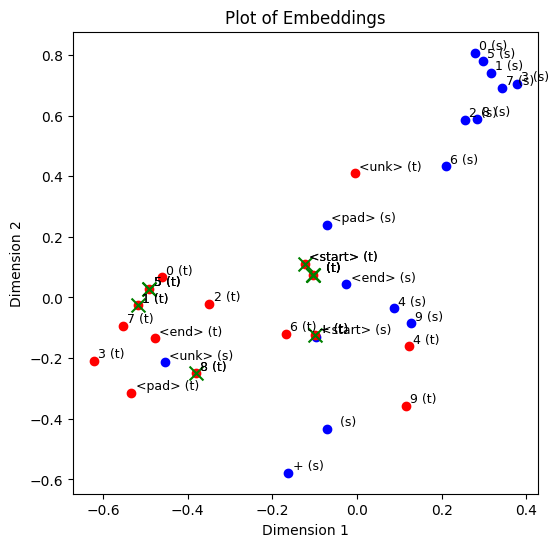

[[[-0.24789122  1.223464    0.55137694 -0.1776787 ]]

 [[-0.1934315   0.48972806  0.13874242  1.6061097 ]]

 [[ 0.7031361  -0.2668827   0.4362919  -0.1347509 ]]

 [[-0.8407894  -0.9311025  -0.0662975   1.8629564 ]]

 [[-0.9629638  -0.50437945  0.45628256 -0.13535082]]

 [[-1.1592597   0.0356656  -0.29029036  0.24739105]]

 [[-0.4855768   1.1094344   0.47625723 -0.1363504 ]]

 [[-0.10445678  0.25425085  0.21430784  0.82900965]]

 [[ 0.7831969   0.00376412  0.49620792 -0.13774925]]

 [[-0.5697909  -0.85224026 -0.00641446  1.859359  ]]]
(10, 1, 4)
[[-0.24789122  1.223464  ]
 [-0.1934315   0.48972806]
 [ 0.7031361  -0.2668827 ]
 [-0.8407894  -0.9311025 ]
 [-0.9629638  -0.50437945]
 [-1.1592597   0.0356656 ]
 [-0.4855768   1.1094344 ]
 [-0.10445678  0.25425085]
 [ 0.7831969   0.00376412]
 [-0.5697909  -0.85224026]]


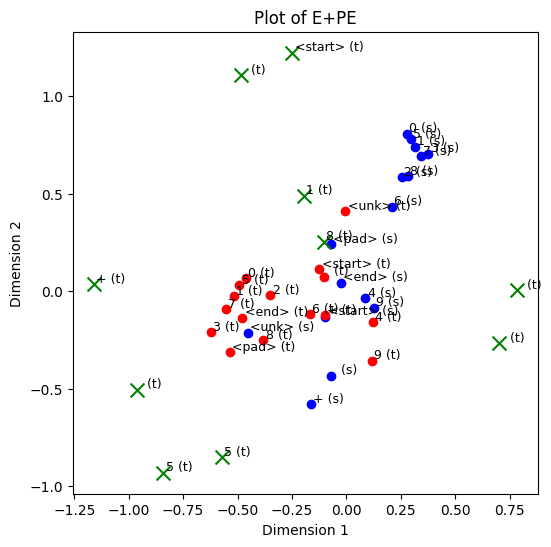

SelfAttention Layer
QV.shape: torch.Size([1, 10, 4])
KV.shape: torch.Size([1, 10, 4])
WV.shape: torch.Size([1, 10, 4])
attn_weight.shape: torch.Size([1, 10, 10])
AV.shape: torch.Size([1, 10, 4])
[[[ 1.6710228   0.86309004  0.24995238 -0.27111757]
  [-0.5829186   0.16324538 -0.7912906   1.0486854 ]
  [-0.30402273 -0.64216936 -0.7364837   0.40141028]
  [-1.2785212   0.3870846  -0.57777995  0.9510717 ]
  [ 1.0569528   1.1295671   0.55142087 -0.546205  ]
  [ 0.95438915  1.3444736   0.84715956 -0.35651731]
  [ 1.7408184   1.0755386   0.425125   -0.36595732]
  [-0.1301779   0.17113748 -0.48027337  0.5805658 ]
  [-0.16224436 -0.64478993 -0.77659994  0.42406577]
  [-1.4415667   0.11793834 -0.8015458   1.0941029 ]]]
(1, 10, 4)
[[ 1.6710228   0.86309004]
 [-0.5829186   0.16324538]
 [-0.30402273 -0.64216936]
 [-1.2785212   0.3870846 ]
 [ 1.0569528   1.1295671 ]
 [ 0.95438915  1.3444736 ]
 [ 1.7408184   1.0755386 ]
 [-0.1301779   0.17113748]
 [-0.16224436 -0.64478993]
 [-1.4415667   0.11793834]]


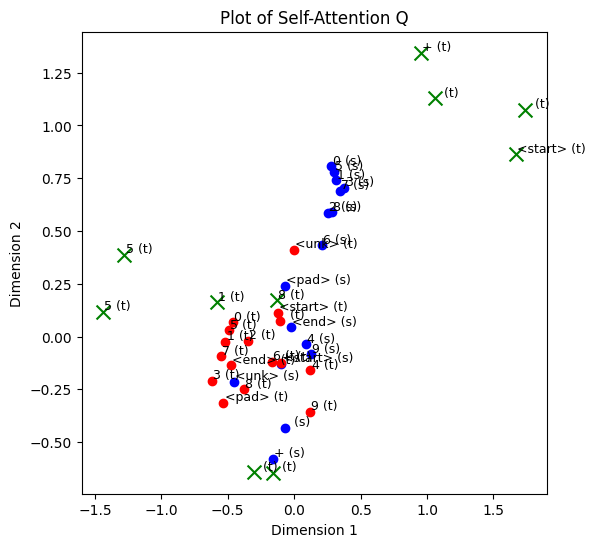

[[[ 1.4933789   1.5820361   0.46946707 -0.9740776 ]
  [ 0.06870762  0.04826249 -0.56696486  0.6129863 ]
  [ 0.14256531  0.18516839 -0.01008819 -0.38967878]
  [-1.6470414  -1.7903842  -1.9260877   2.440474  ]
  [-0.41122705 -0.48842144 -1.1186817   1.0450444 ]
  [-0.497376   -0.35002643 -0.5451736   0.93166566]
  [ 1.2756093   1.3597391   0.28467572 -0.67956465]
  [ 0.10257641  0.11908643 -0.38261726  0.3074934 ]
  [ 0.46234316  0.5151845   0.19089526 -0.6792126 ]
  [-1.4763219  -1.6153919  -1.7552217   2.1722786 ]]]
(1, 10, 4)
[[ 1.4933789   1.5820361 ]
 [ 0.06870762  0.04826249]
 [ 0.14256531  0.18516839]
 [-1.6470414  -1.7903842 ]
 [-0.41122705 -0.48842144]
 [-0.497376   -0.35002643]
 [ 1.2756093   1.3597391 ]
 [ 0.10257641  0.11908643]
 [ 0.46234316  0.5151845 ]
 [-1.4763219  -1.6153919 ]]


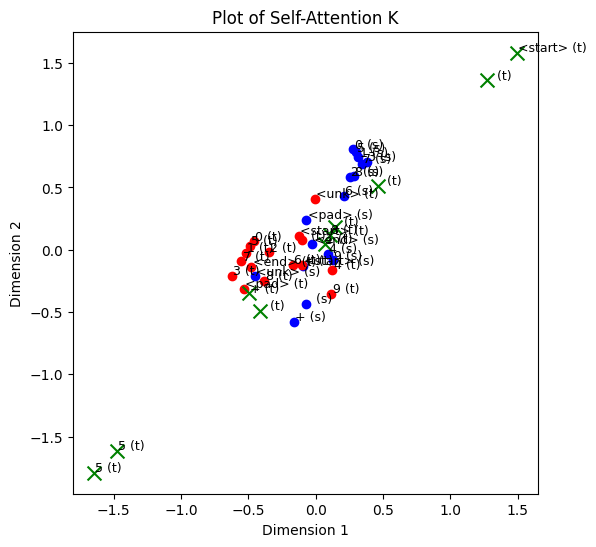

[[[ 0.22888592  0.17663535  0.4518405   0.49838567]
  [ 0.75891817  0.28342536 -0.12693013 -0.9412274 ]
  [ 0.12037133  0.6260945  -0.47412893 -0.7289601 ]
  [ 1.0959395  -0.47901723 -0.58115566 -1.5819137 ]
  [ 0.60003024 -0.6870174  -0.07659452 -0.21349032]
  [ 0.3312436  -0.9682738   0.10430816  0.35166842]
  [ 0.28153926 -0.04648737  0.46357247  0.54083675]
  [ 0.51268286  0.19123994 -0.15055123 -0.62838167]
  [ 0.09595431  0.7552234  -0.37880418 -0.63296586]
  [ 1.0450258  -0.23468818 -0.62349665 -1.6756048 ]]]
(1, 10, 4)
[[ 0.22888592  0.17663535]
 [ 0.75891817  0.28342536]
 [ 0.12037133  0.6260945 ]
 [ 1.0959395  -0.47901723]
 [ 0.60003024 -0.6870174 ]
 [ 0.3312436  -0.9682738 ]
 [ 0.28153926 -0.04648737]
 [ 0.51268286  0.19123994]
 [ 0.09595431  0.7552234 ]
 [ 1.0450258  -0.23468818]]


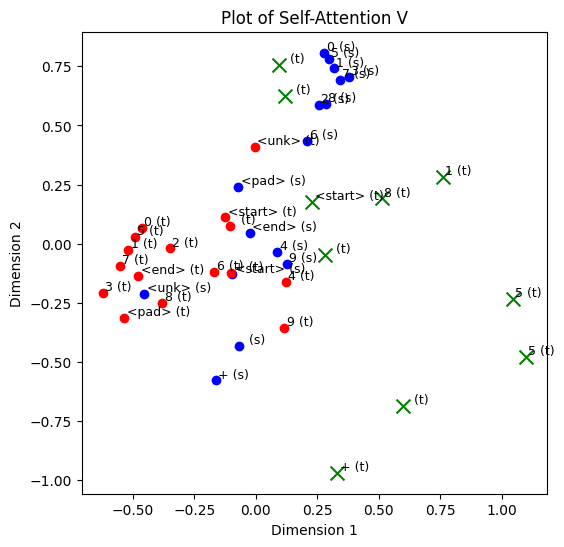

[[[ 0.27848363  0.15601878  0.23123792  0.16526027]
  [ 0.85828906 -0.32405967 -0.408894   -1.143908  ]
  [ 0.8280092  -0.2973008  -0.3937034  -1.099385  ]
  [ 0.8716163  -0.33334774 -0.42341846 -1.1747726 ]
  [ 0.2693087   0.17094517  0.22625771  0.16390343]
  [ 0.2668909   0.1682333   0.23981558  0.18514857]
  [ 0.2659793   0.15890016  0.26942998  0.22794762]
  [ 0.67514247 -0.19552808 -0.2615928  -0.79209644]
  [ 0.81896484 -0.29150984 -0.38536146 -1.080341  ]
  [ 0.9485763  -0.36799133 -0.48592138 -1.3311136 ]]]
(1, 10, 4)
[[ 0.27848363  0.15601878]
 [ 0.85828906 -0.32405967]
 [ 0.8280092  -0.2973008 ]
 [ 0.8716163  -0.33334774]
 [ 0.2693087   0.17094517]
 [ 0.2668909   0.1682333 ]
 [ 0.2659793   0.15890016]
 [ 0.67514247 -0.19552808]
 [ 0.81896484 -0.29150984]
 [ 0.9485763  -0.36799133]]


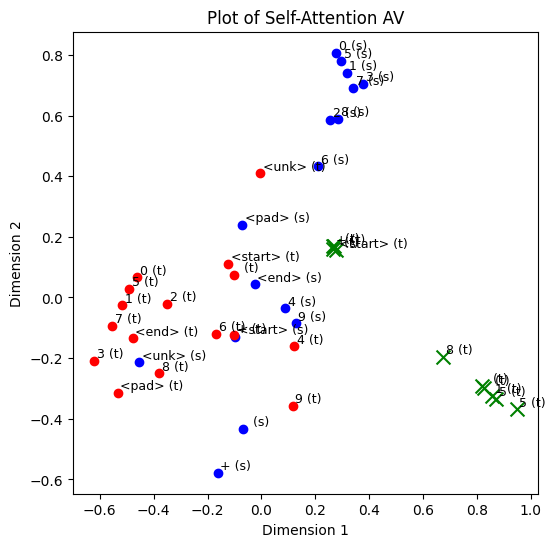

[[[ 0.29242963 -0.0740688   0.13770613  0.11342392]]

 [[-0.4238544   1.9198046  -0.37511584  0.06046323]]

 [[-0.39704964  1.8534354  -0.37348238  0.05585963]]

 [[-0.4389989   1.9662282  -0.38845196  0.05970956]]

 [[ 0.29910818 -0.07220615  0.11902566  0.10913805]]

 [[ 0.3058511  -0.10450263  0.13991371  0.11311606]]

 [[ 0.31845248 -0.16999333  0.18769084  0.12340342]]

 [[-0.24917749  1.3945179  -0.26058954  0.05062639]]

 [[-0.38811603  1.8250188  -0.3658841   0.05570196]]

 [[-0.4993256   2.1953382  -0.45684132  0.06683991]]]
(10, 1, 4)
[[ 0.29242963 -0.0740688 ]
 [-0.4238544   1.9198046 ]
 [-0.39704964  1.8534354 ]
 [-0.4389989   1.9662282 ]
 [ 0.29910818 -0.07220615]
 [ 0.3058511  -0.10450263]
 [ 0.31845248 -0.16999333]
 [-0.24917749  1.3945179 ]
 [-0.38811603  1.8250188 ]
 [-0.4993256   2.1953382 ]]


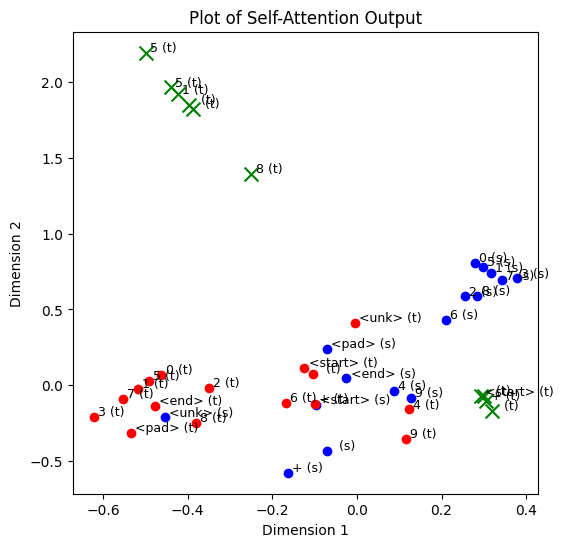

[[[-0.8353741   1.7855021   0.7350714  -1.293112  ]]

 [[-1.1195415   1.641089   -1.1160638   0.7289885 ]]

 [[-0.26764107  2.0784752  -0.8216778  -1.0356925 ]]

 [[-1.2624159   0.9449363  -0.81174934  1.4479886 ]]

 [[-0.9896796  -0.4822593   2.2089577   0.28031838]]

 [[-1.5357487   0.6045517   0.14809851  1.3799119 ]]

 [[-1.1341193   1.6452879   1.0142949  -1.0024648 ]]

 [[-1.1201174   1.794873   -0.9895449   0.4501361 ]]

 [[-0.25234362  2.071588   -0.77856374 -1.0814842 ]]

 [[-1.2098764   1.0990937  -0.97834456  1.3448901 ]]]
(10, 1, 4)
[[-0.8353741   1.7855021 ]
 [-1.1195415   1.641089  ]
 [-0.26764107  2.0784752 ]
 [-1.2624159   0.9449363 ]
 [-0.9896796  -0.4822593 ]
 [-1.5357487   0.6045517 ]
 [-1.1341193   1.6452879 ]
 [-1.1201174   1.794873  ]
 [-0.25234362  2.071588  ]
 [-1.2098764   1.0990937 ]]


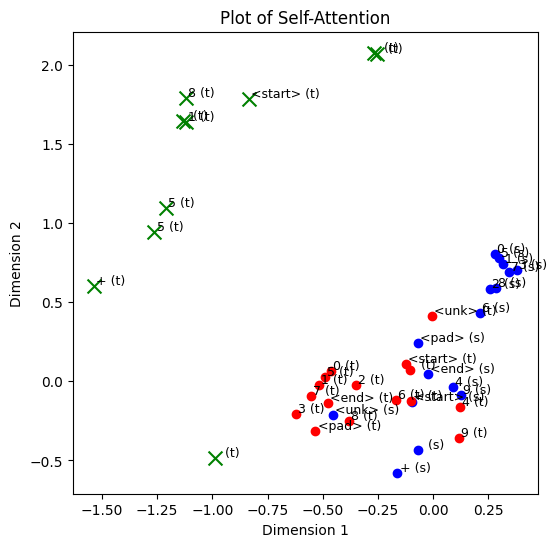

QV.shape: torch.Size([1, 10, 4])
KV.shape: torch.Size([1, 15, 4])
WV.shape: torch.Size([1, 15, 4])
attn_weight.shape: torch.Size([1, 10, 15])
AV.shape: torch.Size([1, 10, 4])
[[[-1.4370413   1.7760487   0.3689755  -1.2966799 ]
  [-1.0254779  -0.12759537 -2.421439    0.12874734]
  [ 0.24482389  0.35212967 -1.1583099  -1.6278784 ]
  [-1.5961585  -0.14888051 -2.306765    1.0546218 ]
  [-3.059295    2.180025    1.671915    1.1033187 ]
  [-2.566622    0.6522759  -1.3356298   1.3694878 ]
  [-2.06066     1.9945883   0.4461923  -0.88117605]
  [-1.0398811   0.07060841 -2.2135131  -0.1290623 ]
  [ 0.24514098  0.39145607 -1.0880834  -1.6586192 ]
  [-1.3911915  -0.2433486  -2.4476402   0.87138265]]]
(1, 10, 4)
[[-1.4370413   1.7760487 ]
 [-1.0254779  -0.12759537]
 [ 0.24482389  0.35212967]
 [-1.5961585  -0.14888051]
 [-3.059295    2.180025  ]
 [-2.566622    0.6522759 ]
 [-2.06066     1.9945883 ]
 [-1.0398811   0.07060841]
 [ 0.24514098  0.39145607]
 [-1.3911915  -0.2433486 ]]


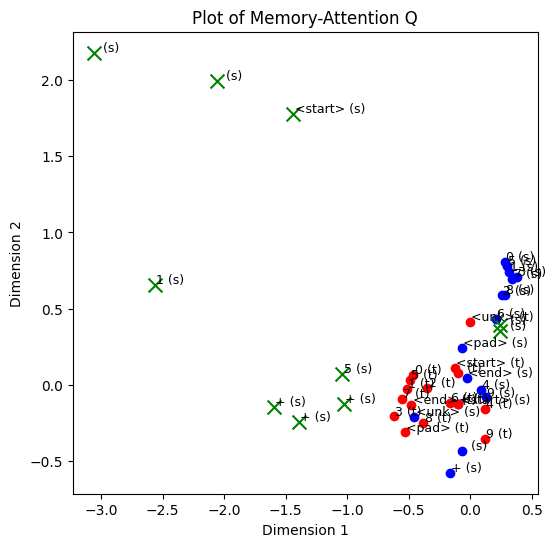

[[-2.5873542  -7.7650056  -5.898153    4.113516  ]
 [ 0.02491225 -1.2135888  -4.709598    1.5243986 ]
 [-0.47594458 -1.9969475  -5.156567    1.3736546 ]
 [-1.842775    0.50118184 -3.8816538   2.1161594 ]
 [-3.0246556  -0.64733064 -1.8812219   2.7934177 ]
 [ 0.9243954  -0.10356134  2.236121    0.4095208 ]
 [-1.419923   -2.239407   -2.2152905   2.3829184 ]
 [ 3.5096743  -1.6742307  -0.818094   -0.90171045]
 [-0.18588106 -2.2118235  -5.1941667   1.290563  ]
 [-1.3821328   0.308455   -4.3772726   1.8689482 ]
 [-2.7963638  -0.5893663  -2.3601792   2.5950441 ]
 [ 0.28278285 -0.02799085  1.6769762   0.7531041 ]
 [-1.8359957  -1.9127802  -1.7172087   2.585585  ]
 [ 3.2743897  -1.5754788  -0.25579175 -0.71645576]
 [ 1.2156768  -1.7601197  -3.9086413   0.6484872 ]]
(15, 4)
[[-2.5873542  -7.7650056 ]
 [ 0.02491225 -1.2135888 ]
 [-0.47594458 -1.9969475 ]
 [-1.842775    0.50118184]
 [-3.0246556  -0.64733064]
 [ 0.9243954  -0.10356134]
 [-1.419923   -2.239407  ]
 [ 3.5096743  -1.6742307 ]
 [-0.18588

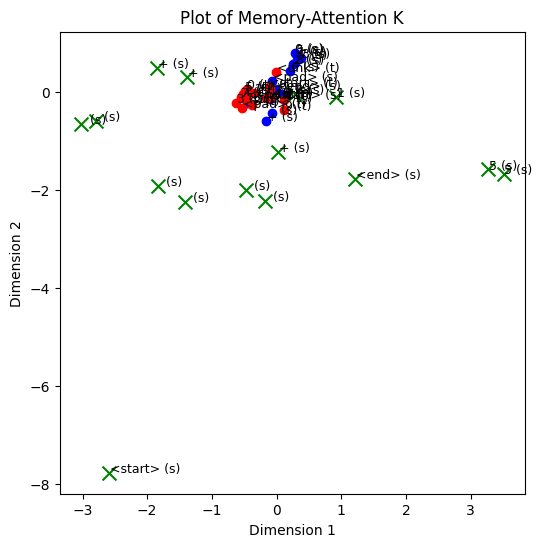

[[-4.157559   -0.22806118  1.2357246   0.5402342 ]
 [ 1.4508448   0.36097324 -1.1337703  -0.02642263]
 [ 0.05422554  0.70298916  0.3357393  -0.383374  ]
 [ 2.7505176  -0.53587735 -0.49158764 -1.1917727 ]
 [ 0.8331038  -1.1127834   0.5858201  -1.1625319 ]
 [-0.5007478   0.06357405 -0.7633241   0.786577  ]
 [-0.40591896 -0.4493605  -0.08779202 -0.03363407]
 [-1.4312079   1.8047924  -1.1555783   1.7204238 ]
 [-0.10231569  0.8126207   0.19123979 -0.19372857]
 [ 2.6538467  -0.23851366 -0.58247584 -1.0411739 ]
 [ 0.93491787 -0.902572    0.6017019  -1.18919   ]
 [-0.18725705 -0.13979931 -0.5472724   0.4329274 ]
 [-0.18144369 -0.73824126 -0.04923896 -0.20051992]
 [-1.3956933   1.5630281  -1.2213548   1.7193637 ]
 [ 0.10003449  1.0408527  -0.8392485   0.53835785]]
(15, 4)
[[-4.157559   -0.22806118]
 [ 1.4508448   0.36097324]
 [ 0.05422554  0.70298916]
 [ 2.7505176  -0.53587735]
 [ 0.8331038  -1.1127834 ]
 [-0.5007478   0.06357405]
 [-0.40591896 -0.4493605 ]
 [-1.4312079   1.8047924 ]
 [-0.10231

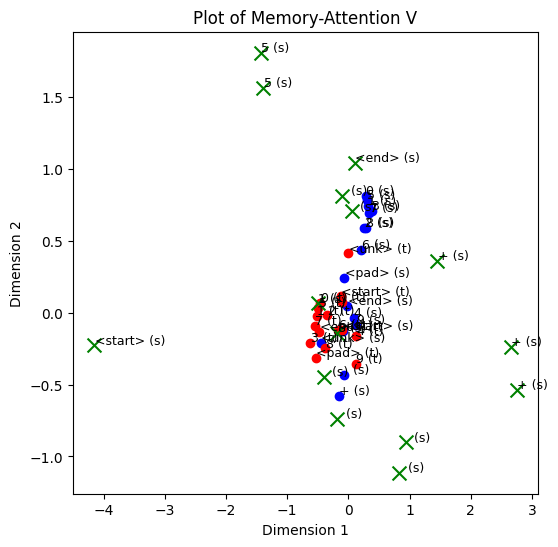

[[ 0.97634846 -0.40520814 -0.23449358 -0.47963822]
 [-3.0190296  -0.10674005  0.9285398   0.30828297]
 [ 0.22547287  0.7400922  -0.51532805  0.20616558]
 [-3.8521795  -0.2152285   1.159191    0.4703856 ]
 [ 0.85437894 -0.9403507   0.4311037  -1.024588  ]
 [-0.60793734 -0.5268979   0.5346756  -0.47334605]
 [ 1.2482003  -0.64994705  0.01644856 -0.85352653]
 [-1.7445997  -0.00966423  0.5844961   0.0409306 ]
 [ 0.18165392  0.7660541  -0.5503119   0.26173487]
 [-3.8784807  -0.20732884  1.1635315   0.4795908 ]]
(10, 4)
[[ 0.97634846 -0.40520814]
 [-3.0190296  -0.10674005]
 [ 0.22547287  0.7400922 ]
 [-3.8521795  -0.2152285 ]
 [ 0.85437894 -0.9403507 ]
 [-0.60793734 -0.5268979 ]
 [ 1.2482003  -0.64994705]
 [-1.7445997  -0.00966423]
 [ 0.18165392  0.7660541 ]
 [-3.8784807  -0.20732884]]


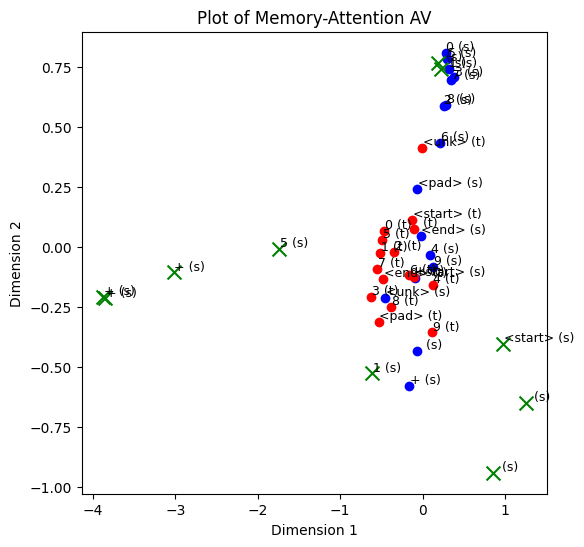

[[[ 0.29242963 -0.0740688   0.13770613  0.11342392]]

 [[-0.4238544   1.9198046  -0.37511584  0.06046323]]

 [[-0.39704964  1.8534354  -0.37348238  0.05585963]]

 [[-0.4389989   1.9662282  -0.38845196  0.05970956]]

 [[ 0.29910818 -0.07220615  0.11902566  0.10913805]]

 [[ 0.3058511  -0.10450263  0.13991371  0.11311606]]

 [[ 0.31845248 -0.16999333  0.18769084  0.12340342]]

 [[-0.24917749  1.3945179  -0.26058954  0.05062639]]

 [[-0.38811603  1.8250188  -0.3658841   0.05570196]]

 [[-0.4993256   2.1953382  -0.45684132  0.06683991]]]
(10, 1, 4)
[[ 0.29242963 -0.0740688 ]
 [-0.4238544   1.9198046 ]
 [-0.39704964  1.8534354 ]
 [-0.4389989   1.9662282 ]
 [ 0.29910818 -0.07220615]
 [ 0.3058511  -0.10450263]
 [ 0.31845248 -0.16999333]
 [-0.24917749  1.3945179 ]
 [-0.38811603  1.8250188 ]
 [-0.4993256   2.1953382 ]]


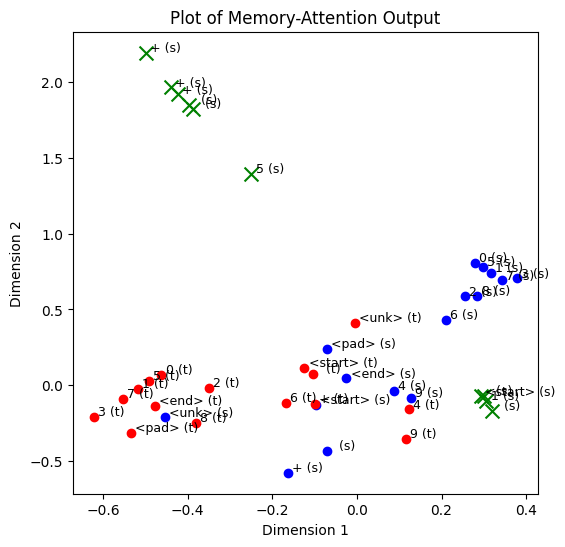

[[[ 0.03986078  1.3427339   0.0531213  -1.6152093 ]]

 [[-1.6989106   1.1557785  -0.5792552   0.8625626 ]]

 [[-0.30836698  1.5174366  -0.07009149 -1.4047389 ]]

 [[-1.7546084   0.93720824 -0.39207274  1.0757872 ]]

 [[-0.9038504   0.35809413  2.1924653  -0.8863101 ]]

 [[-1.6739794   1.0264677  -0.6572896   1.0662671 ]]

 [[-0.0297082   1.4446381  -0.17686962 -1.514118  ]]

 [[-1.6166077   1.3150208  -0.7124848   0.6624476 ]]

 [[-0.32647926  1.484035    0.06478074 -1.4392205 ]]

 [[-1.7411888   0.9752894  -0.44917205  1.0525603 ]]]
(10, 1, 4)
[[ 0.03986078  1.3427339 ]
 [-1.6989106   1.1557785 ]
 [-0.30836698  1.5174366 ]
 [-1.7546084   0.93720824]
 [-0.9038504   0.35809413]
 [-1.6739794   1.0264677 ]
 [-0.0297082   1.4446381 ]
 [-1.6166077   1.3150208 ]
 [-0.32647926  1.484035  ]
 [-1.7411888   0.9752894 ]]


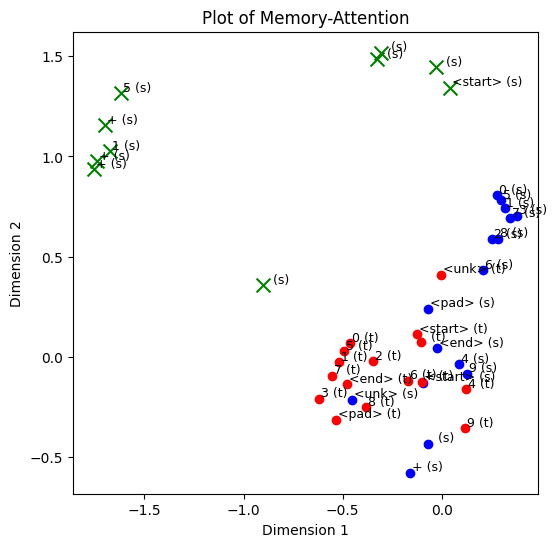

AfterLinear.shape: torch.Size([10, 1, 4])
AfterAddTGT.shape: torch.Size([10, 1, 4])
AfterAddTGT: tensor([[[ 7.8151, -6.3745, -0.7919, -1.6190]],

        [[-4.7986,  0.8284, -5.5727,  6.9801]],

        [[ 6.3037, -8.4199, -1.2520,  2.0159]],

        [[-5.1224,  1.0907, -5.3561,  6.8249]],

        [[-8.7122,  1.0383,  1.1825,  4.1544]],

        [[-4.7220,  0.7306, -5.6058,  7.0338]],

        [[ 7.5512, -7.2050, -1.0672, -0.3694]],

        [[-4.4794,  0.5496, -5.7567,  7.1253]],

        [[ 6.4603, -8.3567, -1.0580,  1.6466]],

        [[-5.0385,  1.0196, -5.4132,  6.8689]]], device='cuda:0',
       grad_fn=<NativeLayerNormBackward0>)
output.shape: torch.Size([1, 16])
output: tensor([[-43.4646, -23.5394, -27.0521,  24.8762,   6.6849, -38.1784, -11.3596,  -1.5358, -35.9349,
           6.4901,  -0.9641,  -1.0326,  -0.2698,  17.7159,  32.3575,   7.5513]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
predicted: 14

------------------

Input: + + 1 5 + 8 5
Decoded sequence: 1 5 + 8

In [44]:

# 翻訳処理を実行
seq_len_tgt = max([len(x[1]) for x in train_data])
text = '+ + 1 5 + 8 5'

tokens_src = convert_text_to_indexes(text, vocab=vocab_src)
src = torch.LongTensor(tokens_src).reshape(len(tokens_src), 1).to(device)
memory = positional_encoding(embedding_src_weight[src] * math.sqrt(embedding_size))
ys = torch.ones(1, 1).fill_(START_IDX).type(torch.long).to(device)

# 分析0
print(f"text: {text}")
print(f"memory: {memory}")
print(f"memory_size: {memory.size()}")
print("\n------------------\n")


for i in range(10):
    tgt_embed = positional_encoding(embedding_tgt_weight[ys] * math.sqrt(embedding_size))
    tgt_mask = generate_square_subsequent_mask(ys.size(0)).to(device).type(torch.bool)

    # 分析１
    print(f"iter: {i}")
    print(f"ys: {ys}")
    print(f"tgt_embed: {tgt_embed}")
    now_tgt = convert_indexes_to_text(ys.squeeze(1).tolist(), vocab_tgt)
    print(f"now tgt: {now_tgt}")
    print(f"tgt_embed: {tgt_embed}")
    plot_embedding_tgt_2d(ys=ys, tgt_embed=embedding_tgt_weight[ys], title="Embeddings")
    plot_embedding_tgt_2d(ys=ys, tgt_embed=tgt_embed, title="E+PE")
    
    # Self-attention
    self_attn_wq, self_attn_wk, self_attn_wv = self_attn_in_proj_weight.chunk(3, dim=0)
    self_attn_bq, self_attn_bk, self_attn_bv = self_attn_in_proj_bias.chunk(3, dim=0)
    QW = torch.matmul(tgt_embed.permute(1, 0, 2), self_attn_wq.T) + self_attn_bq
    KW = torch.matmul(tgt_embed.permute(1, 0, 2), self_attn_wk.T) + self_attn_bk
    VW = torch.matmul(tgt_embed.permute(1, 0, 2), self_attn_wv.T) + self_attn_bv
    self_attn_weights = F.softmax(torch.bmm(QW, KW.transpose(-2, -1)) / math.sqrt(embedding_size), dim=-1)
    AV = torch.matmul(self_attn_weights, VW)
    self_attn_output = torch.matmul(AV, self_attn_out_proj_weight.T) + self_attn_out_proj_bias
    self_attn_output = self_attn_output.permute(1, 0, 2)
    tgt = tgt_embed + self_attn_output
    tgt = loaded_model.decoder_layer.norm1(tgt)

    # 分析2
    print("SelfAttention Layer")
    print(f"QV.shape: {QW.shape}")
    print(f"KV.shape: {KW.shape}")
    print(f"WV.shape: {VW.shape}")
    print(f"attn_weight.shape: {self_attn_weights.shape}")
    print(f"AV.shape: {AV.shape}")
    # Self-Attentionのベクトルの可視化
    plot_embedding_tgt_2d(ys=ys, tgt_embed=QW, title="Self-Attention Q")
    plot_embedding_tgt_2d(ys=ys, tgt_embed=KW, title="Self-Attention K")
    plot_embedding_tgt_2d(ys=ys, tgt_embed=VW, title="Self-Attention V")
    plot_embedding_tgt_2d(ys=ys, tgt_embed=AV, title="Self-Attention AV")
    plot_embedding_tgt_2d(ys=ys, tgt_embed=self_attn_output, title="Self-Attention Output")
    plot_embedding_tgt_2d(ys=ys, tgt_embed=tgt, title="Self-Attention")

    


    # Attention with the encoder outputs (memory)
    multi_attn_wq, multi_attn_wk, multi_attn_wv = multihead_attn_in_proj_weight.chunk(3, dim=0)
    multi_attn_bq, multi_attn_bk, multi_attn_bv = multihead_attn_in_proj_bias.chunk(3, dim=0)
    QW = torch.matmul(tgt.permute(1, 0, 2), multi_attn_wq.T) + multi_attn_bq
    KW = torch.matmul(memory.permute(1, 0, 2), multi_attn_wk.T) + multi_attn_bk
    VW = torch.matmul(memory.permute(1, 0, 2), multi_attn_wv.T) + multi_attn_bv
    multi_attn_weights = F.softmax(torch.bmm(QW, KW.transpose(-2, -1)) / math.sqrt(embedding_size), dim=-1)
    AV = torch.matmul(multi_attn_weights, VW)
    multi_attn_output = torch.matmul(AV, multihead_attn_out_proj_weight.T) + multihead_attn_out_proj_bias
    multi_attn_output = multi_attn_output.permute(1, 0, 2)
    tgt = tgt + multi_attn_output
    tgt = loaded_model.decoder_layer.norm2(tgt)

    # 分析3
    print(f"QV.shape: {QW.shape}")
    print(f"KV.shape: {KW.shape}")
    print(f"WV.shape: {VW.shape}")
    print(f"attn_weight.shape: {multi_attn_weights.shape}")
    print(f"AV.shape: {AV.shape}")
    # Memory-Attentionのベクトルの可視化
    plot_embedding_tgt_2d(ys=ys, tgt_embed=QW, src=src, title="Memory-Attention Q")
    plot_embedding_tgt_2d(ys=ys, tgt_embed=np.squeeze(KW, axis=0), src=src, title="Memory-Attention K")
    plot_embedding_tgt_2d(ys=ys, tgt_embed=np.squeeze(VW, axis=0), src=src, title="Memory-Attention V")
    plot_embedding_tgt_2d(ys=ys, tgt_embed=np.squeeze(AV, axis=0), src=src, title="Memory-Attention AV")
    plot_embedding_tgt_2d(ys=ys, tgt_embed=multi_attn_output, src=src, title="Memory-Attention Output")
    plot_embedding_tgt_2d(ys=ys, tgt_embed=tgt, src=src, title="Memory-Attention")



    # Feedforward network

    # decoder linear1, 2
    tgt2 = tgt.matmul(linear1_weight.T) + linear1_bias
    tgt2 = F.relu(tgt2)
    tgt2 = tgt2.matmul(linear2_weight.T) + linear2_bias
    tgt = tgt + tgt2

    # LayerNorm
    tgt = loaded_model.decoder_layer.norm3(tgt)

    output = tgt.transpose(0, 1)
    output = loaded_model.output(output[:, -1])

    _, next_word = torch.max(output, dim=1)
    next_word = next_word.item()


    # 分析4
    print(f"AfterLinear.shape: {tgt2.shape}")
    print(f"AfterAddTGT.shape: {tgt.shape}")
    print(f"AfterAddTGT: {tgt}")
    print(f"output.shape: {output.shape}")
    print(f"output: {output}")

    ys = torch.cat([ys, torch.ones(1, 1).fill_(next_word).type_as(src.data)], dim=0)
    print(f"predicted: {next_word}")

    print("\n------------------\n")
    
    if next_word == END_IDX:
        break


flat_indexes = [idx for sublist in ys.tolist() for idx in sublist] if isinstance(ys.tolist()[0], list) else ys.tolist()

print(f"Input: {text}")
print(f"Decoded sequence: {convert_indexes_to_text(flat_indexes, vocab_tgt)}")

# Transformerの検算

スクラッチで書くための検算

## Multihead Attention

Multihead Attentionの動作をスクラッチで書きたいので、ここで検算する

参考サイト
https://blog.amedama.jp/entry/pytorch-multi-head-attention-verify

In [30]:
import torch
from torch import nn
import torch.nn.functional as F


In [31]:
edim = 4 # 埋め込み次元
num_heads = 1 # ヘッド数
model = nn.MultiheadAttention(edim, num_heads, bias=True, batch_first=True)

In [ ]:
batch_size = 2
L=5
X = torch.randn(batch_size, L, edim) # 入力

Q = K = V = X # クエリ、キー、バリューは全て入力とする
print(Q.shape)
print(Q)

In [ ]:

attn_output, attn_output_weights = model(Q, K, V)

print(attn_output.shape)
print(attn_output)



In [ ]:
from pprint import pprint
pprint(list(model.named_parameters()))

In [35]:
model_weight = {name: param.data for name, param in model.named_parameters()}
Wi = model_weight['in_proj_weight']
Wo = model_weight['out_proj.weight']
Wbi = model_weight['in_proj_bias']
Wbo = model_weight['out_proj.bias']

In [36]:
Wi_q, Wi_k, Wi_v = Wi.chunk(3, dim=0)
Wbi_q, Wbi_k, Wbi_v = Wbi.chunk(3, dim=0)
QW = torch.matmul(Q, Wi_q.T) + Wbi_q
KW = torch.matmul(K, Wi_k.T) + Wbi_k
VW = torch.matmul(V, Wi_v.T) + Wbi_v

KW_t = KW.transpose(-2, -1)
QK_t = torch.bmm(QW, KW_t)
QK_scaled = QK_t / (edim ** 0.5)
attn_weights_ = F.softmax(QK_scaled, dim=-1)

In [ ]:
print(attn_weights_)
print(attn_output_weights)

In [38]:
AV = torch.matmul(attn_weights_, VW)
attn_output_ = torch.matmul(AV, Wo.T) + Wbo

In [ ]:
print(attn_output_)
print(attn_output)

## nn.Linear

In [ ]:
model = nn.Linear(4, 4)
model

In [ ]:
pprint(list(model.named_parameters()))

In [ ]:
model_weight = {name: param.data for name, param in model.named_parameters()}
W = model_weight['weight']
B = model_weight['bias']

X = torch.randn(4) 
print(X.shape)
print(X)
output = model(X)
print(output.shape)
print(output)


In [ ]:
output_ = X.matmul(W.T) + B
print(output_)
print(output)

## nn.LayerNorm

参考サイト
https://qiita.com/dl_from_scratch/items/133fe741b67ed14f1856

In [ ]:
model = nn.LayerNorm(4)
model

In [ ]:
pprint(list(model.named_parameters()))

In [ ]:
model_weight = {name: param.data for name, param in model.named_parameters()}
W = model_weight['weight']
B = model_weight['bias']

X = torch.randn(4) 
print(X.shape)
print(X)
output = model(X)
print(output.shape)
print(output)


In [ ]:
output_ = X.matmul(W.T) + B
print(output_)
print(output)